![Image in a markdown cell](https://cursos.utnba.centrodeelearning.com/pluginfile.php/1/theme_space/customlogo/1738330016/Logo%20UTN%20Horizontal.png)

# **Diplomado de Ciencia de Datos y Análisis Avanzado**
# **Unidad 9: Proyecto Final Integrador**

---


# **Proyecto: Evaluación de desempeño del sistema de logista de entrega (delivery logistic)**

## **Curso:** Diplomado en Ciencia de Datos

## **Nombres de los Miembros del Equipo:**
### *   [Alexis Segarra]
### *   [Guido Miretti] (creador de esta versión de código del T.P.)
### *   [Alejandra Andrea Martinez]

# **Objetivo General:**
El objetivo general del proyecto es, mediante la aplicación de la metodología **CRISP-DM**, transformar los datos, en este caso particular, de empresas de logística en valor comercial. En el proceso se busca afianzar los conocimientos respecto a la metodología ya mencionada y respecto al desenvolvimiento de un proyecto real de analisis de datos.

---

# **I. Compresión Empresarial**

En esta sección, presentaremos el motivo que impulsa los objetivos de este proyecto.


## **I.1 Objetivos del negocio**

El analisis no se encuentra aplicado a una empresa particular sino al rubro de las empresas de logística en general como se podrá apreciar más adelante en el analisis de los datos. Como empresa de logística se pueden destacar los siguientes objetivos de negocio:

* **Optimización de costos operativos**: Reducir gastos en transporte, almacenamiento y distribución mediante rutas más eficientes, uso de tecnología y economías de escala. 
* **Incrementar la rentabilidad**: ligado a la *optimización de costos operativos* se busca asegurar márgenes de ganancia sostenibles ofreciendo servicios competitivos y diversificados.
* **Fidelización de clientes**: Garantizar entregas puntuales, trazabilidad y atención personalizada para construir relaciones de largo plazo.
* **Expansión de mercado**: Captar nuevos clientes y sectores, ampliar cobertura geográfica y consolidar presencia en mercados estratégicos.
* **Sostenibilidad y responsabilidad social**: Reducir la huella de carbono, optimizar el uso de recursos y cumplir con normativas ambientales, lo que también se convierte en un valor comercial frente a clientes conscientes.


## **I.2 Situación económica**

La industria logística en 2026 se encuentra en un punto de inflexión: madura en muchos aspectos, pero enfrenta tensiones estructurales y un entorno económico desafiante.

**Contexto macroeconómico**:
- La ONU proyecta un crecimiento global moderado con una desaceleración del 2,7% respecto a 2025.
- Factores como tensiones comerciales, presiones fiscales y fenómenos climáticos extremos complican las cadenas de suministro.
- La resiliencia financiera existe, pero la incertidumbre sigue siendo alta.
> https://thelogisticsworld.com/actualidad-logistica/prospecciones-economicas-onu-para-2026-como-impactaran-al-sector-logistico/

**Tendencias regionales**:
 En América Latina, especialmente Argentina y Mercosur, la logística atraviesa una transformación acelerada. Se destacan:

- Mayor presión sobre costos operativos y energéticos.
- Exigencias de trazabilidad y transparencia en la cadena así como un aumento en la demanda de digitalización (uso de la IoT).
- Competencia creciente que obliga a optimizar procesos y anticiparse a cambios.
> https://www.linkedin.com/pulse/tendencias-log%C3%ADsticas-2026-en-argentina-y-la-regi%C3%B3n-qu%C3%A9-jwgyf/


## **I.3 Objetivos del proyecto**

El proyecto tiene como objetivo satisfacer alguno de los objetivos ya mencionados del negocio, en particular, los objetivos de **incrementar la rentabilidad** y **aumentar la fidelización de clientes**. Dichos objetivos fueron seleccionados en función de los atributos presentes en el dataset. Haciendo un anticipo a los analisis, los atributos a considerar principalmente serán:

* **costo del envio**, **distancia del recorrido**, **peso del paquete** y **medio de transporte** para trabajar con el **objetivo de rentabilidad**.
* **estado del envio** y **rating del delivery** para trabajar con el **objetivo de fidelización de clientes**.
* **distancia del recorrido**, **medio de transporte**, **clima**, **tiempo estimado de delivery** y **tiempo insumido de delivery** para trabajar en la estimación del tiempo de entrega lo cual repercute en el **estado del envio** para trabajar con el **objetivo de fidelización de clientes** en caso de existir una correlación entre el **estado del envio** y el **rating del delivery**.
* **empresa de delivery**, **rating del delivery**, **costos del envio** y **región de delivery** para trabajar en la **expansión del mercado**. (para futuros proyectos)
* **peso del paquete**, **distancia del recorrido** y **medio de transporte** para trabajar respecto a la **sostenibilidad y responsabilidad social**. (para futuros proyectos)

## **I.4 Plan del proyecto**

1. ***Comprensión del negocio empresarial***: indagamos las necesidades de la empresa (en este caso el rubro de logística) para saber que tenemos que satisfacer. Además aprendemos el funcionamiento de dicho rubro.
2. ***Comprensión de los datos***: identificamos, recopilamos y analizamos los conjuntos de datos que pueden ayudar a alcanzar los objetivos del proyecto.
3. ***Preparación de los datos***: preparamos el conjunto de datos finales para el modelado, es decir, seleccionamos atributos o definimos nuevos en función de los preexistentes, realizamos una limpieza de los datos y le damos el formato necesario para poder alimentar los modelos.
4. ***Modelado***: construimos y evaluamos, a través de métricas, diversos modelos basados en diversas técnicas de modelado y tipo de problema (clasificación o regresión).
5. ***Evaluación***: en esta etapa no evaluamos las métricas de los modelos sino el desenvolvimiento del proyecto, es decir, si se cumplieron los objetivos, si son necesarias revisiones o ya se puede pasar a la última etapa del proyecto.
6. ***Despliegue***: preparación y puesta en producción a los modelos. En principio, al ser un proyecto hipotético, solo realizamos el plan de implementación (como se integraría al sistema actual de la empresa de logística) y mantenimiento pero sin aplicación real de los modelos.

# **II. Compresión de Datos**

En esta sección, como ya se mencionó en el plan del proyecto, identificaremos, recopilaremos y analizaremos un conjunto de datos para obtener información útil a los fines de las empresas de logística.


## **II.0. Configuración Inicial e Importación de Librerías**

En esta sección, importaremos todas las librerías necesarias para el proyecto.


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.ticker import MultipleLocator
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
from statsmodels.datasets import get_rdataset
import statsmodels.api as sm_stats
import statsmodels.formula.api as smf
from scipy.stats import chi2_contingency

from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from scipy import stats


# Configuraciones adicionales para una mejor visualización
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)
# Ignorar warnings para una salida más limpia (opcional)
import warnings
warnings.filterwarnings('ignore')

##  **II.1. Recopilación de Datos**

Los datos empleados en el proyecto se adquirieron de la plataforma *Kaggle* y fueron provistos por *Muhammad Ahmad*. Los mismos se pueden obtener accediendo al siguiente enlace:

https://www.kaggle.com/datasets/muhammadahmaddaar/delivery-logistics-dataset-india-multi-partner

Procedemos a cargar el dataset llamado `Delivery_Logistics.csv` a nuestro programa.

In [2]:
# Carga de dataset
try:
    df = pd.read_csv('Delivery_Logistics.csv')
    
except FileNotFoundError:
    print("Asegúrate de que los archivos .csv estén en el mismo directorio que este cuaderno.")
    # Si usas Colab, puedes subir los archivos al entorno de ejecución.
    exit()

## **II.2. Descripción y Verificación de Calidad de Datos**

Como primer acercamiento del **EDA**, examinamos los datos apreciando sus propiedades de forma superficial, es decir, el formato de los datos, el número de registros, las identidades de campo, entre otras propiedades para entender con que información disponemos.


### **II.2.1 Estructura de los datos**
Vemos la cantidad de filas y columnas que componen nuestro dataset así como también el tipo de datos. 

In [3]:
# Obtenemos una visión general de los datos
print("Forma del dataset (nro. de filas, nro. de columnas):\n", df.shape)

print("\nPrimeras 20 filas del dataset de entrenamiento:")
display(df.head(20))

print("\nInformación del dataset de entrenamiento:\n")
df.info()

Forma del dataset (nro. de filas, nro. de columnas):
 (25000, 15)

Primeras 20 filas del dataset de entrenamiento:


,delivery_id,delivery_partner,package_type,vehicle_type,delivery_mode,region,weather_condition,distance_km,package_weight_kg,delivery_time_hours,expected_time_hours,delayed,delivery_status,delivery_rating,delivery_cost
0,250.99,delhivery,automobile parts,bike,same day,west,clear,297.0,46.96,1970-01-01 00:00:00.000000008,1970-01-01 00:00:00.000000008,no,delivered,3,1632.7206
1,250.99,xpressbees,cosmetics,ev van,express,central,cold,89.6,47.39,1970-01-01 00:00:00.000000002,1970-01-01 00:00:00.000000003,no,delivered,5,640.1700
2,250.99,shadowfax,groceries,truck,two day,east,rainy,273.5,26.89,1970-01-01 00:00:00.000000010,1970-01-01 00:00:00.000000016,no,delivered,4,1448.1700
3,250.99,dhl,electronics,ev van,same day,east,cold,269.7,12.69,1970-01-01 00:00:00.000000006,1970-01-01 00:00:00.000000008,no,delivered,3,1486.5700
4,250.99,dhl,clothing,van,two day,north,foggy,256.7,37.02,1970-01-01 00:00:00.000000009,1970-01-01 00:00:00.000000016,no,delivered,4,1394.5600
5,250.99,amazon logistics,documents,ev bike,express,west,rainy,48.4,33.15,1970-01-01 00:00:00.000000004,1970-01-01 00:00:00.000000002,yes,delayed,3,391.4500
6,250.99,delhivery,groceries,scooter,same day,central,clear,198.3,43.79,1970-01-01 00:00:00.000000006,1970-01-01 00:00:00.000000008,no,delivered,3,1222.8700
7,250.99,xpressbees,fragile items,van,same day,north,cold,114.6,42.63,1970-01-01 00:00:00.000000004,1970-01-01 00:00:00.000000008,no,delivered,3,800.8900
8,250.99,blue dart,clothing,van,same day,south,hot,142.4,14.06,1970-01-01 00:00:00.000000005,1970-01-01 00:00:00.000000008,no,delivered,5,854.1800
9,250.99,delhivery,pharmacy,truck,same day,east,foggy,47.1,29.28,1970-01-01 00:00:00.000000003,1970-01-01 00:00:00.000000008,no,delivered,5,423.3400



Información del dataset de entrenamiento:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   delivery_id          25000 non-null  float64
 1   delivery_partner     25000 non-null  object 
 2   package_type         25000 non-null  object 
 3   vehicle_type         25000 non-null  object 
 4   delivery_mode        25000 non-null  object 
 5   region               25000 non-null  object 
 6   weather_condition    25000 non-null  object 
 7   distance_km          25000 non-null  float64
 8   package_weight_kg    25000 non-null  float64
 9   delivery_time_hours  25000 non-null  object 
 10  expected_time_hours  25000 non-null  object 
 11  delayed              25000 non-null  object 
 12  delivery_status      25000 non-null  object 
 13  delivery_rating      25000 non-null  int64  
 14  delivery_cost        25000 non-null  float

### **II.2.2 Valores nulos, duplicados y únicos**
Vemos si el dataset contiene valores nulos (ya los vimos en el item anterior con la función describe), filas dúplicadas y la cantidad de valores únicos que posee cada columna (en caso de ser pocos los mencionamos). 

In [4]:

duplicadas = df[df.duplicated(keep=False)]

cantidad = df.duplicated().sum()
print("Número de filas duplicadas:", cantidad)


print("\n", duplicadas)

Número de filas duplicadas: 0

 Empty DataFrame
Columns: [delivery_id, delivery_partner, package_type, vehicle_type, delivery_mode, region, weather_condition, distance_km, package_weight_kg, delivery_time_hours, expected_time_hours, delayed, delivery_status, delivery_rating, delivery_cost]
Index: []


In [5]:
def get_unique_values(df):
    
    output_data = []

    for col in df.columns:

        # Si el número de valores únicos en las columnas es menor o igual que 10 se muestran dichos valores
        if df.loc[:, col].nunique() <= 10:
            # Levantamos los valores únicos de la columna
            unique_values = df.loc[:, col].unique()

            # Realizamos append a el nombre de la columna, el número de valores únicos, los valores únicos si cumplen la condición de cantidad máxima, y el tipo de dato de la columna
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Caso contrario, solo se realiza el append de todo salvo los valores únicos
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,delivery_id,24502,-,float64
1,delivery_partner,9,"[delhivery, xpressbees, shadowfax, dhl, amazon...",object
2,package_type,9,"[automobile parts, cosmetics, groceries, elect...",object
3,vehicle_type,6,"[bike, ev van, truck, van, ev bike, scooter]",object
4,delivery_mode,4,"[same day, express, two day, standard]",object
5,region,5,"[west, central, east, north, south]",object
6,weather_condition,6,"[clear, cold, rainy, foggy, hot, stormy]",object
7,distance_km,2935,-,float64
8,package_weight_kg,4853,-,float64
9,delivery_time_hours,20,-,object


### **II.2.3 Resumen**

Realizado el análisis superficial, se pueden destacar los siguientes puntos:

* El dataset está conformado por 15 columnas/propiedades con información de tipo flotante, entero y objeto.
* Posee 25.000 filas dentro de las cuales ninguna se repiten. No hace falta evaluar posibles errores de input.
* El dataset no cuenta con valores nulos. No hace falta tratamiento de valores nulos.

La calidad de los datos se puede considerar como excelente siendo las propiedades temporales las únicas que requieren de una cambio de formato (exceptuando los pasos de estandarización y encoding requerido para el resto de propiedades).

**Contenido de las columnas del dataset:**

* **delivery_id:**  El id del envío (posible a eliminar al no aportar valor para el modelado).
* **delivery_partner:** La compañia encargada del envío (*delhivery, dhl, amazon logistics, entre otros*).
* **package_type:** El tipo de producto enviado (*partes de automoviles, cosméticos, comestibles, electrónicos, entre otros*).
* **vehicle_type:** El vehículo utilizado para realizar el envío (*moto, van eléctrica, camión, van, moto eléctrica o scooter*).
* **delivery_mode:** El modo de envío realizado (*mismo día; expreso; 2 días; estandar*).
* **region:** La región de E.E.U.U donde se realizó el envío (*norte, sur, oeste, este y central*).
* **distance_km:** La distancia del recorrido del delivery (undidad de medida: *kilómetros*).
* **package_weight_kg:** El peso del paquete transportado (unidad de medida: *kilogramos*).
* **delivery_time_hours:** El tiempo demorado por el repartidor (se encuentra en *horas* pero con un formato peculiar el cual deberá ser tratado).
* **expected_time_hours:** El tiempo esperado de tardanza del envio (mismo formato que el de *delivery_time_hours*).
* **delayed:** Si el envío se demoró o no (si el envío tardó menos o el tiempo esperado de tardanza).
* **delivery_status:** El estado del envío (*entregado, demorado o fallido*).
* **delivery_rating:** El puntaje emitido por el usuario acerca del envío (*5, 4, 3, 2 y 1 siendo 5 el mejor puntaje y 1 el peor*).
* **delivery_cost:** El costo del envío (costo en *USD*).

## **II.3 Exploración de datos**

Profundización en los datos, es decir, observar la distribución de las variables numéricas, los outliers, visualizarlos e identificar relaciones entre ellos.

### **II.3.0 Pre-tratamiento de las variables *delivery_time_hours* y *expected_time_hours***

Como se mencionó previamente, estas variables, que en principio uno asumiría son variables numéricas pero a causa de la notación con la que se brindan en el dataset (1970-01-01 00:00:00.00000000x donde "x" es el valor numérico de las horas de demora/esperadas) se toman como variables objeto, hay que transformarlas antes de evaluarlas. Creamos una copia del dataframe original para tener los datos originales (**df_1**).

In [6]:
df_1 = df.copy()
df_1['delivery_time_hours'] = df['delivery_time_hours'].str.extract(r'\.(\d+)$').astype(int)
df_1['expected_time_hours'] = df['expected_time_hours'].str.extract(r'\.(\d+)$').astype(int)

# La transformación en cuestión transforma los elementos de la columna 'delivery_time_hours' y 'expected_time_hours' en cadenas de texto y luego con extract buscamos, a partir
# de un patrón de expresión regular, los dígitos que representan las hora. El patrón regular en este caso sería '\.(\d+)$' donde:
# \. busca un punto literal (.) (notar que el patrón que se repite previo al punto).
# (\d+) captura uno o más dígitos (\d = dígito, + = uno o más).
# $ asegura que esos dígitos estén al final de la cadena.
# Finalmente, convertimos esos dígitos extraídos a enteros utilizando astype(int).

print("Comparación entre la nomenclatura original y la nueva nomenclatura de las columnas 'delivery_time_hours' y 'expected_time_hours':\n")
df_comparacion = pd.DataFrame({
    'Original delivery_time_hours': df['delivery_time_hours'],   
    'Nueva delivery_time_hours': df_1['delivery_time_hours'],
    'Original expected_time_hours': df['expected_time_hours'],   
    'Nueva expected_time_hours': df_1['expected_time_hours']
})
df_comparacion.head(20)

Comparación entre la nomenclatura original y la nueva nomenclatura de las columnas 'delivery_time_hours' y 'expected_time_hours':



,Original delivery_time_hours,Nueva delivery_time_hours,Original expected_time_hours,Nueva expected_time_hours
0,1970-01-01 00:00:00.000000008,8,1970-01-01 00:00:00.000000008,8
1,1970-01-01 00:00:00.000000002,2,1970-01-01 00:00:00.000000003,3
2,1970-01-01 00:00:00.000000010,10,1970-01-01 00:00:00.000000016,16
3,1970-01-01 00:00:00.000000006,6,1970-01-01 00:00:00.000000008,8
4,1970-01-01 00:00:00.000000009,9,1970-01-01 00:00:00.000000016,16
5,1970-01-01 00:00:00.000000004,4,1970-01-01 00:00:00.000000002,2
6,1970-01-01 00:00:00.000000006,6,1970-01-01 00:00:00.000000008,8
7,1970-01-01 00:00:00.000000004,4,1970-01-01 00:00:00.000000008,8
8,1970-01-01 00:00:00.000000005,5,1970-01-01 00:00:00.000000008,8
9,1970-01-01 00:00:00.000000003,3,1970-01-01 00:00:00.000000008,8


### **II.3.1 Variables numéricas**

### II.3.1.1 Distribución

Realizamos una descripción estadística básica de las variables numéricas además de ver su distribución.

In [7]:
# Descripción estadística básica
df_1.describe().T

,count,mean,std,min,25%,50%,75%,max
delivery_id,25000.0,12500.500000,7212.732314,250.9900,6250.75,12500.500,18750.25,24750.0100
distance_km,25000.0,150.390436,86.409745,3.6000,75.90,151.000,224.90,297.1000
package_weight_kg,25000.0,25.145898,14.368663,0.6700,12.68,25.145,37.66,49.5200
delivery_time_hours,25000.0,6.248040,3.140935,0.0000,4.00,6.000,8.00,19.0000
expected_time_hours,25000.0,13.107680,7.559024,2.0000,8.00,8.000,16.00,24.0000
delivery_rating,25000.0,3.666000,1.149964,1.0000,3.00,4.000,5.00,5.0000
delivery_cost,25000.0,864.944579,435.712593,95.6674,490.80,867.535,1237.91,1632.7206


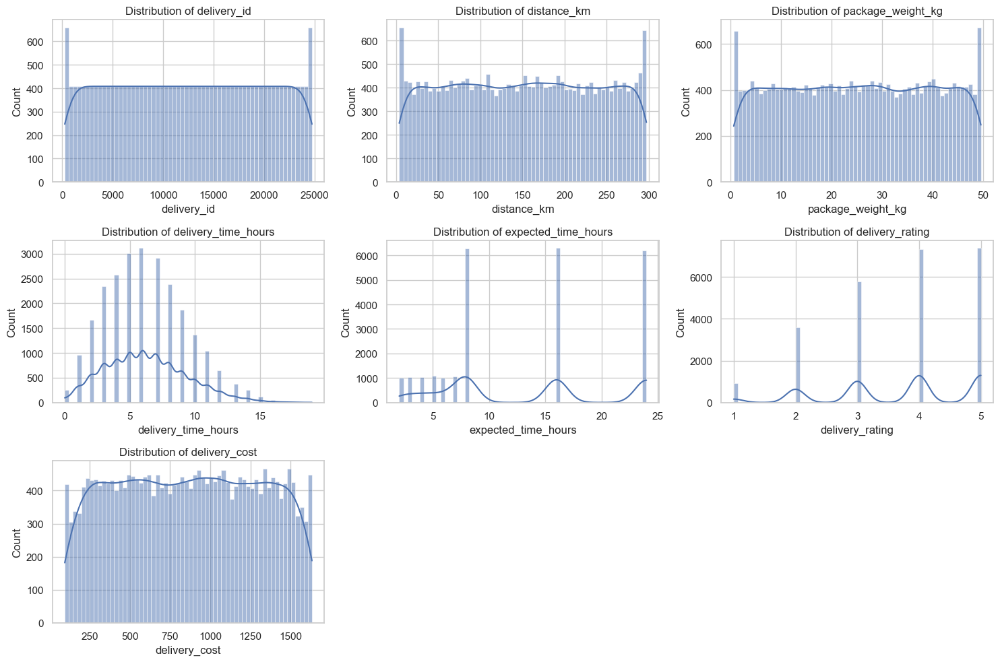

In [8]:
# Observamos la distribución de las variables numéricas
numerical_df = df_1.select_dtypes(include=['number'])

plt.figure(figsize=(15, 10))

num_vars = len(numerical_df.columns)

for i, var in enumerate(numerical_df.columns, 1):
    plt.subplot((num_vars // 3) + 1, 3, i)
    sns.histplot(data=df_1, x=var, bins=60, kde=True)
    plt.title(f'Distribution of {var}')
    
plt.tight_layout()
plt.show()

Se puede apreciar a partir de los datos estadísticos, las distribuciones y el primer vistazo de las variables lo siguiente:
- La variable **delivery_id** parece no tener una razón de ser siendo este arbitrario, distribuido de manera escalonada y en igual proporción para todo el dataset salvo en los valores extremos 250.99 y 24750.01. Esta variable, como consecuencia, será eliminada del dataset.
- La distribución de los valores de las variables **distance_km**, **pakage_weight_kg** y **delivery_cost** se encuentran uniformemente distribuidos a lo largo de todos sus valores distanciandose en los valores extremos. Para el caso de **distance_km**, **pakage_weight_kg** los extremos se encuentran por encima de la media en cuanto a conteo mientras que en el caso de **delivery_cost** decae. 
- **delivery_time_hours** tiene una distribución relativamente normal lo cual, a la hora de utilizarla para entrenar un modelo de regresión, supone una característica positiva.
- La variable **delivery_rating** es de caracter discreto decantandose por los valores más altos (la mejor calificación).
- **expected_time_hours**, si bien en principio se espera que sea continua, aparenta ser discreta y no calculada sino designada a partir de una lista de valores fijos que dependen de cierta característica del envio.

### II.3.1.2 Outliers

Vemos los posibles outliers de las variables numéricas haciendo uso de los boxplots.

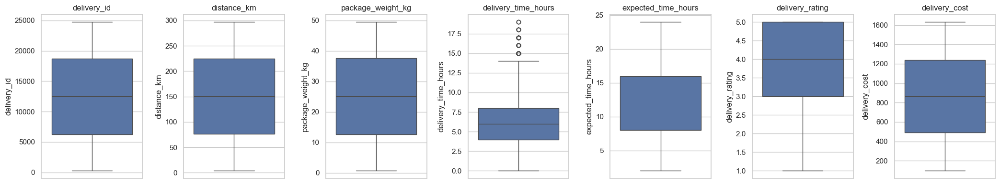

In [9]:
# Inicializamos el contador del subplot
x = 0

# Creaamos una figura tal que no se solapen los títulos de los gráficos
plt.figure(figsize=(24, 4))

# Pasamos por todas las variables numéricas y creamos un boxplot para cada una
for col in df_1.select_dtypes(include=['number']).columns:
    x += 1
    plt.subplot(1, 8, x)
    sns.boxplot(data=df_1[col])
    plt.title(col)

# Mostramos los boxplots
plt.tight_layout()  
plt.show()

Los datos numéricos no presentan outliers con excepción de la variable **delivery_time_hours**. Para dicha variable, los outliers posiblemente estén asociados a los casos en donde el envío falló o se demoró (lo revisarémos más adelante en el analisis multivariado).

En principio se conservarán los datos pero se considerará como opción el removerlos en caso de estar en la busqueda de una mejora del desempeño del modelo.

### II.3.1.3 Curtosis y Asimetría

In [10]:
# Calculate skewness for numeric features

# A skewness value greater than 1 indicates positive skewness,
# a skewness value less than -1 indicates negative skewness,
# and a skewness value close to zero indicates a relatively symmetric distribution.

num_cols= df_1.select_dtypes('number').columns

skew_vals = df_1[num_cols].skew()

kurt_vals = df_1[num_cols].kurt()

# Unimos todo en un mismo DataFrame
stats_df = pd.DataFrame({
    'Skewness': skew_vals,
    'Kurtosis': kurt_vals
})

# Ordenamos por asimetría absoluta para ver las más sesgadas primero
stats_df = stats_df.reindex(stats_df['Skewness'].abs().sort_values(ascending=False).index)

stats_df

,Skewness,Kurtosis
delivery_rating,-4.731261e-01,-0.738847
delivery_time_hours,4.128956e-01,-0.120589
expected_time_hours,2.679564e-01,-1.360180
package_weight_kg,-2.606811e-03,-1.199496
distance_km,1.882955e-03,-1.196196
delivery_cost,1.107873e-03,-1.172019
delivery_id,-5.330681e-17,-1.202673


Se apreciaba en los gráficos de distribución pero se confirma con el cálculo de la asimetría (skewness) y la curtosis. Salvo la variable de emisiones de CO₂, las demás variables tienen una asimetría moderada a las cuales se les podría aplicar una transformación. Respecto a la curtosis, las variables de consumo de combustible en autopista y consumo combinado necesitan ser tratadas. 

### **II.3.2 Variables categóricas**

Realizamos una descripción "estadística" básica de las variables categóricas además de ver su distribución.

In [11]:
# Realizamos una descripción estadística básica de las variables objeto

df_1.describe(include= 'object').T

,count,unique,top,freq
delivery_partner,25000,9,xpressbees,2826
package_type,25000,9,fragile items,2848
vehicle_type,25000,6,ev bike,4218
delivery_mode,25000,4,two day,6302
region,25000,5,west,5095
weather_condition,25000,6,foggy,4219
delayed,25000,2,no,18331
delivery_status,25000,3,delivered,18331


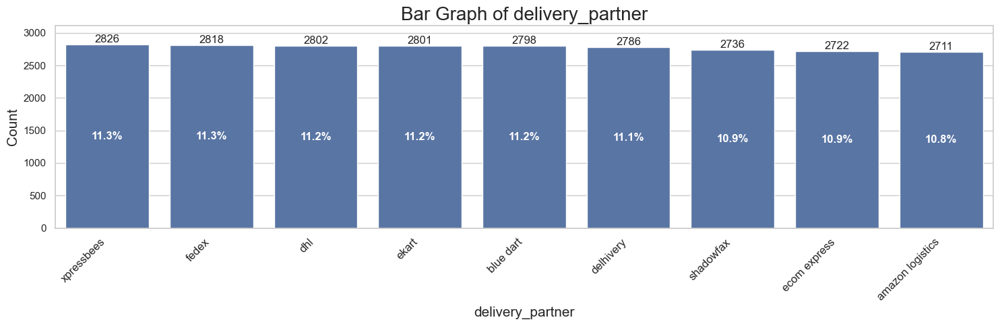

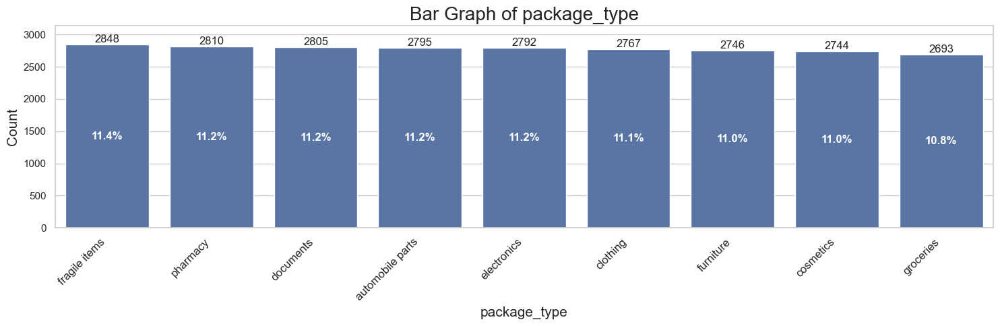

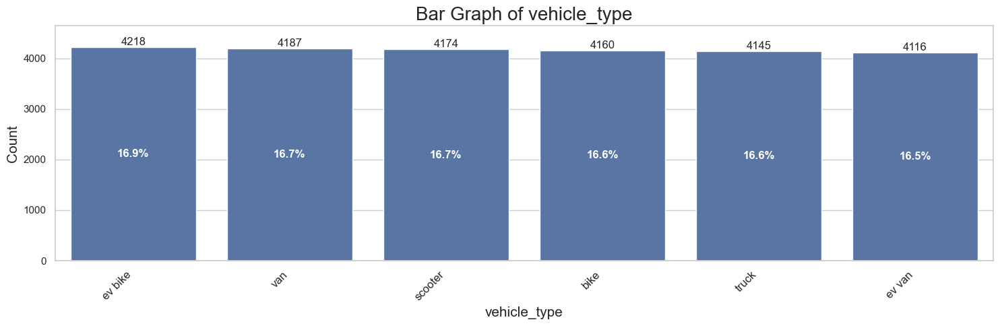

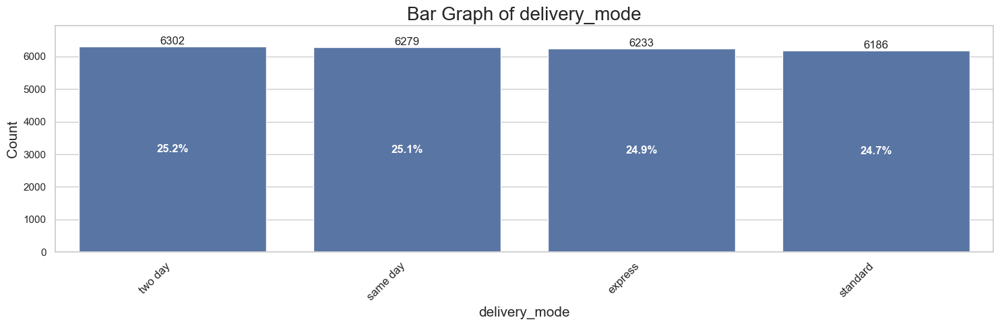

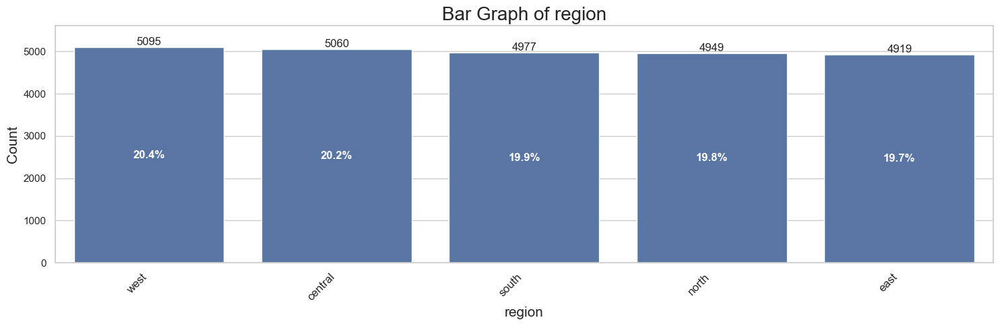

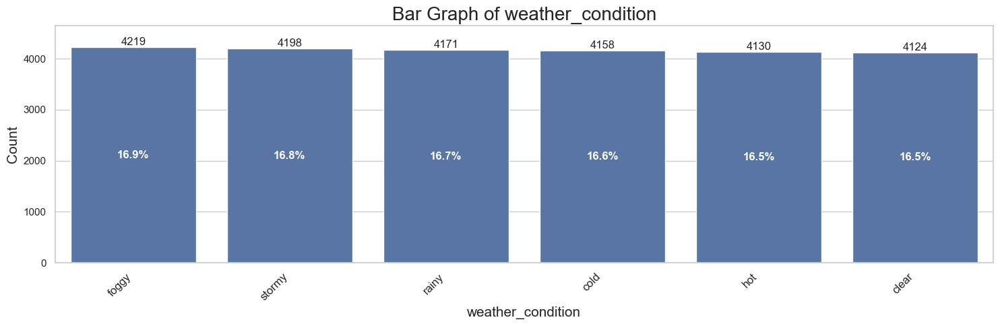

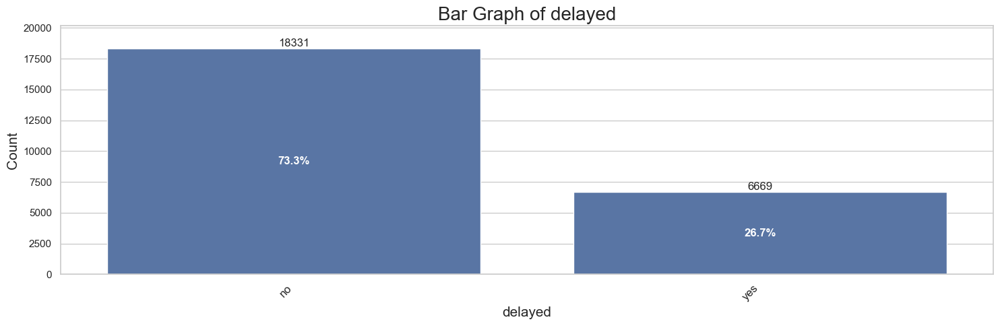

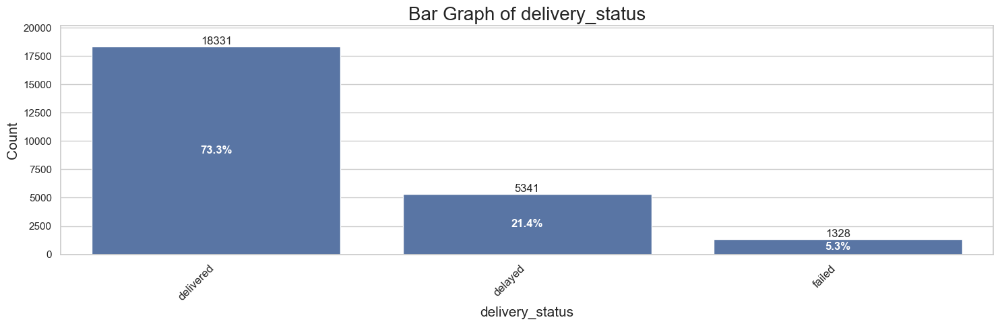

In [12]:
def plot_bar_graphs(df):
    # Selecciona automáticamente las columnas de tipo object o category
    cat_columns = df.select_dtypes(include=['object', 'category']).columns
    
    for column in cat_columns:
        plt.figure(figsize=(15, 5))
        ax = sns.countplot(
            x=column, 
            data=df, 
            order=df[column].value_counts().index
        )
        
        total = len(df[column])
        
        # Conteo absoluto arriba de cada barra
        for container in ax.containers:
            ax.bar_label(container, labels=[f'{int(v.get_height())}' for v in container])
        
        # Porcentaje centrado dentro de cada barra
        for p in ax.patches:
            height = p.get_height()
            if height > 0:  # evitamos división por cero
                percentage = f'{height/total:.1%}'
                ax.text(
                    p.get_x() + p.get_width()/2,   # posición horizontal centrada
                    height/2,                      # posición vertical en el medio de la barra
                    percentage,
                    ha='center', va='center', fontsize=12, color='white', fontweight='bold'
                )
        
        plt.xlabel(column, fontsize=15)
        plt.ylabel('Count', fontsize=15)
        plt.title(f'Bar Graph of {column}', fontsize=20)
        plt.xticks(rotation=45, ha='right', fontsize=12)
        ax.set_ylim(0, df[column].value_counts().max() * 1.1) #Agregamos un desfasaje/espacio entre el tope de la barra más alta y el límite del eje para que no se solape el texto
        plt.tight_layout()
        plt.show()


plot_bar_graphs(df_1)

Todas las variables categóricas, a excepción de **delayed** y **delivery_status**, se encuentran balanceadas.

### **II.3.3 Multivariable**

Realizamos un analisis para ver las relaciones entre las distintas variables. En particular, la relación que tienen las distintas variables con respecto nuestras variables de interes (con el objetivo de la empresa):
* **delivery_time_hours** para ver de qué depende el tiempo que le toma al delivery repartir su pedido.
* **delivery_rating** para ver de qué depende la satisfacción del cliente.
* **delivery_cost** para ver de qué depende el costo del delivery.
* **delivery_status[failed]** para ver si hay algún patrón predecible o se excluyen los casos del dataset para entrenar los modelos.

#### **Delivery_rating:**

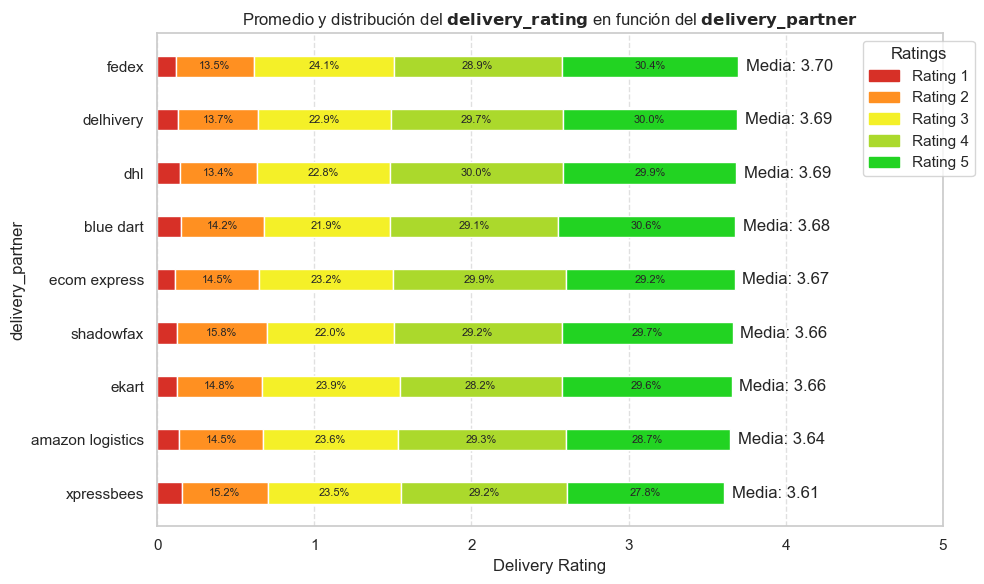

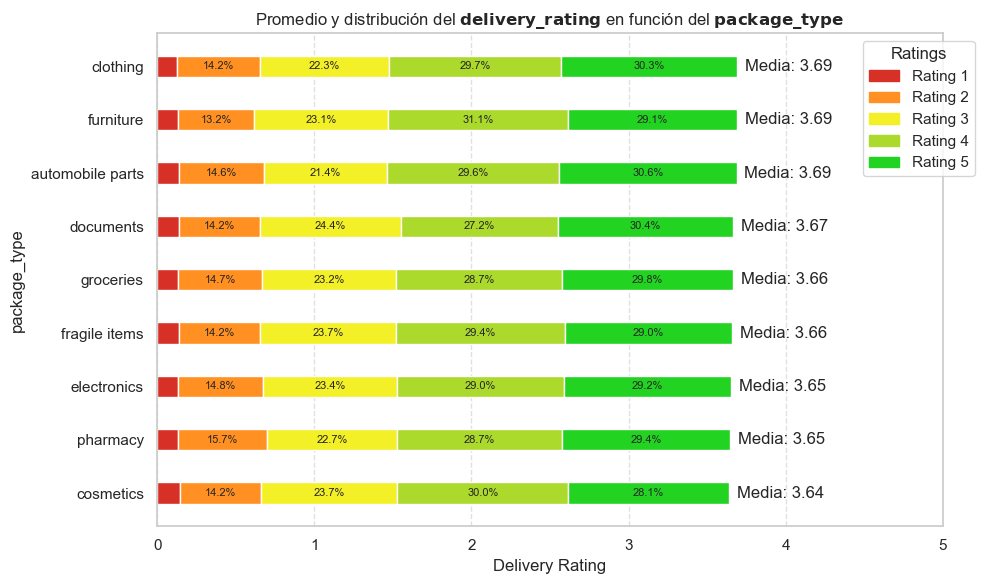

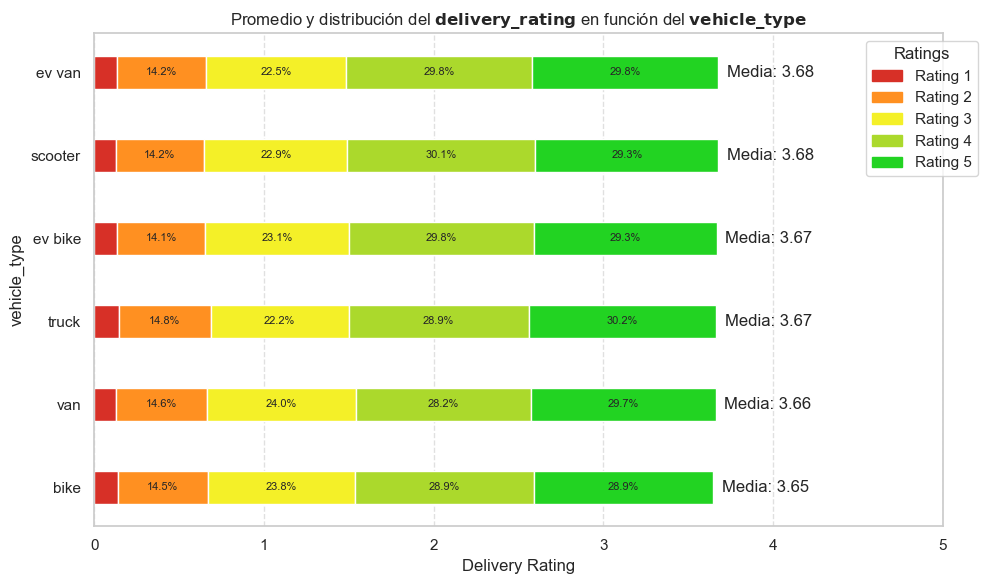

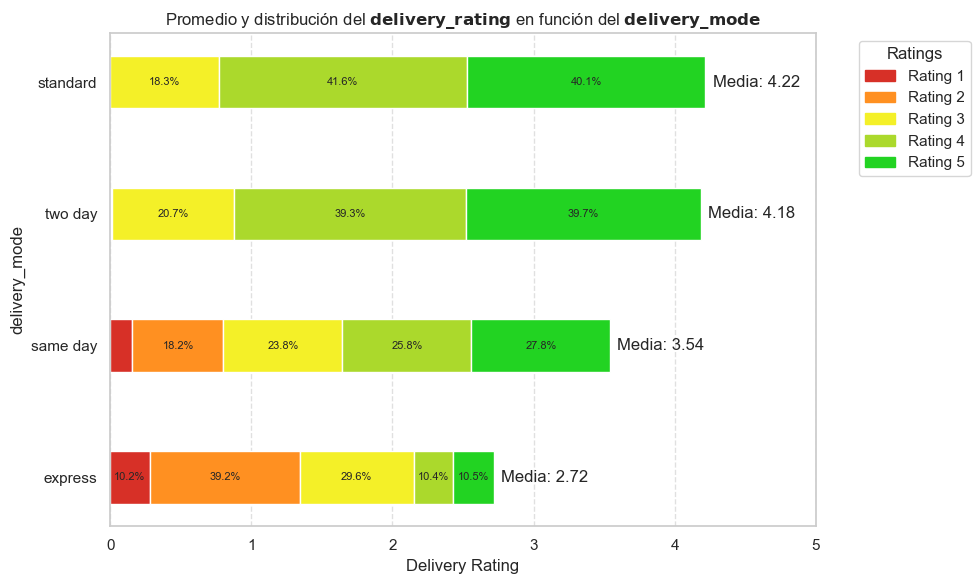

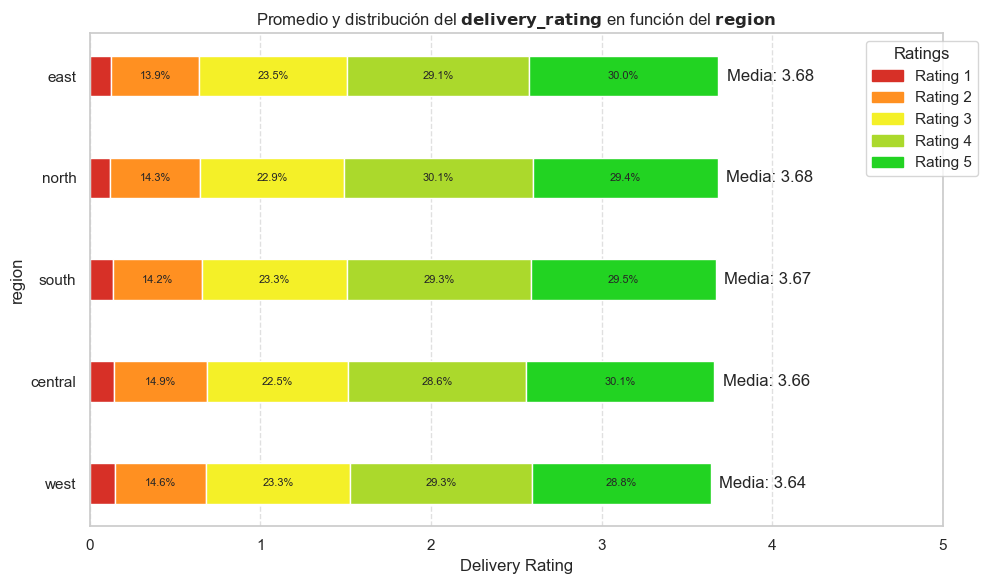

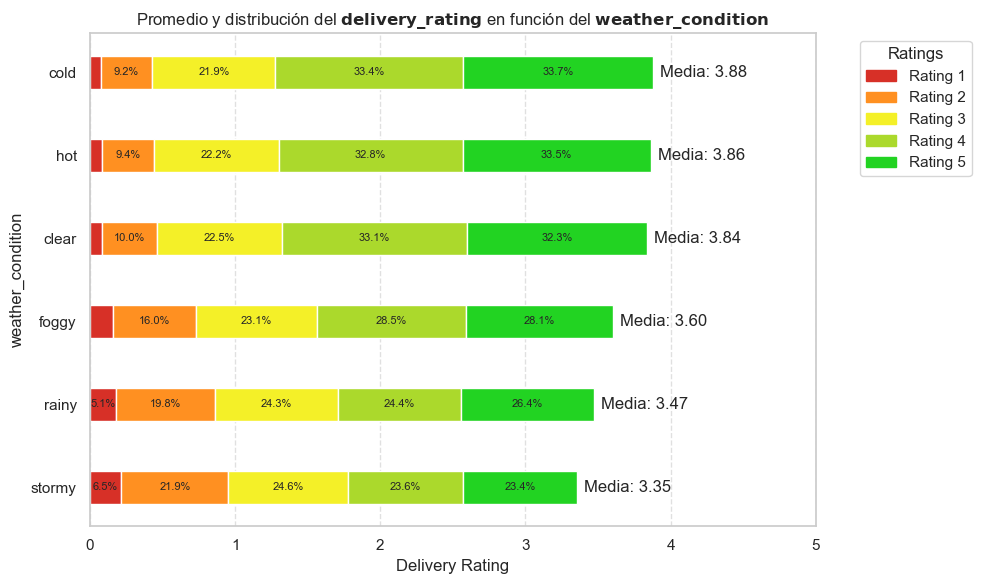

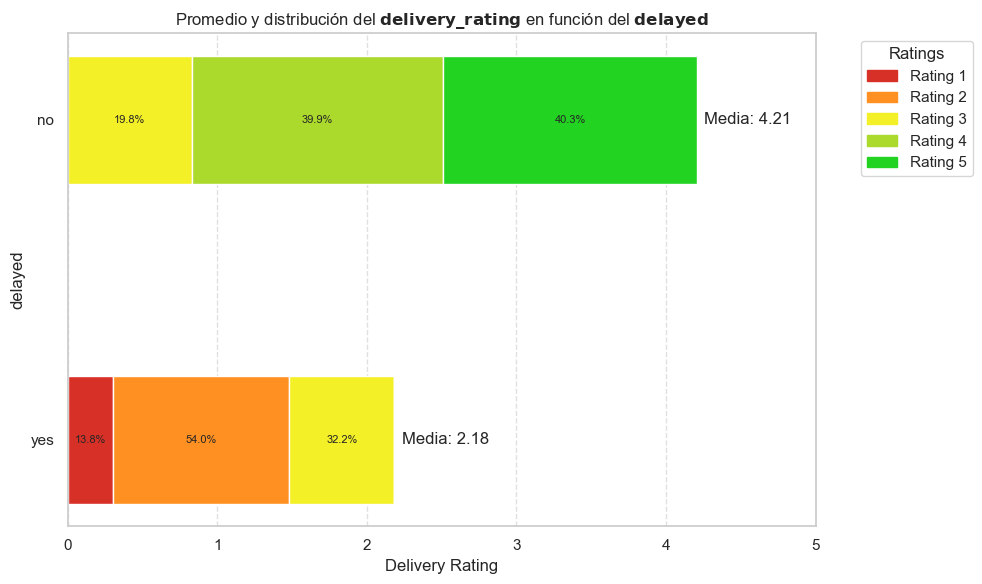

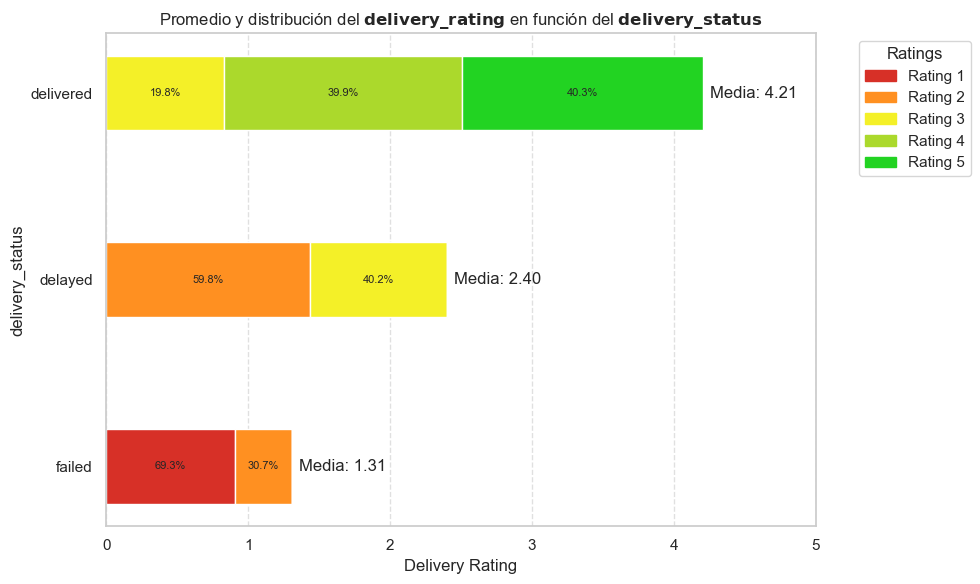

In [13]:
rating_col = "delivery_rating"

# Detectar automáticamente las variables categóricas (excluyendo la de rating)
categorical_vars = df_1.select_dtypes(include=["object", "category"]).columns
categorical_vars = [col for col in categorical_vars if col != rating_col]

# Colores para ratings 1–5
colors = {1: "#d73027", 2: "#ff9021", 3: "#f4f028", 4: "#abd92c", 5: "#22d322"}


for y_var in categorical_vars:
    # Proporciones de cada rating por categoría
    prop_df = (
        df_1.groupby(y_var)[rating_col]
        .value_counts(normalize=True)
        .rename("proportion")
        .reset_index()
    )

    # Media del rating por categoría
    mean_df = df_1.groupby(y_var)[rating_col].mean().reset_index(name="mean_rating")

    # Pivotear para tener columnas por rating
    pivot_df = prop_df.pivot(index=y_var, columns=rating_col, values="proportion").fillna(0)

    order = mean_df.sort_values("mean_rating")[y_var]

    fig, ax = plt.subplots(figsize=(10, 6))

    for i, cat in enumerate(order):
        proportions = pivot_df.loc[cat]
        mean_val = mean_df.loc[mean_df[y_var] == cat, "mean_rating"].values[0]

        left = 0
        for r in sorted(proportions.index):
            width = proportions[r] * mean_val  # proporción escalada a la media
            ax.barh(cat, width, left=left, color=colors[r], height=0.4)
            if proportions[r] > 0.05:
                ax.text(left + width/2, i, f"{proportions[r]:.1%}", va="center", ha="center", fontsize=8)
            left += width

        # Texto de la media al final de la barra
        ax.text(mean_val + 0.05, i, f"Media: {mean_val:.2f}", va="center", ha="left")

    ax.set_xlim(0, 5)
    ax.set_xlabel("Delivery Rating")
    ax.set_ylabel(y_var)
    ax.set_title("Promedio y distribución del "
                 + r"$\mathbf{" + rating_col.replace("_", "\_") + "}$"
                 + " en función del "+ r"$\mathbf{" 
                 + y_var.replace("_", "\_") + "}$"
                 )
    ax.legend([plt.Rectangle((0,0),1,1,color=colors[r]) for r in sorted(colors.keys())],
              [f"Rating {r}" for r in sorted(colors.keys())],
              title="Ratings", bbox_to_anchor=(1.05, 1))
    ax.grid(False)
    ax.grid(axis="x", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()


In [14]:
# Función para calcular Cramer's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k-1, r-1))

# Variable dependiente (ya la nombramos previamente en la visualización)
#rating_col = "delivery_rating"

# Detectar variables categóricas
categorical_vars = df_1.select_dtypes(include=["object", "category"]).columns
categorical_vars = [col for col in categorical_vars if col != rating_col]



def impacto_categóricas(variable_objetivo, variables_categoricas):
    impact_results = []
    for variables_categoricas in categorical_vars:
        # Caso 1: dependiente numérica (para comparar categórica vs numérica)
        if np.issubdtype(df_1[variable_objetivo].dtype, np.number):
            model = smf.ols(f"{variable_objetivo} ~ C({variables_categoricas})", data=df_1).fit()
            aov_table = sm_stats.stats.anova_lm(model, typ=2)
            
            ss_between = aov_table["sum_sq"][0]
            ss_total = ss_between + aov_table["sum_sq"][1]
            eta2 = ss_between / ss_total
            
            impact_results.append((variables_categoricas, "ANOVA", eta2))
        
        # Caso 2: dependiente categórica (para comparar categórica vs categórica)
        else:
            confusion_matrix = pd.crosstab(df_1[variables_categoricas], df_1[variable_objetivo])
            v = cramers_v(confusion_matrix)
            impact_results.append((variables_categoricas, "Chi2", v))

    return impact_results

impact_results = impacto_categóricas(rating_col, categorical_vars)
# Convertir a DataFrame ordenado
impact_df = pd.DataFrame(impact_results, columns=["Variable", "Test", "Impact"]).sort_values("Impact", ascending=False)

print(impact_df)


            Variable   Test    Impact
7    delivery_status  ANOVA  0.642823
6            delayed  ANOVA  0.604266
3      delivery_mode  ANOVA  0.281105
5  weather_condition  ANOVA  0.031630
0   delivery_partner  ANOVA  0.000505
1       package_type  ANOVA  0.000249
4             region  ANOVA  0.000174
2       vehicle_type  ANOVA  0.000087


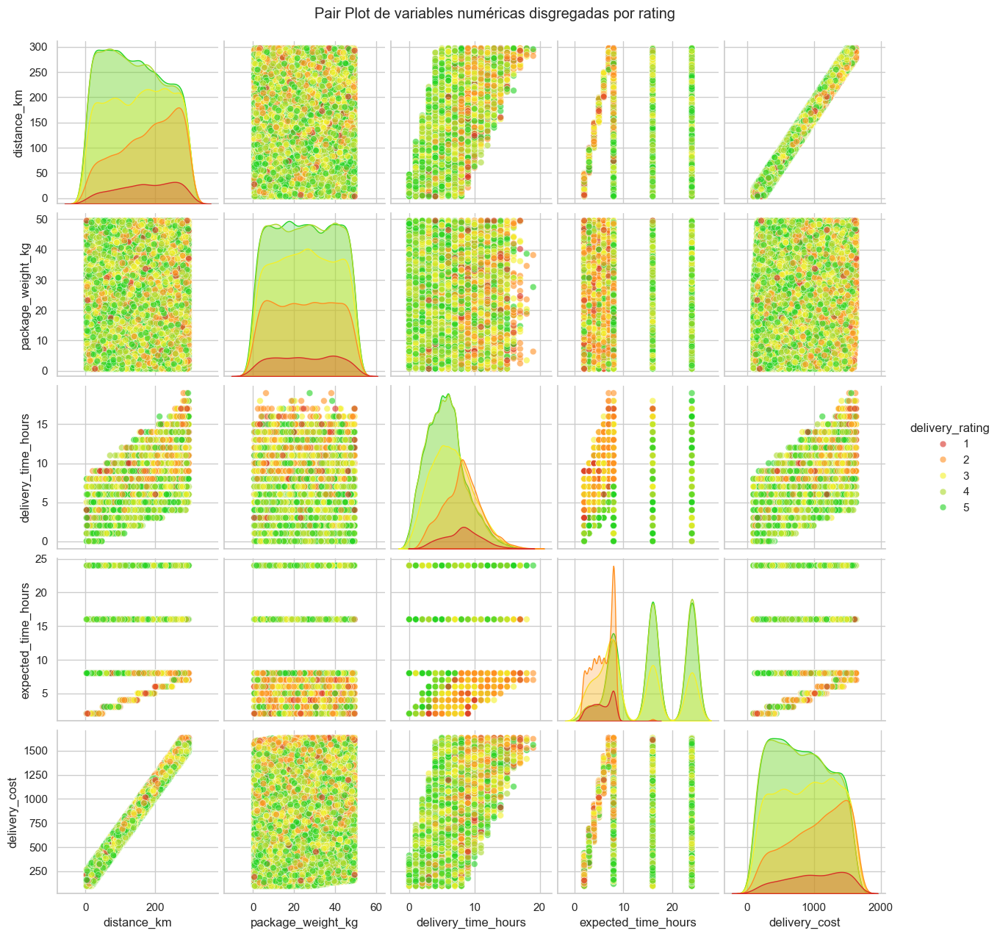

In [15]:
numerical_vars = df_1.select_dtypes(include=["int64", "float64"]).columns
numerical_vars = [col for col in numerical_vars if col != rating_col and col != "delivery_id"]
numerical_vars = numerical_vars + [rating_col]

sns.pairplot(df_1[numerical_vars], 
             diag_kind='kde',   # histograma o kde en la diagonal
             plot_kws={'alpha':0.6, 's':40},
             hue=rating_col,
             palette=colors
             )  # estilo de los puntos

plt.suptitle("Pair Plot de variables numéricas disgregadas por rating", y=1.02)
plt.show()

Las variables que mayor impacto tienen sobre la variable **delivery_rating** son **delivery_status**, **delayed** (identica a *delivery_status* mas no distingue entre entrega demorada o fallida), **expected_time_hours** y **delivery_mode** las cuales tiene un efecto significativo (principalmente las dos primeras mencionadas) seguidas de **delivery_time_hours** y **weather_condition** las cuales tienen un efecto moderado. Podemos inferir lo siguiente:
* Si ignoramos los casos en que el envió no logra realizarse (*failed*), las predicciones erroneas del tiempo estimado influyen en gran medida en el rating con que el usuario calificará el servicio. Los envíos demorados (tiempo de envío estimado menor al tiempo de envío demorado real) tienen un rating promedio 1,8 menor a los envíos que llegan según lo esperado.
* Notando que los envíos entregados sin demoras no son calificados con un rating menor a 3, se puede apreciar que las **weather_condition** tienen un efecto importante sobre la probabilidad de éxito de un envío duplicandose el porcentaje de envíos fallidos así como de demorados cuando las condiciones climáticas son adversas (*foggy*, *rainy* y *stormy*). Recordar que, si bien los porcentajes son en función del rating, se tiene una igual cantidad de envíos para todas las condiciones climáticas así que se puede extrapolar a éxito de envío.
* El tipo de envío también tiene una influencia sobre el rating notandose que los problemas en los envíos están alocados en los **delivery_mode** de *express* y *same_day*. Viendo además la correlación de las variables numéricas pareciera que los modos de envio *two_days* y *standard* tienen los tiempos estimados fijos y excesivos que no suelen demorarse salvo que fallen mientras que *express* y *same_day* tienen las estimaciones discretas menos excesivas pero que resultan menores al tiempo real del envío.
* Viendo las funciones de densidad de **delivery_time_hours** se puede apreciar que, si bien los envío que tardan menos se encuentran mejor calificados en general, los envíos de cualquier tiempo de envío pueden ser calificados con una buena calificación no importa si es un viaje largo como también calificado negativamente si es un viaje corto pero no se predijo bien el tiempo de envío (se demoró).


#### **Delivery_time_hours:**

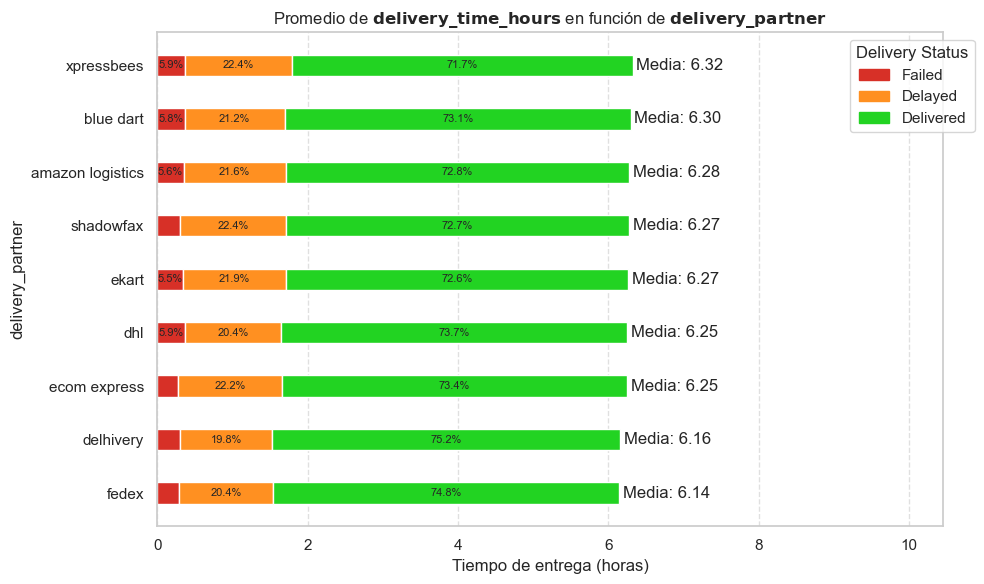

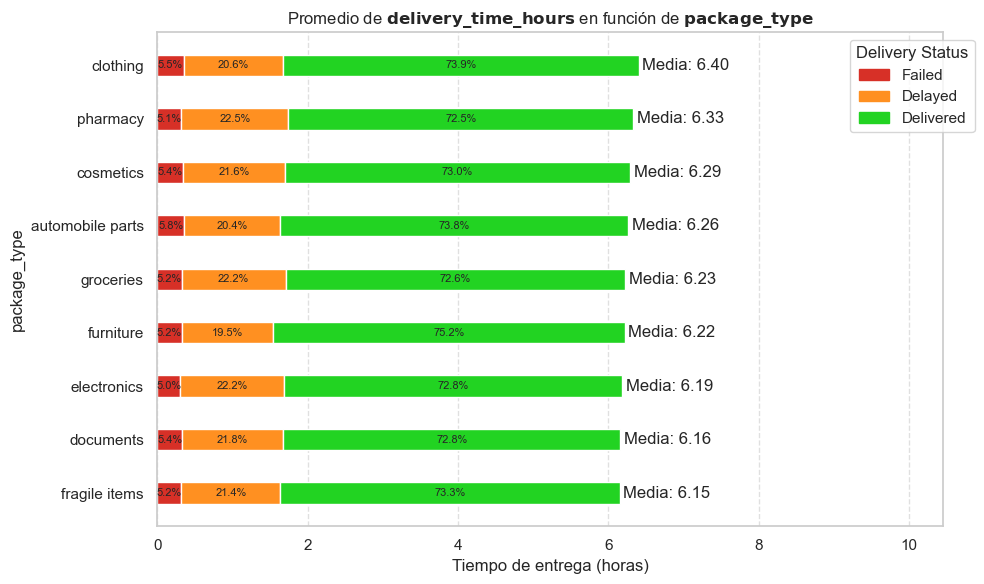

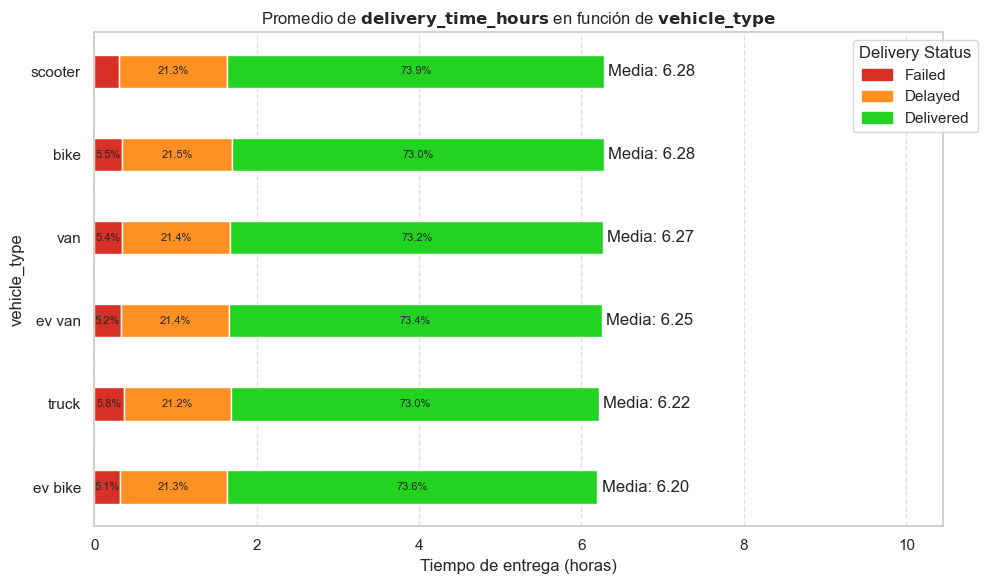

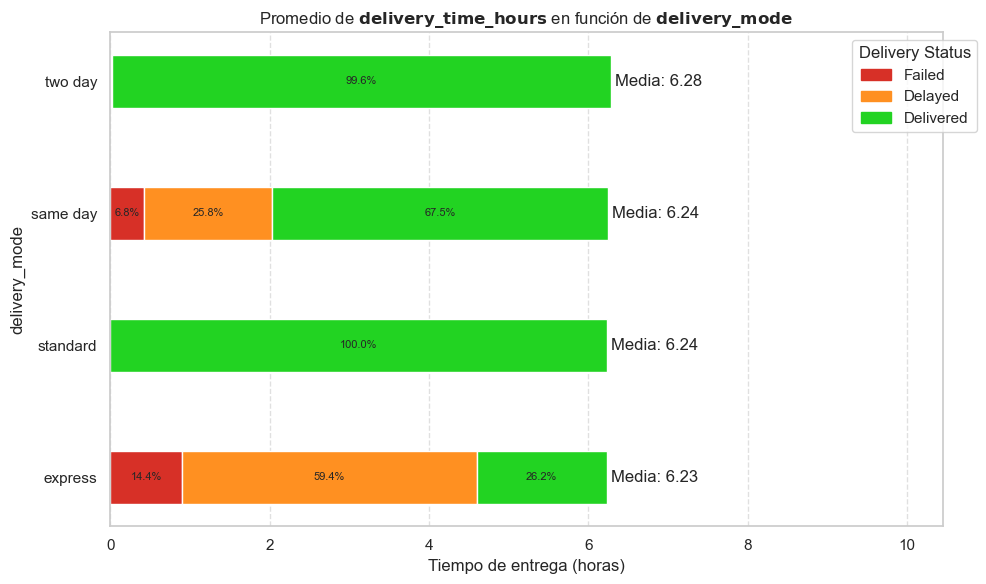

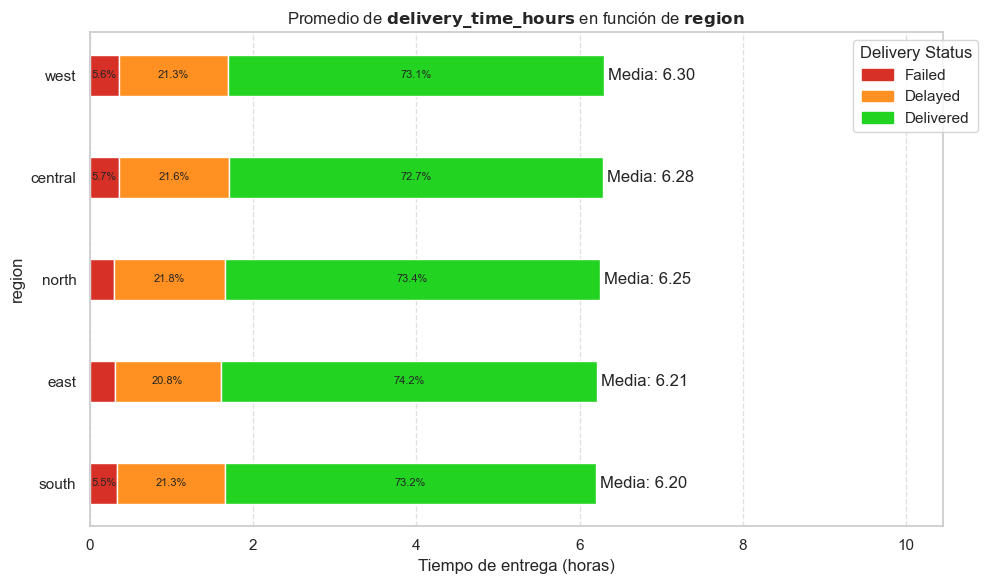

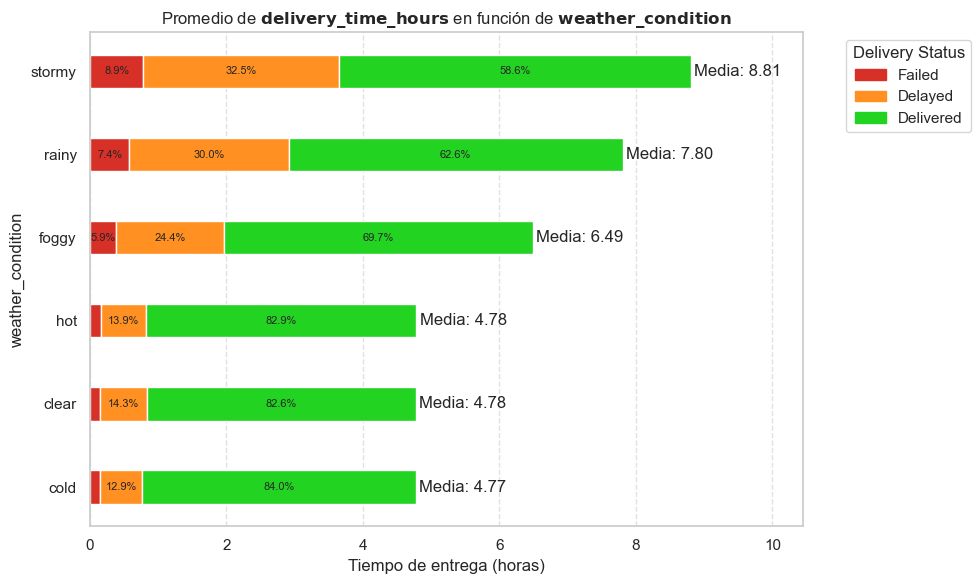

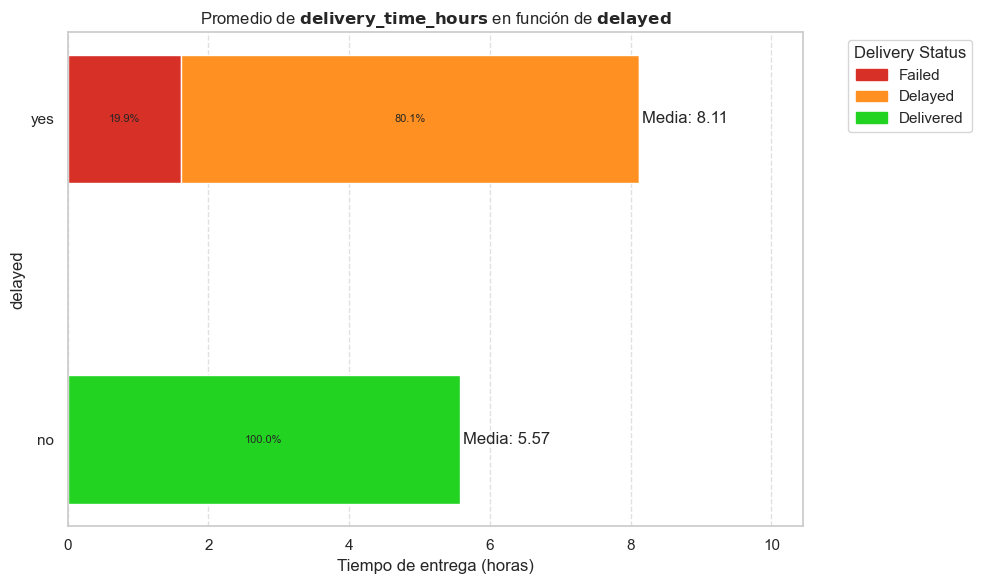

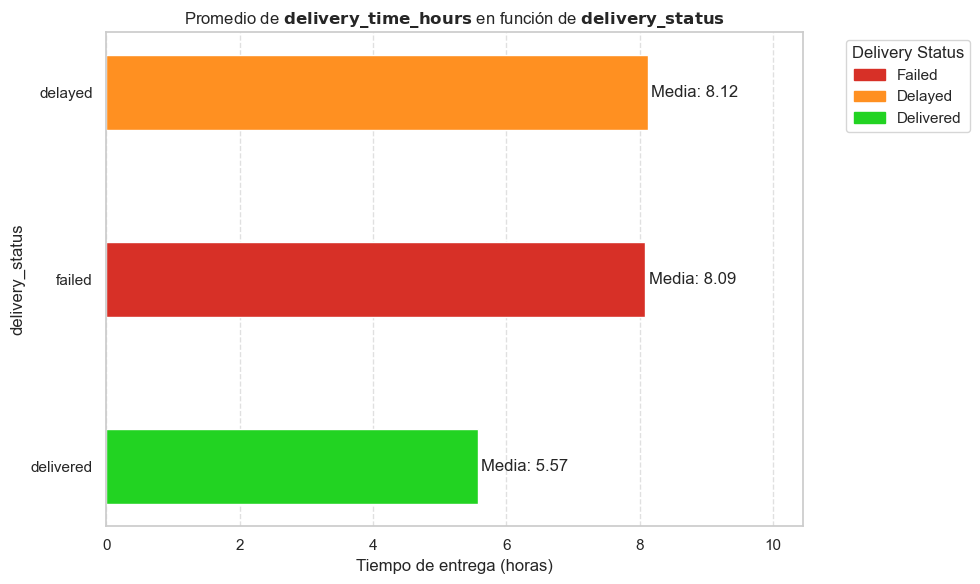

In [16]:
target_col_time = "delivery_time_hours"
status_col = "delivery_status"
status_order = ["failed", "delayed", "delivered"]

# Colores para cada estado
status_colors = {"delivered": "#22d322", "failed": "#d73027", "delayed": "#ff9021"}

categorical_vars = df_1.select_dtypes(include=["object", "category"]).columns
categorical_vars = [col for col in categorical_vars if col != target_col_time]

for y_var in categorical_vars:
    mean_df = df_1.groupby(y_var)[target_col_time].mean().reset_index(name="mean_time")
    order = mean_df.sort_values("mean_time")[y_var]

    # Solo calculamos proporciones si la variable no es delivery_status
    if y_var != status_col:
        prop_df = (
            df_1.groupby(y_var)[status_col]
            .value_counts(normalize=True)
            .rename("proportion")
            .reset_index()
        )
        pivot_df = prop_df.pivot(index=y_var, columns=status_col, values="proportion").fillna(0)

    fig, ax = plt.subplots(figsize=(10, 6))

    for i, cat in enumerate(order):
        mean_val = mean_df.loc[mean_df[y_var] == cat, "mean_time"].values[0]

        if y_var != status_col:
            proportions = pivot_df.loc[cat]
            left = 0
            for status in status_order:
                if status in proportions.index:
                    width = proportions[status] * mean_val
                    ax.barh(cat, width, left=left, color=status_colors[status], height=0.4)
                    if proportions[status] > 0.05:
                        ax.text(left + width/2, i, f"{proportions[status]:.1%}",
                                va="center", ha="center", fontsize=8)
                    left += width
        else:
            # Caso especial: la variable categórica es delivery_status
            ax.barh(cat, mean_val, color=status_colors[cat], height=0.4)

        # Texto de la media al final de la barra
        ax.text(mean_val + 0.05, i, f"Media: {mean_val:.2f}", va="center", ha="left")

    ax.set_xlim(0, df_1[target_col_time].max() * 0.55)
    ax.set_xlabel("Tiempo de entrega (horas)")
    ax.set_ylabel(y_var)
    ax.set_title("Promedio de "
                 + r"$\mathbf{" + target_col_time.replace("_", "\_") + "}$"
                 + " en función de "
                 + r"$\mathbf{" + y_var.replace("_", "\_") + "}$"
                 )
    ax.legend([plt.Rectangle((0,0),1,1,color=status_colors[s]) for s in status_order],
              [s.capitalize() for s in status_order],
              title="Delivery Status", bbox_to_anchor=(1.05, 1))
    ax.grid(False)
    ax.grid(axis="x", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()




In [17]:
impact_results_del_time = impacto_categóricas(target_col_time, categorical_vars)
# Convertir a DataFrame ordenado
impact_df_del_time = pd.DataFrame(impact_results_del_time, columns=["Variable", "Test", "Impact"]).sort_values("Impact", ascending=False)

print(impact_df_del_time)

            Variable   Test    Impact
5  weather_condition  ANOVA  0.262212
7    delivery_status  ANOVA  0.127990
6            delayed  ANOVA  0.127986
1       package_type  ANOVA  0.000634
0   delivery_partner  ANOVA  0.000342
4             region  ANOVA  0.000152
2       vehicle_type  ANOVA  0.000098
3      delivery_mode  ANOVA  0.000034


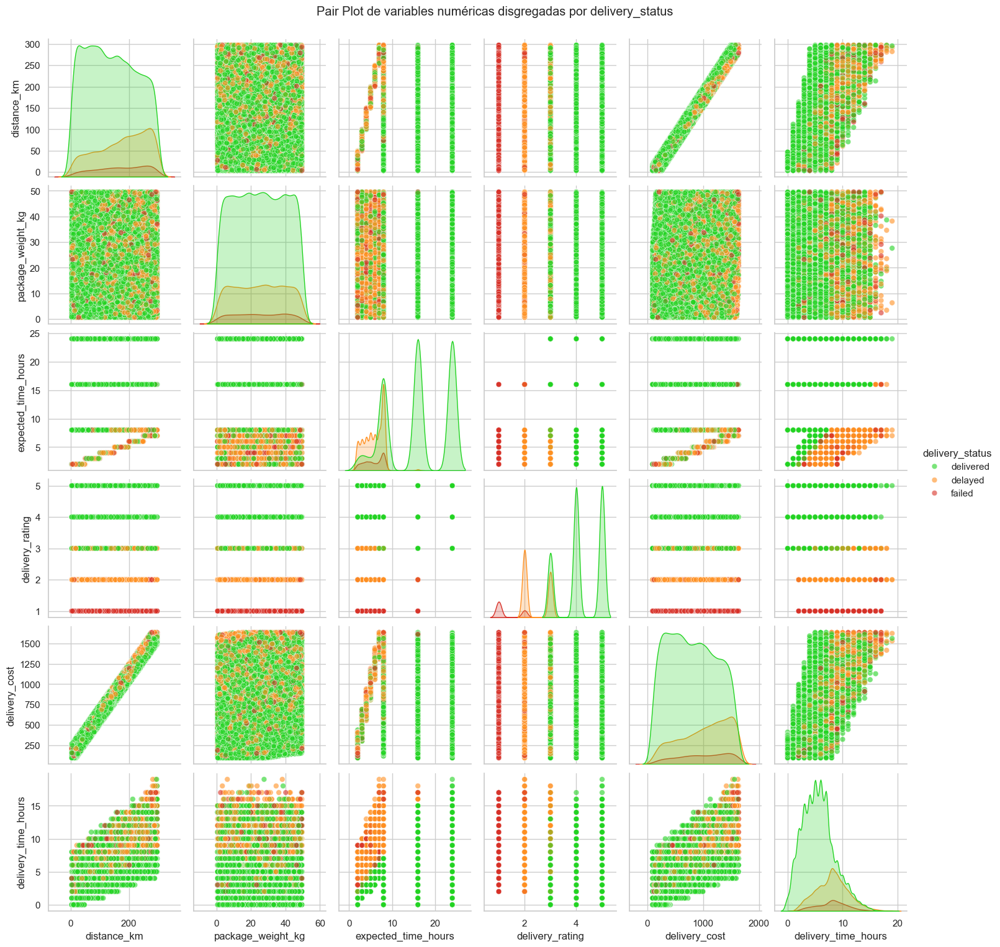

In [18]:
numerical_vars = df_1.select_dtypes(include=["int64", "float64"]).columns
numerical_vars = [col for col in numerical_vars if col != target_col_time and col != "delivery_id"]
numerical_vars = numerical_vars + [target_col_time]

sns.pairplot(df_1[numerical_vars + [status_col]],  # incluimos delivery_status en el DF
            vars=numerical_vars, 
             diag_kind='kde',   # histograma o kde en la diagonal
             plot_kws={'alpha':0.6, 's':40},
             hue=status_col,
             palette=status_colors
             )  # estilo de los puntos

plt.suptitle("Pair Plot de variables numéricas disgregadas por delivery_status", y=1.02)
plt.show()

Las variables que mayor impacto tienen sobre la variable **delivery_time_hours** son **weather_condition** y **distance_km**. Podemos inferir lo siguiente:
* Se confirman los supuestos realizados en el análisis bivariado de **delivery_rating**:
    * El **weather_condition** afecta la eficacia del envió duplicando el ratio de fallidos y demoras de los días adversos respecto de los días normales (estas demoras se traducían en calificación de rating baja). Se puede apreciar en los siguientes gráficos de dispersión pero para los días de condiciones desfavorables el **delivery_time_hours** se desplazan a mayores tiempos acentuandose el efecto en distancias más largas.
    * A medida que aumenta la distancia aumenta la dispersión del **delivery_time_hours** pasando de un rango de 8 horas para distancias cortas (cercanas a 0) y un rango de 13 horas para distancias largas (cercanas a 300km).
    * Los servicios *express* y *same day* de **delivery_mode** son los únicos modos con problemas en el envío (fallidos y demoras). 
* Las demoras (tiempos predichos respecto a tiempo de delivery real) se dan principalmente en los tiempos de envío predichos menores a 8 horas lo cual corresponde a los **delievery_mode** de *same day* y *express*. Las predicciones de tiempo siguen las siguientes reglas (ver gráfico siguiente):
    * Para *express* el tiempo estimado se realiza a partir de la distancia del envio en una relación de 1 hr/50km.
    * Para *same day* son 8 horas para cualquier distancia.
    * Para *standard* son 16 horas para cualquier distancia.
    * Para *two day* son 24 horas para cualquier distancia.
* Salvo el **delivery_mode** de *express*, el resto de los modos de entrega no tienen en consideración la distancia que debe recorrer el repartidor siendo **delivery_time_hours** dependiente de la **distance_km**. Además, como se puede apreciar, no se considera otra variable para estimar el tiempo de envío ignorando entonces el efecto que tiene el **weather_condition** sobre el tiempo de envío dando como consecuencia demoras.

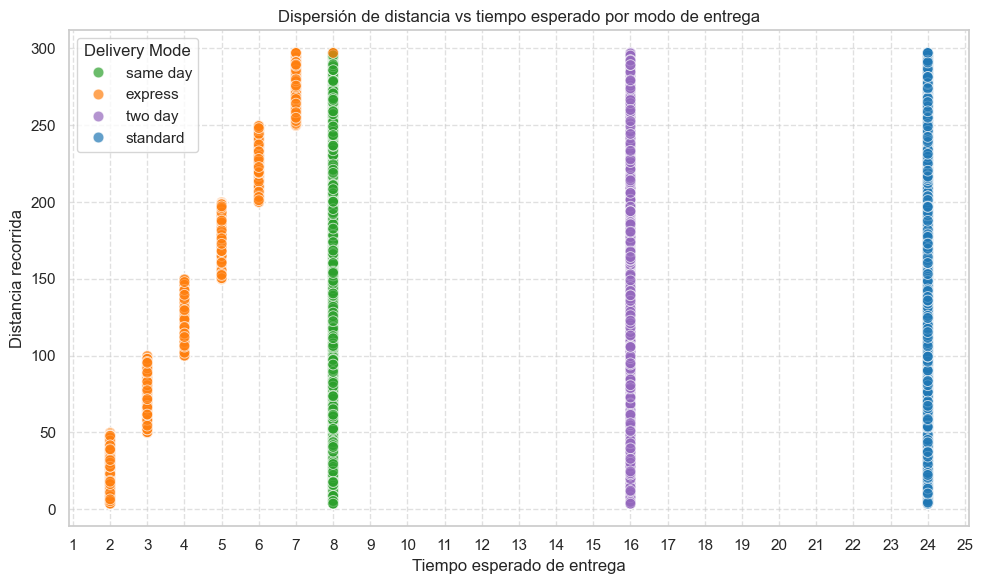

In [19]:
mode_colors = {
    "standard": "#1f77b4",
    "express": "#ff7f0e",
    "same day": "#2ca02c",
    "two day": "#9467bd"
}

plt.figure(figsize=(10, 6))

sns.scatterplot(
    data=df_1,
    y="distance_km",
    x="expected_time_hours",
    hue="delivery_mode",
    palette=mode_colors,
    alpha=0.7,
    s=60
)

plt.gca().xaxis.set_major_locator(MultipleLocator(1))
plt.ylabel("Distancia recorrida")
plt.xlabel("Tiempo esperado de entrega")
plt.title("Dispersión de distancia vs tiempo esperado por modo de entrega")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(title="Delivery Mode")
plt.tight_layout()
plt.show()


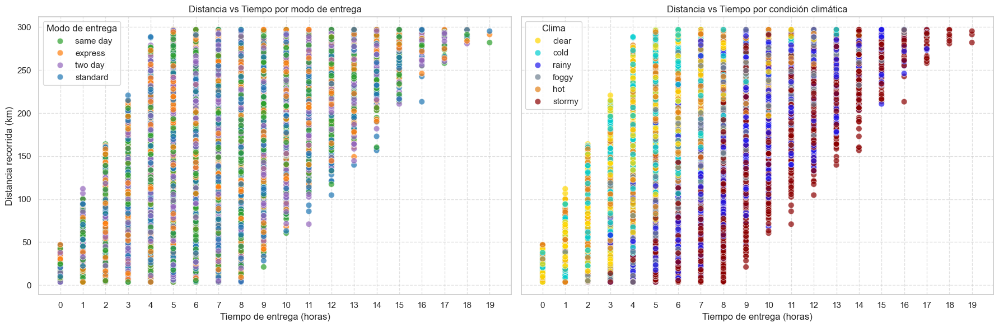

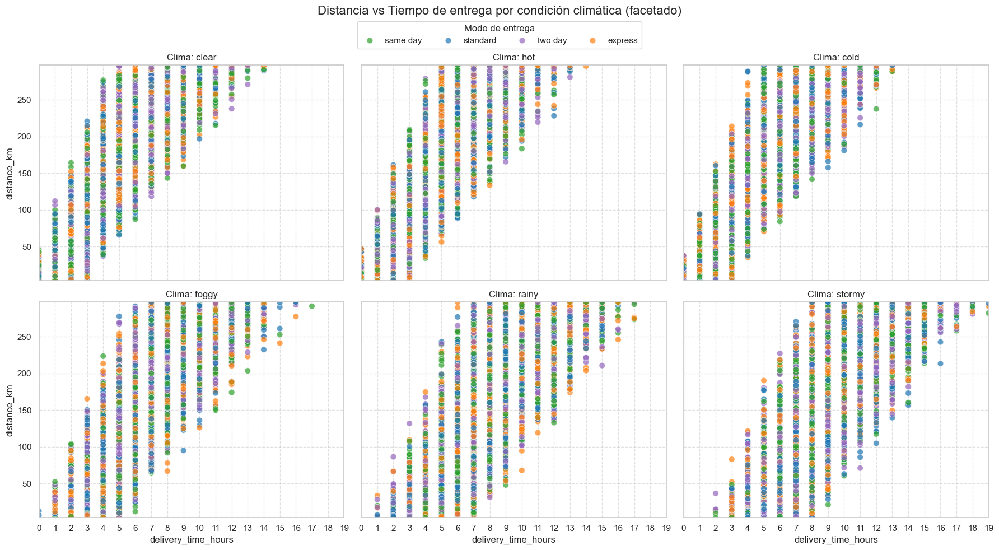

In [20]:
# Paletas de colores
mode_colors = {
    "express": "#ff7f0e",
    "same day": "#2ca02c",
    "standard": "#1f77b4",
    "two day": "#9467bd"
}

weather_colors = {
    "clear": "#FFD700",
    "hot": "#e3821a",
    "cold": "#00CED1",
    "foggy": "#708090",
    "rainy": "#2019ED",
    "stormy": "#8B0000"
}

# --- Dos gráficos lado a lado ---
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True, sharex=True)

# Gráfico 1: hue por modo de entrega
sns.scatterplot(
    data=df_1,
    x="delivery_time_hours",
    y="distance_km",
    hue="delivery_mode",
    palette=mode_colors,
    alpha=0.7,
    s=60,
    ax=axes[0]
)
axes[0].set_title("Distancia vs Tiempo por modo de entrega")
axes[0].set_xlabel("Tiempo de entrega (horas)")
axes[0].set_ylabel("Distancia recorrida (km)")
axes[0].xaxis.set_major_locator(MultipleLocator(1))
axes[0].grid(True, linestyle="--", alpha=0.6)
axes[0].legend(title="Modo de entrega")

# Gráfico 2: hue por condición climática
sns.scatterplot(
    data=df_1,
    x="delivery_time_hours",
    y="distance_km",
    hue="weather_condition",
    palette=weather_colors,
    alpha=0.7,
    s=60,
    ax=axes[1]
)
axes[1].set_title("Distancia vs Tiempo por condición climática")
axes[1].set_xlabel("Tiempo de entrega (horas)")
axes[1].set_ylabel("Distancia recorrida (km)")
axes[1].xaxis.set_major_locator(MultipleLocator(1))
axes[1].grid(True, linestyle="--", alpha=0.6)
axes[1].legend(title="Clima")

plt.tight_layout()
plt.show()

# --- Gráfico facetado 2x3 por clima ---
weather_conditions = ["clear", "hot","cold","foggy","rainy","stormy"]

fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)

# Límites comunes
x_min, x_max = df_1["delivery_time_hours"].min(), df_1["delivery_time_hours"].max()
y_min, y_max = df_1["distance_km"].min(), df_1["distance_km"].max()

axes = axes.flatten()
for i, condition in enumerate(weather_conditions):
    ax = axes[i]
    subset = df_1[df_1["weather_condition"] == condition]
    sns.scatterplot(
        data=subset,
        x="delivery_time_hours",
        y="distance_km",
        hue="delivery_mode",
        palette=mode_colors,
        alpha=0.7,
        s=60,
        ax=ax
    )
    ax.set_title(f"Clima: {condition}")
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.xaxis.set_major_locator(MultipleLocator(1))
    ax.grid(True, linestyle="--", alpha=0.6)
    ax.legend_.remove()

# Leyenda común
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Modo de entrega", loc="upper center", bbox_to_anchor=(0.5, 0.96), ncol=4)

fig.suptitle("Distancia vs Tiempo de entrega por condición climática (facetado)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()



#### **Delivery_cost:**

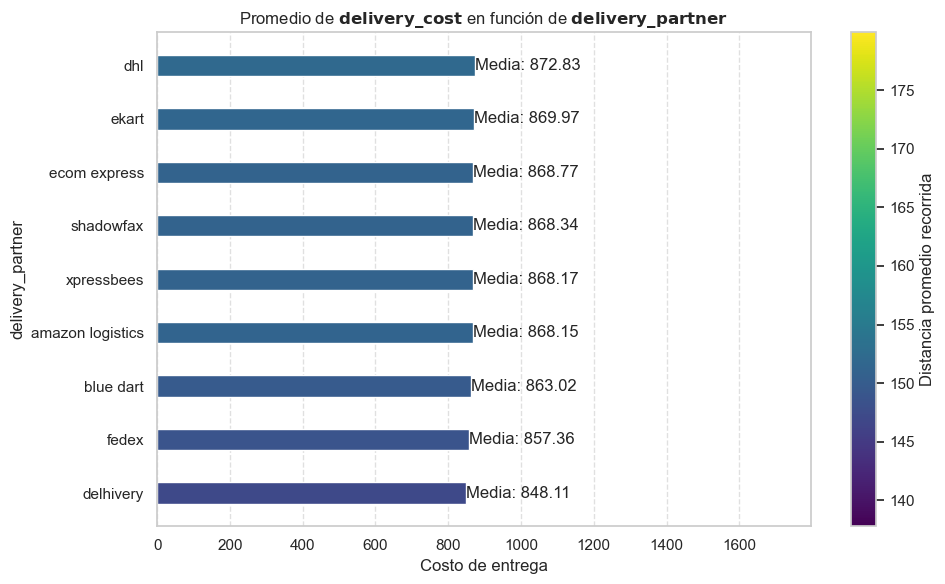

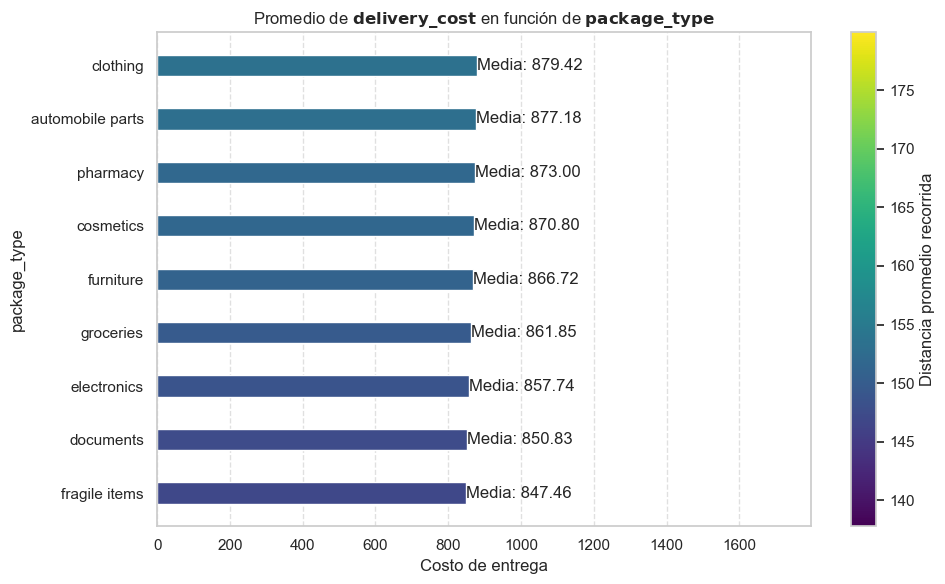

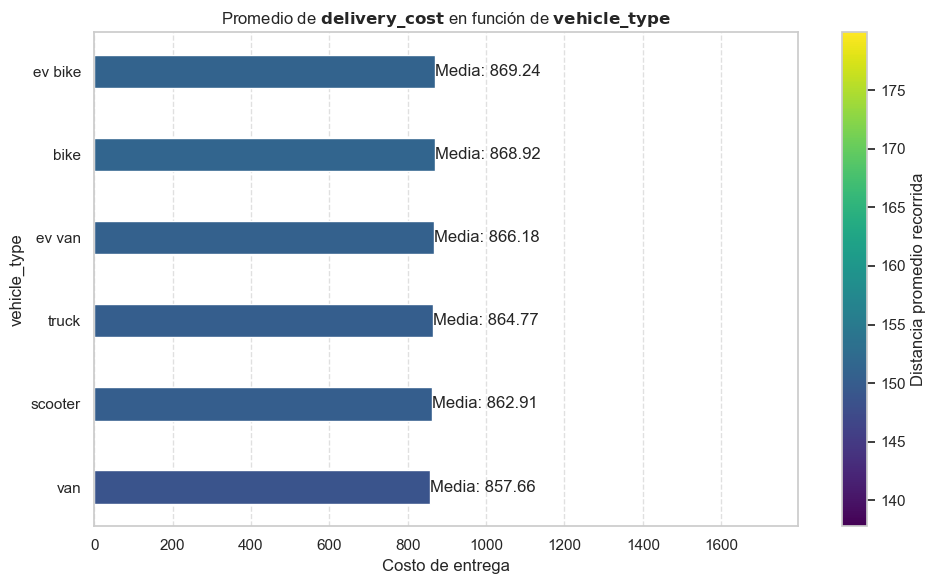

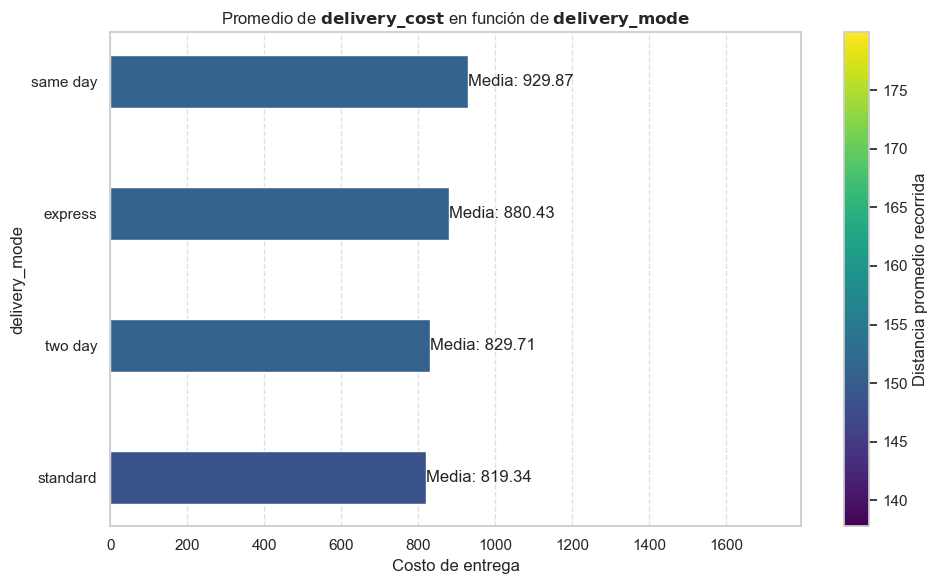

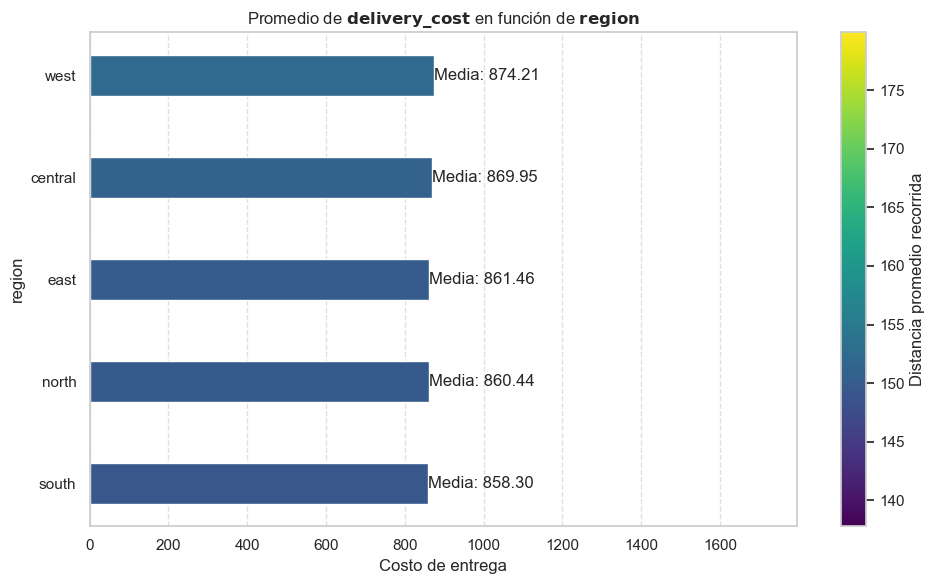

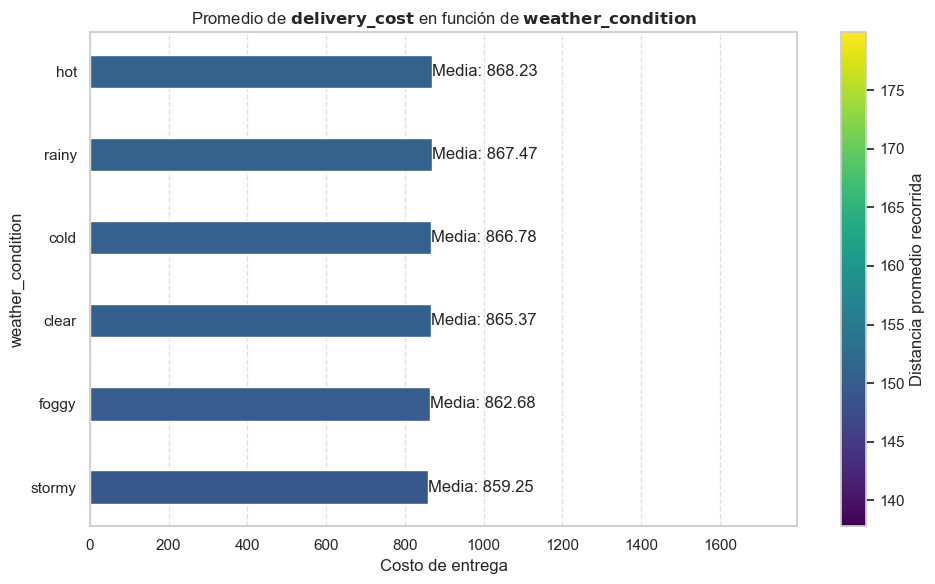

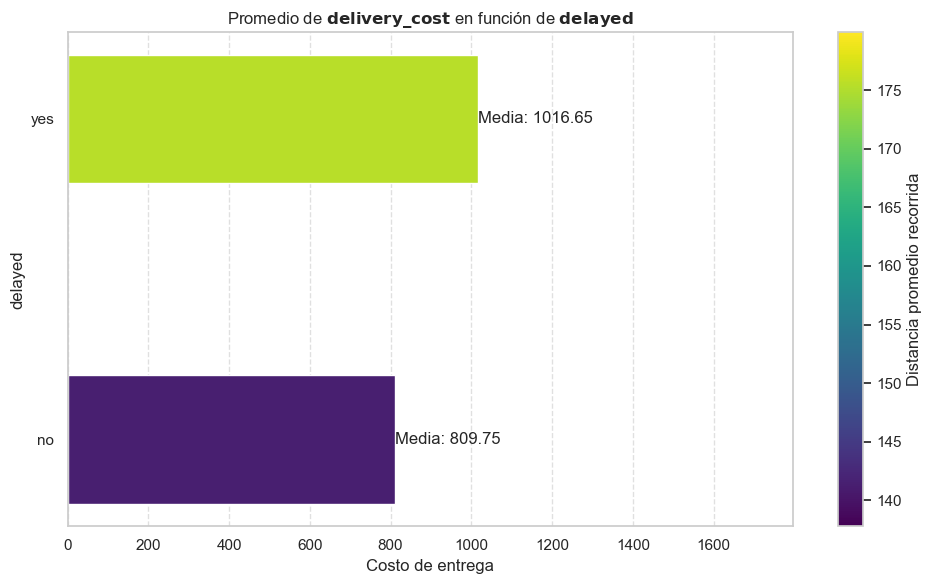

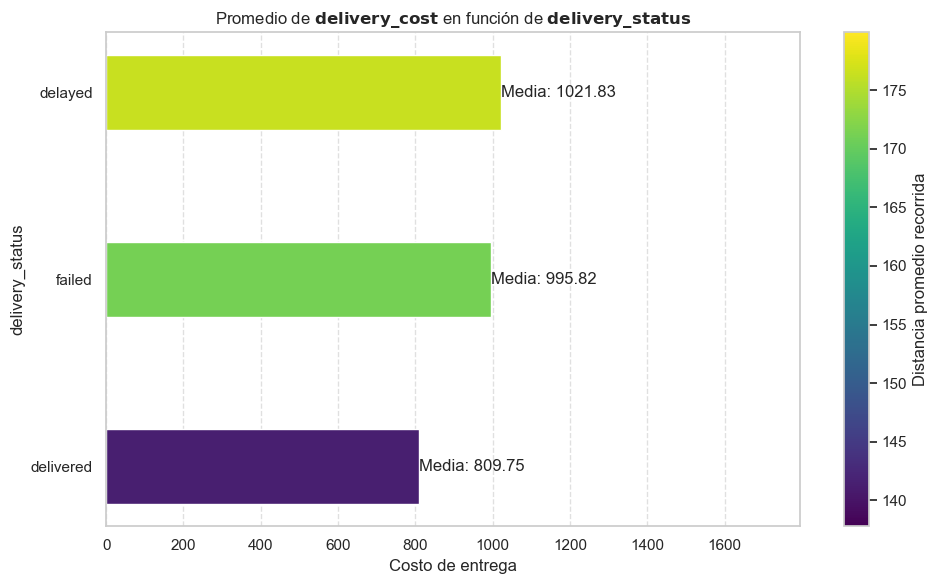

In [21]:
target_col_cost = "delivery_cost"
partition_col = "delivery_mode"
distance_col = "distance_km"  # columna con la distancia recorrida

categorical_vars = df_1.select_dtypes(include=["object", "category"]).columns
categorical_vars = [col for col in categorical_vars if col != target_col_cost]

# Definimos un colormap (puedes probar 'viridis', 'plasma', 'coolwarm', etc.)
cmap = cm.viridis

# Cálculo de medias de distancia para todas las variables categóricas 
all_means = []
for y_var in categorical_vars:
    mean_df = df_1.groupby(y_var).agg(
        mean_cost=(target_col_cost, "mean"),
        mean_distance=(distance_col, "mean")
    ).reset_index()
    all_means.extend(mean_df["mean_distance"].values)

# Obteneción de min y max globales de esas medias
global_min = min(all_means)
global_max = max(all_means)

# -Desterminación de rangos ±10% 
margin = 0.1 * (global_max - global_min)
norm = mcolors.Normalize(vmin=global_min - margin, vmax=global_max + margin)

# grafico con escala fija
for y_var in categorical_vars:
    mean_df = df_1.groupby(y_var).agg(
        mean_cost=(target_col_cost, "mean"),
        mean_distance=(distance_col, "mean")
    ).reset_index()

    order = mean_df.sort_values("mean_cost")[y_var]

    fig, ax = plt.subplots(figsize=(10, 6))

    for i, cat in enumerate(order):
        mean_val = mean_df.loc[mean_df[y_var] == cat, "mean_cost"].values[0]
        mean_dist = mean_df.loc[mean_df[y_var] == cat, "mean_distance"].values[0]

        color = cmap(norm(mean_dist))  # usa la escala global expandida

        ax.barh(cat, mean_val, color=color, height=0.4)
        ax.text(mean_val + 0.05, i, f"Media: {mean_val:.2f}", va="center", ha="left")

    ax.set_xlim(0, df_1[target_col_cost].max() * 1.1)
    ax.set_xlabel("Costo de entrega")
    ax.set_ylabel(y_var)
    ax.set_title("Promedio de "
                 + r"$\mathbf{" + target_col_cost.replace("_", "\_") + "}$"
                 + " en función de "
                 + r"$\mathbf{" + y_var.replace("_", "\_") + "}$")

    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label("Distancia promedio recorrida")

    ax.grid(False)
    ax.grid(axis="x", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()


In [22]:
impact_results_del_cost = impacto_categóricas(target_col_cost, categorical_vars)
# Convertir a DataFrame ordenado
impact_df_del_cost = pd.DataFrame(impact_results_del_cost, columns=["Variable", "Test", "Impact"]).sort_values("Impact", ascending=False)

print(impact_df_del_cost)

            Variable   Test    Impact
7    delivery_status  ANOVA  0.044257
6            delayed  ANOVA  0.044105
3      delivery_mode  ANOVA  0.010252
1       package_type  ANOVA  0.000608
0   delivery_partner  ANOVA  0.000281
4             region  ANOVA  0.000199
2       vehicle_type  ANOVA  0.000082
5  weather_condition  ANOVA  0.000051


La variable que mayor impacto tienen sobre la variable **delivery_cost** es **distance_km**. Esto se aprecia en los Pair Plots en los cuales se ve la dependencia lineal del **delivery_cost** con la **distance_km** y también del **delivery_time_hours** (este último igual es función de la **distance_km** de manera prácticamente lineal). Puntos a destacar de lo visto en los gráficos:
* Ninguna variable parece afectar al precio tanto como la distancia. A distancias similares mismo costo.
* Las entregas fallidas o demoradas tiene un coste medio mayor a las entregadas en tiempo y forma pero esto se debe a que suelen corresponder a recorridos más extensos. No solo falla o llega demorado el servicio sino que tiene un costo elevado que se lo traslada al consumidor influyendo aun más en su disconformidad y baja calificación.

#### **Delivery_status[failed]:**

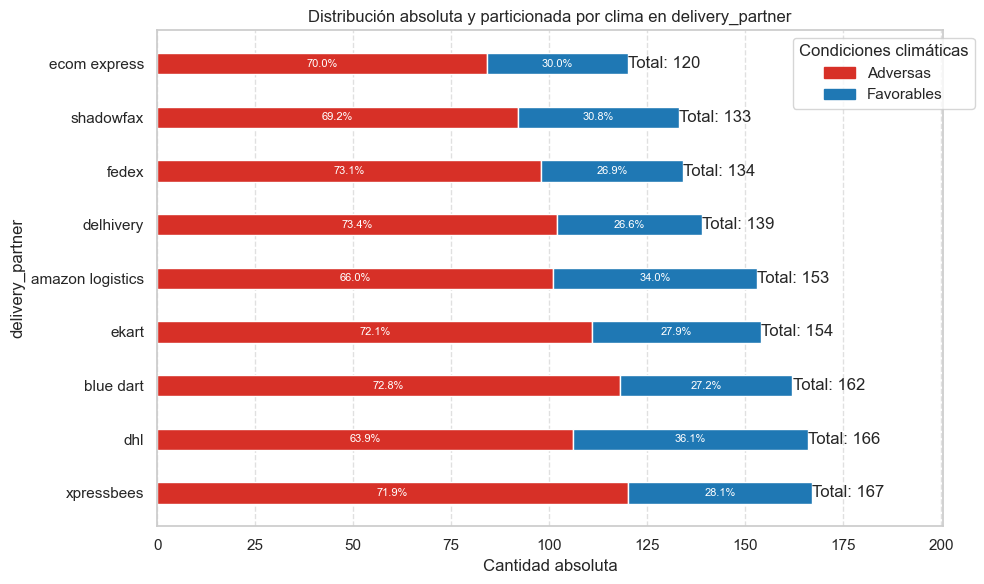

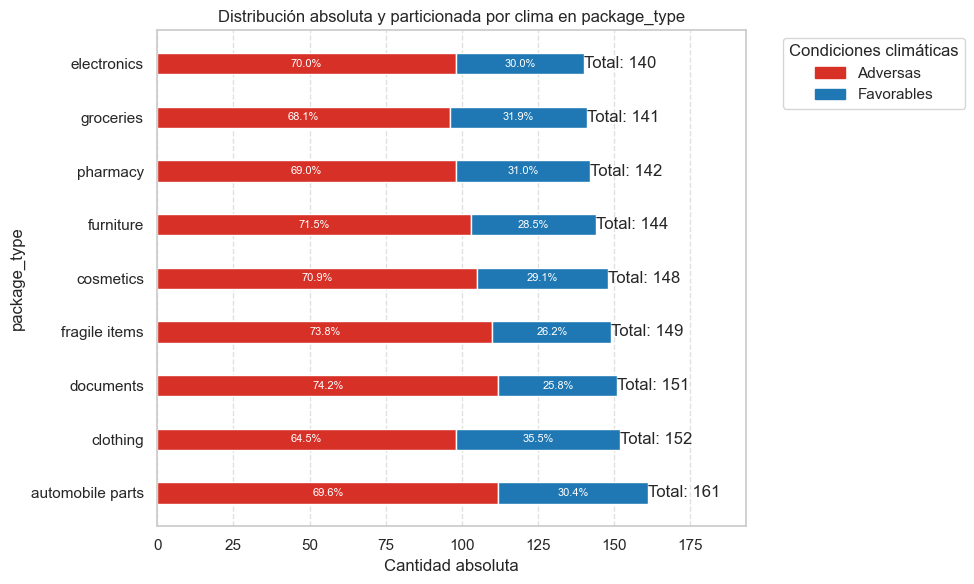

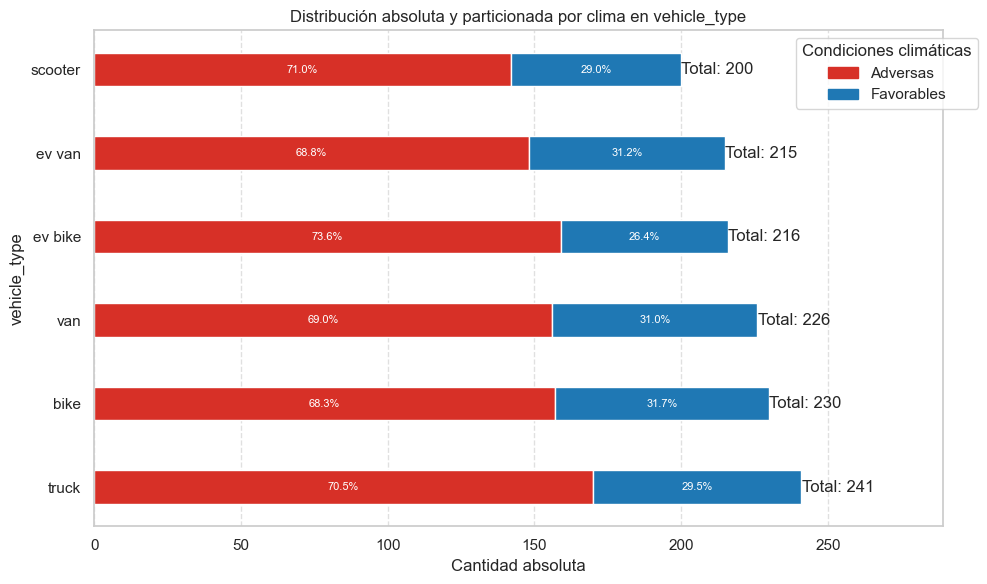

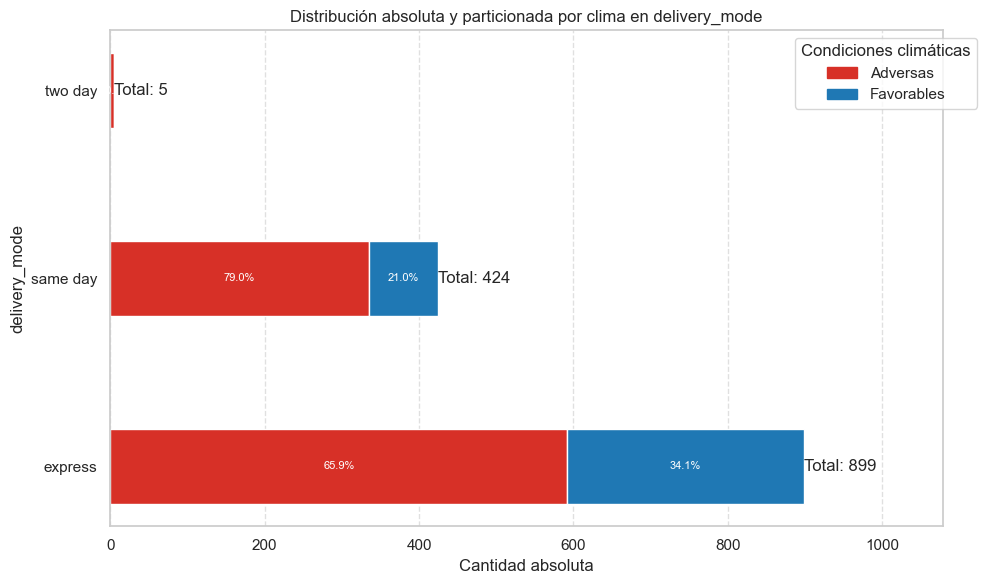

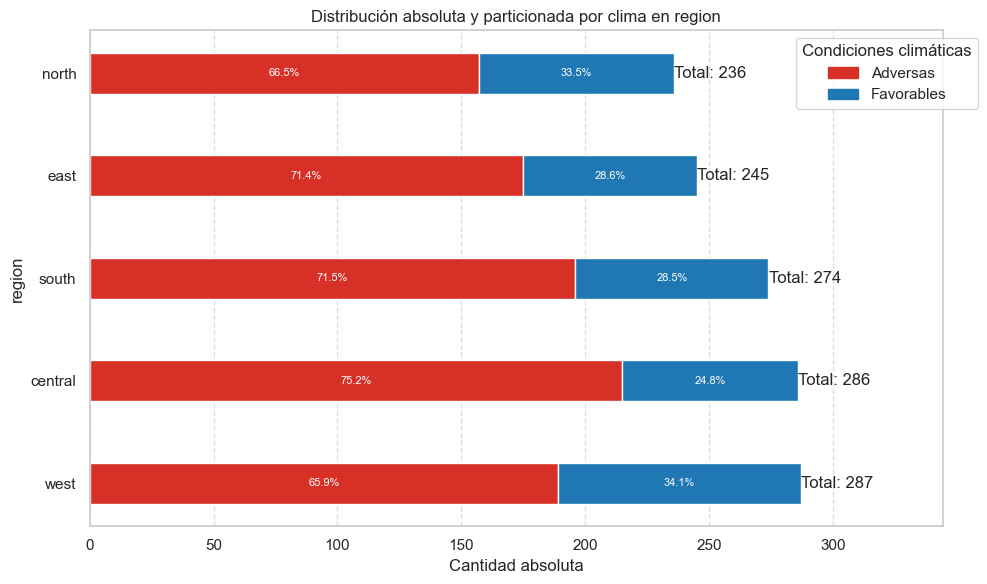

...

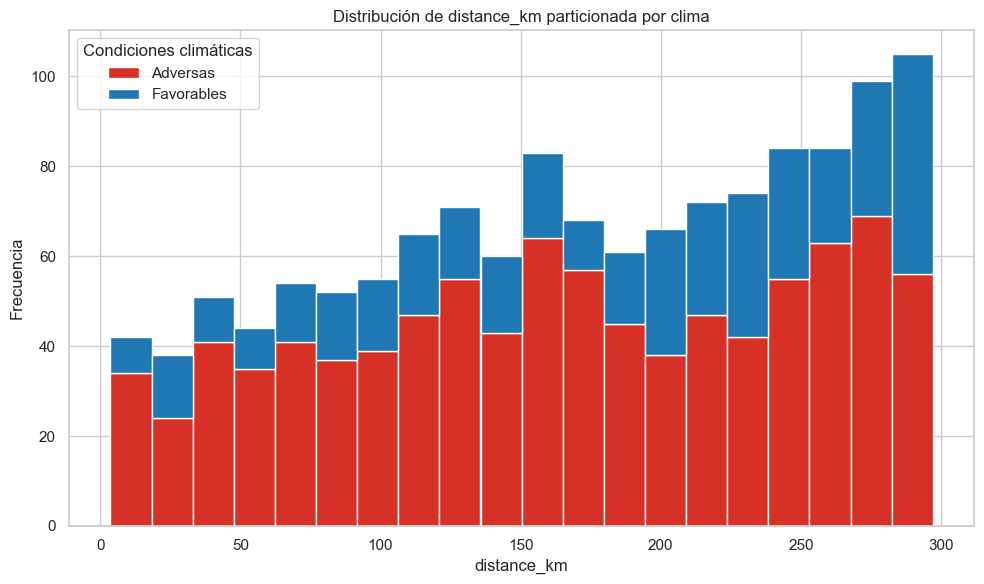

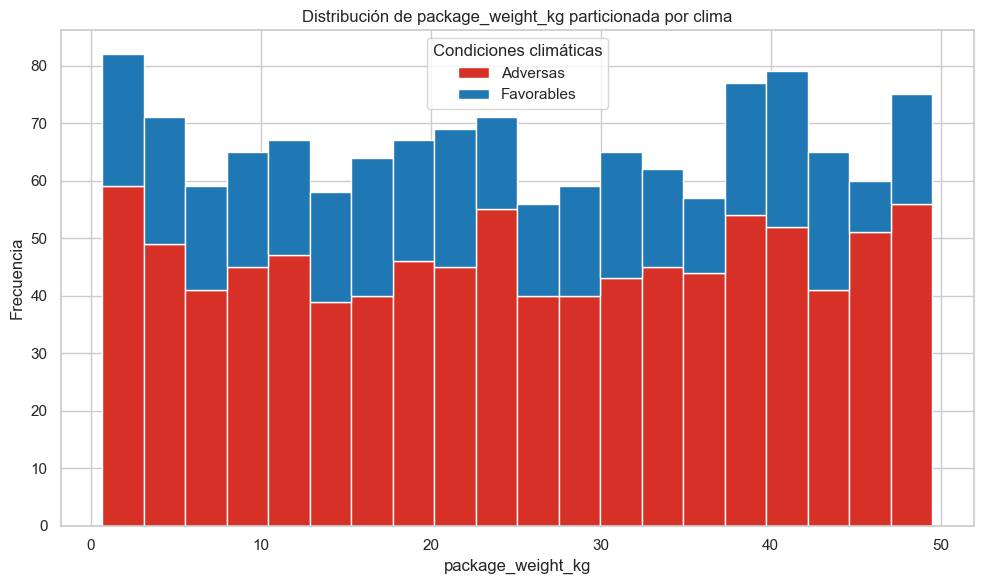

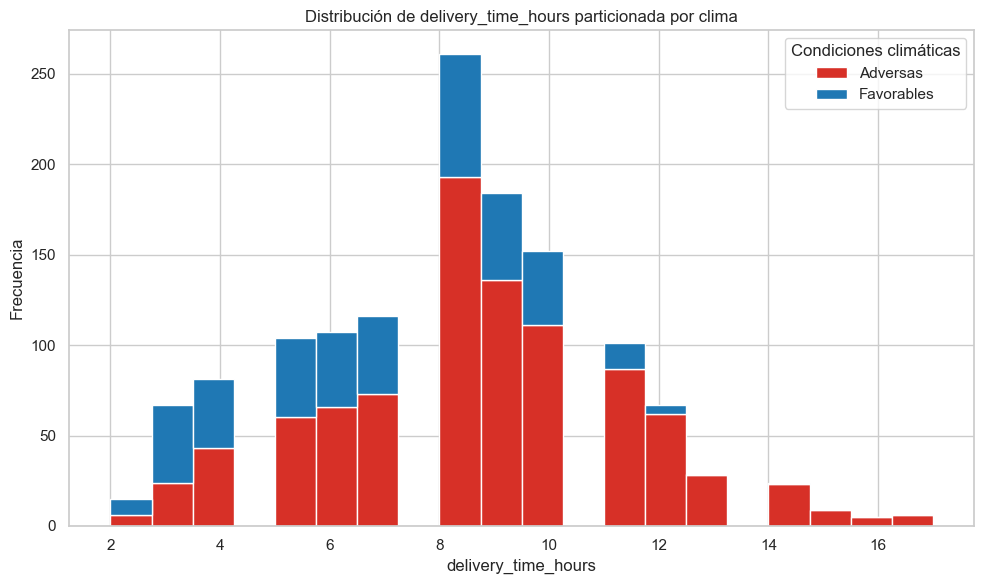

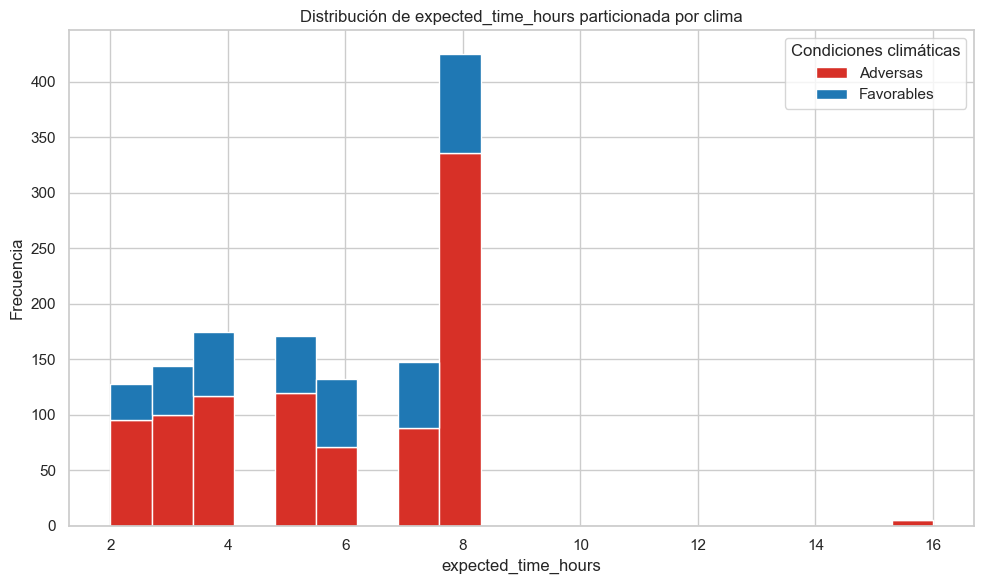

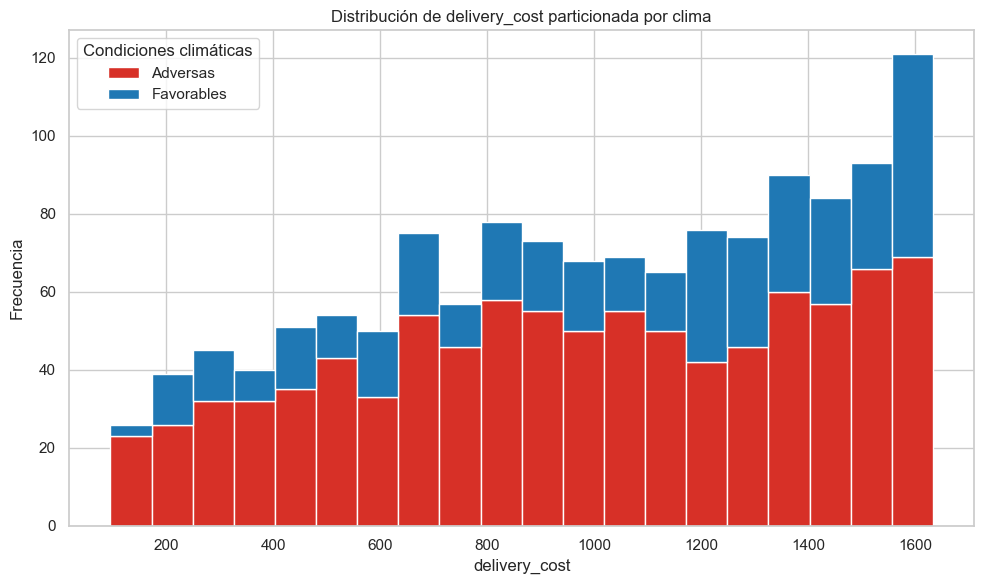

In [23]:
# Filtrar fallas
failed = df_1[df_1['delivery_status'] == 'failed']
failed = failed.drop(columns=['delivery_id','delayed','delivery_rating','delivery_status'])

# Definir grupos de clima
adversas = ['stormy', 'rainy', 'foggy']
favorables = ['hot', 'cold', 'clear']

# Crear columna agrupada
failed['weather_group'] = failed['weather_condition'].apply(
    lambda x: 'Adversas' if x in adversas else ('Favorables' if x in favorables else 'Otros')
)


# Colores para clima
weather_colors = {"Adversas": "#d73027", "Favorables": "#1f78b4"}

# --- Gráficos categóricos (tu código ya funciona) ---
categorical_vars = failed.select_dtypes(include=["object", "category"]).columns
categorical_vars = [col for col in categorical_vars if col != target_col_time]

for y_var in categorical_vars:
    # Conteo absoluto por categoría
    count_df = failed[y_var].value_counts().reset_index()
    count_df.columns = [y_var, "count"]

    # Proporciones de clima dentro de cada categoría (usando pivot_table)
    prop_df = (
        failed.groupby(y_var)['weather_group']
        .value_counts(normalize=True)
        .rename("proportion")
        .reset_index()
    )

    # pivot_table evita el error de nombres duplicados
    pivot_df = prop_df.pivot_table(
        index=y_var,
        columns='weather_group',
        values='proportion',
        fill_value=0,
        aggfunc='first'
    )

    fig, ax = plt.subplots(figsize=(10, 6))
    for i, cat in enumerate(count_df[y_var]):
        total = count_df.loc[count_df[y_var] == cat, "count"].values[0]
        proportions = pivot_df.loc[cat]
        left = 0
        for group in ['Adversas','Favorables','Otros']:
            if group in proportions.index:
                width = proportions[group] * total
                ax.barh(cat, width, left=left, color=weather_colors.get(group, "#999999"), height=0.4)
                if proportions[group] > 0.05:
                    ax.text(left + width/2, i, f"{proportions[group]:.1%}",
                            va="center", ha="center", fontsize=8, color="white")
                left += width
        ax.text(total + 0.05, i, f"Total: {total}", va="center", ha="left")

    ax.set_xlim(0, count_df["count"].max() * 1.2)
    ax.set_xlabel("Cantidad absoluta")
    ax.set_ylabel(y_var)
    ax.set_title(f"Distribución absoluta y particionada por clima en {y_var}")
    ax.legend([plt.Rectangle((0,0),1,1,color=weather_colors[g]) for g in weather_colors],
              weather_colors.keys(), title="Condiciones climáticas", bbox_to_anchor=(1.05, 1))
    ax.grid(False)
    ax.grid(axis="x", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()


    
# --- Gráficos numéricos particionados por clima ---
numeric_vars = failed.select_dtypes(include="number").columns

for col in numeric_vars:
    fig, ax = plt.subplots(figsize=(10, 6))
    # Histograma apilado por clima
    groups = [failed[failed['weather_group'] == g][col] for g in weather_colors.keys()]
    ax.hist(groups, bins=20, stacked=True,
            color=[weather_colors[g] for g in weather_colors],
            label=weather_colors.keys())
    ax.set_title(f"Distribución de {col} particionada por clima")
    ax.set_xlabel(col)
    ax.set_ylabel("Frecuencia")
    ax.legend(title="Condiciones climáticas")
    plt.tight_layout()
    plt.show()



De los gráficos se puede concluir que:
* Los envíos fallidos ocurren principalmente en los días de condiciones adversas (2,35 veces más frecuentes que en los dias favorables). Dicho esto, las probabilidades de fallar en un día favorable o adverso son de 1,6 y 3,7% respectivamente.
* Dado la prevalesencia de las envíos fallidos en días desfavorables se suponía en principio que los vehículos descubiertos (scooters, motocicletas, entre otros) fueran los que más envíos fallidos presentaran pero no fue completamente cierto. De hecho, los scooters fueron los que menos problemas presentaron mientras que los camiones fueron los que más.
* A medida que se extiende el recorrido del delivery mayor es la probabilidad de falla pasando de un 1,9% de las fallas totales del dataset en los recorridos más cortos a un 9,0% en los recorridos más largos. A medida que se extiende el recorrido disminuye el porcentaje de fallas ocurridas en días desfavorables.
* La distribución de los envíos fallidos resultó levemente variada según la región de estados unidos.
* Casi el totalidad de los envíos fallidos ocurren cuando se contrata el servicio de entrega en el mismo día o express (también en el mismo día pero "más rápido").
* Los datos de **delivery_time_hours** pareciera corresponder al momento transcurrido desde que se inició el recorrido hasta que el repartido reportó la falla lo cual deforma nuestra variable en caso de incluir los envíos fallidos.

### **II.3.4 Resumen**

El analisis nos entregó las siguientes conclusiones:
* El **delivery_rating** tiene una fuerte correlación con las variables **delivery_status** y **delayed**. Ambas variables son idénticas con la distinción de que la variable **delayed** agrupa los envío que se demoraron junto con los envíos fallidos. 
* Los envíos demorados son el resultado de un **delivery_time_hours** mayor que el **expected_time_hours** por lo que lograr que dicha diferencia sea nula o a favor del **expected_time_hours** reducirá o eliminará la cantidad de envíos demorados. Los envíos fallidos tambíen cumplen con la calificación de demorados con el agregado de que estos no llegan a destino y el **delivery_time_hours** es un supuesto. 
* Las variables que mayor impacto tienen sobre la variable **delivery_time_hours** son **weather_condition** y **distance_km**. Entrenando el modelo a partir de estas dos variables podremos obtener una mejor predicción que la actual. El modelo actual solo considera **delivery_mode** y **distance_km** asignando unos valores de **expected_time_hours** arbitrarios para todos **delivery_mode** salvo el modo de servicio *express* en el cual se modela a partir de la siguiente ecuación de una recta: **expected_time_hours** = 1/50 [hr/km] * **distance_km**.
* La variable que mayor impacto tienen sobre la variable **delivery_cost** es **distance_km**. A partir de este dataset solo podemos limitarnos emitir la recomendación de mejorar de las rutas de los trayectos de delivery de ser posible. Mejorado el sistema de predicción de **expected_time_hours** se logrará evitar el solapamiento de disconformidad por envío de coste caro (distancias largas) y envío demorado.
* Los casos de envío fallido no se incluirán en el dataset de entrenamiento por considerar que solo introduce ruido en **delivery_time_hours**. Se apreció ciertas tendecias en **Delivery_status[failed]** viendose influenciado principalmente por las  variables **weather_condition**, **delivery_mode** y **distance_km** principalmente.

# **III. Preparación de Datos**

Realizamos el preprocesamiento restante de los datos para el entrenamiento de los modelos. En la sección anterior realizamos la búsqueda y tratamiento de elementos duplicados y valores nulos así como también la transformación del formato de las variables que denotaban tiempo. En esta sección, a partir de lo analizado, realizaremos las siguientes acciones:
* Seleccionaremos las variables a utilizar en nuestro entrenamiento de modelo.
* Codificaremos de las variables categóricas.
* Estandarizaremos las variables numéricas.

### **III.0 Verificación de Correlación con Todos los Datos**

Antes de realizar el tratamiento de las variables del data set para los modelos, realizamos una trasformación rápido para utilizar la matriz de correlación rápida y realizar una última comprobación de lo analisado.

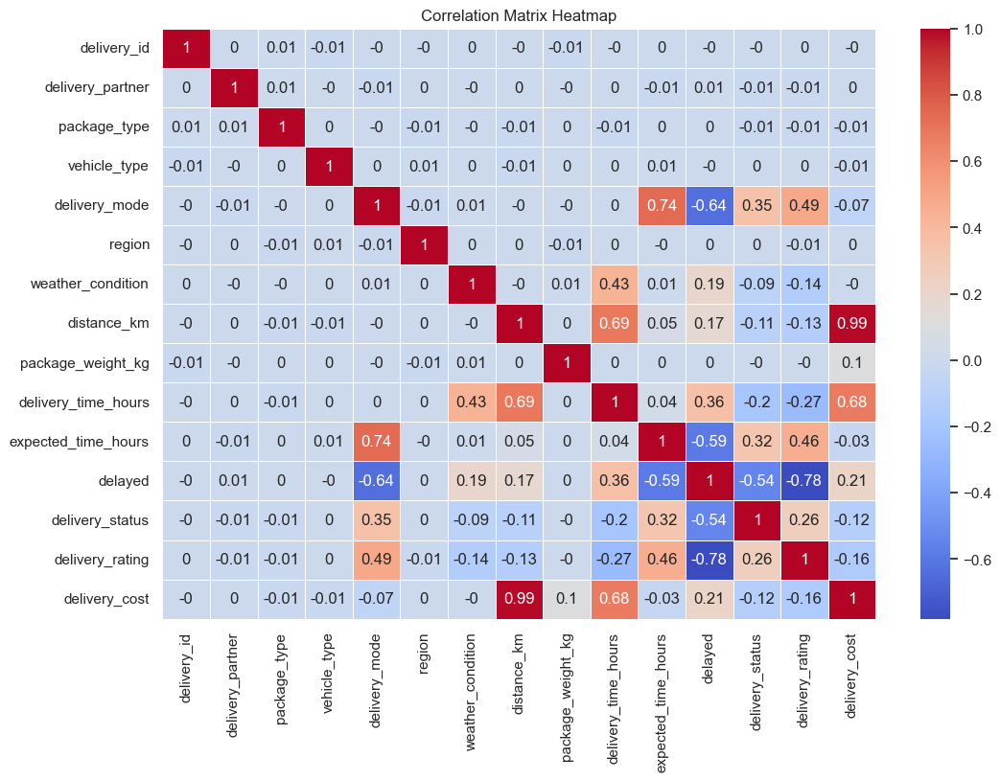

In [24]:
# Copia y one-hot encoding
df_2 = df_1.copy()

# Transformar todas las columnas categóricas con LabelEncoder
for col in df_2.select_dtypes(include=["object", "category"]).columns:
    le = LabelEncoder()
    df_2[col] = le.fit_transform(df_2[col])

# --- Matriz de correlación ---
correlation_matrix = df_2.corr().round(2)

plt.figure(figsize=(12,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()



El mapa de correlación acompaña lo inferido en la sección anterior. Si cabe destacar que se nota una correlación elevada de **delivery_cost** con **delivery_time_hours** pero eso es a causa de que **distance_km** tienen una correlación prácticamente 1:1 y **distance_km** tiene una correlación elevada con **delivery_time_hours**. 

## **III.1 Selección de Datos**

Como destacamos en el análisis anterior, nuestras variables de independientes de interés son **weather_condition** y **distance_km** y nuestra variable objetivo es **delivery_time_hours**. Además, removemos los casos en los que el envío falló dado que no se cuenta con información de la causa y excede la predicción de la misma. Procedemos a armar el dataframe con dichas variables.

In [25]:
df_importantes = df_1.copy()
df_2 = df_1.copy()
df_2 = df_2.drop(columns=['delivery_id','delayed','delivery_rating','delivery_status', 'delivery_cost', 'expected_time_hours'])

df_importantes = df_importantes[["distance_km", "weather_condition" , "delivery_time_hours"]]

df_importantes.head()

,distance_km,weather_condition,delivery_time_hours
0,297.0,clear,8
1,89.6,cold,2
2,273.5,rainy,10
3,269.7,cold,6
4,256.7,foggy,9


## **III.2 Codificación de variables categóricas**

Nuestra única variable categórica en nuestro dataframe con variables importantes es **weather_condition**. Dado que nuestro dataset está formado por solo 3 variables y la variable **weather_condition** contiene solo 6 únicos se opta por utilizar One-Hot Enconding.

In [26]:
# One-hot encoding de la columna weather_condition
df_encoded = pd.get_dummies(
    df_importantes,
    columns=["weather_condition"],   # columna a codificar
    prefix="weather",                # prefijo para las nuevas columnas
    drop_first=False,
    dtype=int                 
)

# Reacomodo las columnas para que me quede la variable objetivo en el extremo derecho (al final)
col = df_encoded.pop("delivery_time_hours")  # Extraemos la columna delivery_time_hours

# La inserto al final del DataFrame
df_encoded.insert(len(df_encoded.columns), "delivery_time_hours", col)

df_encoded.head()

,distance_km,weather_clear,weather_cold,weather_foggy,weather_hot,weather_rainy,weather_stormy,delivery_time_hours
0,297.0,1,0,0,0,0,0,8
1,89.6,0,1,0,0,0,0,2
2,273.5,0,0,0,0,1,0,10
3,269.7,0,1,0,0,0,0,6
4,256.7,0,0,1,0,0,0,9


In [27]:
# One-hot encoding de la columna weather_condition
df_all_encoded = pd.get_dummies(
    df_2,                
    drop_first=False,
    dtype=int                 
)
# Reacomodo las columnas para que me quede la variable objetivo en el extremo derecho (al final)
col = df_all_encoded.pop("delivery_time_hours")  # Extraemos la columna delivery_time_hours

# La inserto al final del DataFrame
df_all_encoded.insert(len(df_all_encoded.columns), "delivery_time_hours", col)
print(df_all_encoded.shape)
df_all_encoded.head()

(25000, 42)


,distance_km,package_weight_kg,delivery_partner_amazon logistics,delivery_partner_blue dart,delivery_partner_delhivery,delivery_partner_dhl,delivery_partner_ecom express,delivery_partner_ekart,delivery_partner_fedex,delivery_partner_shadowfax,...,region_north,region_south,region_west,weather_condition_clear,weather_condition_cold,weather_condition_foggy,weather_condition_hot,weather_condition_rainy,weather_condition_stormy,delivery_time_hours
0,297.0,46.96,0,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,8
1,89.6,47.39,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,2
2,273.5,26.89,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,10
3,269.7,12.69,0,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,0,6
4,256.7,37.02,0,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,9


## **III.3 Estandarización del dataset**

Estandarizamos de dos maneras el dataset (min-max para modelos de redes neuronales y StandardScaler para algoritmos que asumen normalidad) y partimos ambos dataset en dos para entrenar dos modelos distintos (modelo con clima favorables y modelo con clima adverso). En total se generan 6 dataset:
* Dataset Min-Max:
    * Dataset clima favorable
    * Dataset clima desfavorable
    * Dataset ambos climas
* Dataset StandardScaler:
    * Dataset clima favorable
    * Dataset clima desfavorable
    * Dataset ambos climas
    
Se dejó en ambos tipos de estandarización la versión sin particionar para considerar la posibilidad de modelar ambas condiciones de clima con un solo modelo ahorrandose el entrenamiento de un modelo.

In [28]:
df_minmax = df_encoded.copy()
df_minmax_all = df_all_encoded.copy()
df_standard = df_encoded.copy()

# Escaladores separados
scaler_X_standard = StandardScaler()
scaler_y_standard = StandardScaler()

# --- Standard Scaling ---
df_standard[["distance_km"]] = scaler_X_standard .fit_transform(
    df_standard[["distance_km"]]
)
df_standard[["delivery_time_hours"]] = scaler_y_standard.fit_transform(
    df_standard[["delivery_time_hours"]]
)

# Escaladores separados
scaler_X_minmax = MinMaxScaler()
scaler_y_minmax = MinMaxScaler()



# --- Min-Max Scaling ---
df_minmax[["distance_km"]] = scaler_X_minmax.fit_transform(
    df_minmax[["distance_km"]]
)
df_minmax[["delivery_time_hours"]] = scaler_y_minmax.fit_transform(
    df_minmax[["delivery_time_hours"]]
)

# Escaladores separados
scaler_X_minmax_all = MinMaxScaler()
scaler_y_minmax_all = MinMaxScaler()

# Escalar X (todas las columnas excepto la target)
X_cols = df_minmax_all.drop(columns=["delivery_time_hours"])
df_minmax_all[X_cols.columns] = scaler_X_minmax_all.fit_transform(X_cols)

# Escalar y (la target)
df_minmax_all[["delivery_time_hours"]] = scaler_y_minmax_all.fit_transform(df_minmax_all[["delivery_time_hours"]])




df_mmfavorable = df_minmax.copy()
df_mmdesfavorable = df_minmax.copy()
df_sfavorable = df_standard.copy()
df_sdesfavorable = df_standard.copy()


# Dataset con clima favorable (hot, cold, clear)
df_mmfavorable = df_mmfavorable.drop(columns=['weather_stormy', 'weather_rainy', 'weather_foggy']).reset_index(drop=True)
df_sfavorable = df_sfavorable.drop(columns=['weather_stormy', 'weather_rainy', 'weather_foggy']).reset_index(drop=True)

# Dataset con clima desfavorable (stormy, rainy, foggy)
df_sdesfavorable = df_sdesfavorable.drop(columns=['weather_clear', 'weather_cold', 'weather_hot']).reset_index(drop=True)
df_mmdesfavorable = df_mmdesfavorable.drop(columns=['weather_clear', 'weather_cold', 'weather_hot']).reset_index(drop=True)

print(df_minmax.head())
print(df_standard.head())
print(df_mmfavorable.head())
print(df_sdesfavorable.head())


   distance_km  weather_clear  weather_cold  weather_foggy  weather_hot  \
0     0.999659              1             0              0            0   
1     0.293015              0             1              0            0   
2     0.919591              0             0              0            0   
3     0.906644              0             1              0            0   
4     0.862351              0             0              1            0   

   weather_rainy  weather_stormy  delivery_time_hours  
0              0               0             0.421053  
1              0               0             0.105263  
2              1               0             0.526316  
3              0               0             0.315789  
4              0               0             0.473684  
   distance_km  weather_clear  weather_cold  weather_foggy  weather_hot  \
0     1.696713              1             0              0            0   
1    -0.703528              0             1              0     

# **IV. Modelado y Evaluación Técnica**

Se procederá a seleccionar y evaluar distintos modelos con el fin de obtener el mejor modelo para nuestro proyecto.


## **IV.1 Selección de técnicas de modelado**

Los modelos a utilizar, de menor a mayor sofisticación, serán:
* **BayesianRidge** como modelo de benchmark para evaluar la dificultad del problema a modelar.
* **LinearRegresion**
* **Epsilon-Support Vector Regression**
* **LGBMRegressor**
* **NeuralNetwork**

In [29]:
# Bayesian Ridge Regression
from sklearn.linear_model import BayesianRidge

In [30]:
# Regresion lineal
from sklearn.linear_model import LinearRegression

In [31]:
# SVM
from sklearn.svm import SVR 

In [32]:
# Decision Trees
from lightgbm import LGBMRegressor

In [33]:
#Importamos módulo referido a deep neural network
import tensorflow as tf
tf.__version__
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
import keras_tuner as kt
import tempfile

## **IV.2 Generación de Particiones de Entrenamiento**

Se generan particiones para entrenar y luego evaluar los modelos.

* **Min-Max**

In [34]:
# Dataset con clima favorable (hot, cold, clear)
X_train_mmfv, X_test_mmfv, y_train_mmfv, y_test_mmfv = train_test_split(df_mmfavorable.drop(columns=['delivery_time_hours']), df_mmfavorable['delivery_time_hours'], test_size=0.3, random_state=42)

In [35]:
# Dataset con clima desfavorable (stormy, rainy, foggy)
X_train_mmdv, X_test_mmdv, y_train_mmdv, y_test_mmdv = train_test_split(df_mmdesfavorable.drop(columns=['delivery_time_hours']), df_mmdesfavorable['delivery_time_hours'], test_size=0.3, random_state=42)

In [36]:
# Dataset con todos los climas
X_train_mm, X_test_mm, y_train_mm, y_test_mm = train_test_split(df_minmax.drop(columns=['delivery_time_hours']), df_minmax['delivery_time_hours'], test_size=0.3, random_state=42)

* **Standard Scaler**

In [37]:
# Dataset con clima favorable (hot, cold, clear)
X_train_sfv, X_test_sfv, y_train_sfv, y_test_sfv = train_test_split(df_sfavorable.drop(columns=['delivery_time_hours']), df_sfavorable['delivery_time_hours'], test_size=0.3, random_state=42)

In [38]:
# Dataset con clima desfavorable (stormy, rainy, foggy)
X_train_sdv, X_test_sdv, y_train_sdv, y_test_sdv = train_test_split(df_sdesfavorable.drop(columns=['delivery_time_hours']), df_sdesfavorable['delivery_time_hours'], test_size=0.3, random_state=42)

In [39]:
# Dataset con todos los climas
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(df_standard.drop(columns=['delivery_time_hours']), df_standard['delivery_time_hours'], test_size=0.3, random_state=42)

* **Dataset Completo sin estandarizar**

In [40]:
X_train, X_test, y_train, y_test = train_test_split(df_all_encoded.drop(columns=['delivery_time_hours']), df_all_encoded['delivery_time_hours'], test_size=0.3, random_state=42)

* **Dataset Completo min_max**

In [41]:
X_train_mm_all, X_test_mm_all, y_train_mm_all, y_test_mm_all = train_test_split(df_minmax_all.drop(columns=['delivery_time_hours']), df_minmax_all['delivery_time_hours'], test_size=0.3, random_state=42)

## **IV. 3 Generación de Modelo, Entrenamiento y Evaluación Técnica**

Generamos las funciones para evaluar el desempeño de los modelos.

In [42]:

def pred_desestandarizada_res(model, X_train, X_test, y_train, y_test, scaler_y):
    """
    Obtener las predicciones y residuos tanto desestandarizados como estandarizados
    Parámetros:
    -----------
    modelo: modelo entrenado
    X_train: datos de entrenamiento (features)
    X_test: datos de prueba (features)
    y_train: datos de entrenamiento (target)
    y_test: datos de prueba (target)
    scaler_y: scaler utilizado para desestandarizar los datos

    """
    # Predigo los valores usando el modelo con los datos de prueba y entrenamiento para comparar
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    # Recuperamos y_train e y_test a sus valores reales (desestandarizados)
    y_train_real = scaler_y.inverse_transform(np.asarray(y_train).reshape(-1, 1))
    y_test_real  = scaler_y.inverse_transform(np.asarray(y_test).reshape(-1, 1))


    # Recuperamos las predicciones a sus valores reales (desestandarizados)
    y_train_pred_real = scaler_y.inverse_transform(y_train_pred.reshape(-1, 1))
    y_test_pred_real = scaler_y.inverse_transform(y_test_pred.reshape(-1, 1))
    # Calculamos los residuos
    residuales = y_test_real - y_test_pred_real

    return y_train_real, y_train_pred_real, y_test_real, y_test_pred_real, residuales

In [43]:
def plot_real_vs_pred(y_real, y_pred, ax=None, title="Valores Predichos vs. Valores Reales", xlabel="Valores Reales", ylabel="Valores Predichos"):
    """
    Genera un gráfico de dispersión entre valores reales y predichos,
    incluyendo la línea de identidad (y = x).
    
    Parámetros:
    -----------
    y_real : array-like
        Valores reales (1D o 2D).
    y_pred : array-like
        Valores predichos (1D o 2D).
    title : str
        Título del gráfico.
    xlabel : str
        Etiqueta del eje X.
    ylabel : str
        Etiqueta del eje Y.
    """
    # Asegurar que sean vectores 1D
    y_real = np.ravel(y_real)
    y_pred = np.ravel(y_pred)

    if ax is None:  # si no se pasa un subplot, crea uno nuevo
        fig, ax = plt.subplots(figsize=(8, 6))

    plt.figure(figsize=(8, 6))
    
    # Gráfico de dispersión
    sns.scatterplot(x=y_real, y=y_pred, alpha=0.7, ax=ax, label='Predicciones vs. Reales')
    
    # Línea de identidad
    min_val = min(y_real.min(), y_pred.min())
    max_val = max(y_real.max(), y_pred.max())
    ideal_line_x = np.linspace(min_val - 1, max_val + 1, 100)
    ax.plot(ideal_line_x, ideal_line_x, color='red', linestyle='--', linewidth=2, label='Ideal (Predicho = Real)')
    
    # Etiquetas y título
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    ax.grid(True)

    if ax is None:  # solo mostrar si se creó figura propia
        plt.show()

In [44]:
def train_val(y_train, y_train_pred, y_test, y_pred, i): 
    
    scores = {
    i+"_train": {"R2" : r2_score(y_train, y_train_pred),                        
    "RMSE" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
    
    i+"_test": {"R2" : r2_score(y_test, y_pred),
    "RMSE" : np.sqrt(mean_squared_error(y_test, y_pred))}
    }
    
    return pd.DataFrame(scores)

### **IV. 3.0 BayesianRidge**

In [45]:
model_bayefv = BayesianRidge()
model_bayedv = BayesianRidge()
model_baye = BayesianRidge()

model_bayefv.fit(X_train_sfv, y_train_sfv)
y_train_realbyfv, y_train_pred_realbyfv, y_test_realbyfv, y_test_pred_realbyfv, _  = pred_desestandarizada_res(model_bayefv, X_train_sfv, X_test_sfv, y_train_sfv, y_test_sfv, scaler_y_standard)   

model_bayedv.fit(X_train_sdv, y_train_sdv)
y_train_realbydv, y_train_pred_realbydv, y_test_realbydv, y_test_pred_realbydv, _ = pred_desestandarizada_res(model_bayedv, X_train_sdv, X_test_sdv, y_train_sdv, y_test_sdv, scaler_y_standard)

model_baye.fit(X_train_s, y_train_s)
y_train_realby, y_train_pred_realby, y_test_realby, y_test_pred_realby, _  = pred_desestandarizada_res(model_baye, X_train_s, X_test_s, y_train_s, y_test_s, scaler_y_standard)


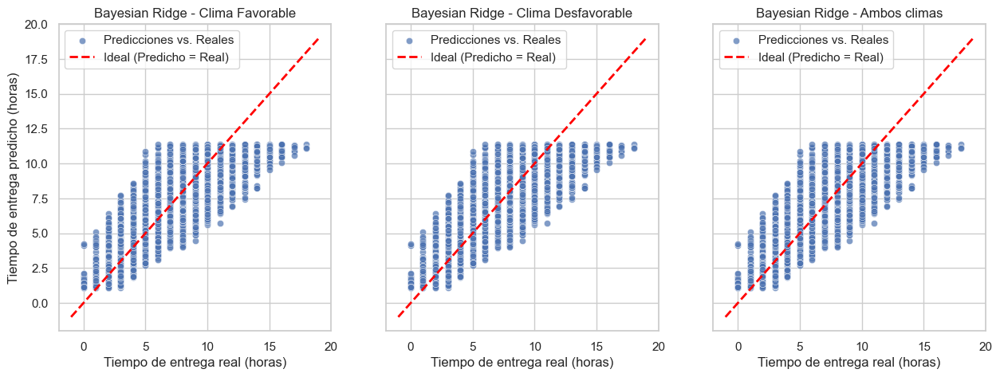

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [46]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharex=True, sharey=True)

plot_real_vs_pred(y_test_realbyfv, y_test_pred_realbyfv,
                  title="Bayesian Ridge - Clima Favorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[0])

plot_real_vs_pred(y_test_realbyfv, y_test_pred_realbyfv,
                  title="Bayesian Ridge - Clima Desfavorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[1])

plot_real_vs_pred(y_test_realbyfv, y_test_pred_realbyfv,
                  title="Bayesian Ridge - Ambos climas",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[2])

plt.tight_layout()
plt.show()

In [47]:
results_byfv = train_val(y_train_realbyfv, y_train_pred_realbyfv, y_test_realbyfv, y_test_pred_realbyfv , 'Bayesian Ridge - Clima Favorable')
results_bydv = train_val(y_train_realbydv, y_train_pred_realbydv, y_test_realbydv, y_test_pred_realbydv , 'Bayesian Ridge - Clima Desfavorable')
results_by = train_val(y_train_realby, y_train_pred_realby, y_test_realby, y_test_pred_realby , 'Bayesian Ridge - Ambos Climas')

print("Rendimiento del modelo de Bayesian Ridge - Clima Favorable:")
print(results_byfv, "\n\n")
print("Rendimiento del modelo de Bayesian Ridge - Clima Desfavorable:")
print(results_bydv, "\n\n")
print("Rendimiento del modelo de Bayesian Ridge - Ambos Climas:")
print(results_by)

Rendimiento del modelo de Bayesian Ridge - Clima Favorable:
      Bayesian Ridge - Clima Favorable_train  \
R2                                  0.688386   
RMSE                                1.753629   

      Bayesian Ridge - Clima Favorable_test  
R2                                 0.689102  
RMSE                               1.750530   


Rendimiento del modelo de Bayesian Ridge - Clima Desfavorable:
      Bayesian Ridge - Clima Desfavorable_train  \
R2                                     0.735578   
RMSE                                   1.615394   

      Bayesian Ridge - Clima Desfavorable_test  
R2                                    0.735281  
RMSE                                  1.615300   


Rendimiento del modelo de Bayesian Ridge - Ambos Climas:
      Bayesian Ridge - Ambos Climas_train  Bayesian Ridge - Ambos Climas_test
R2                               0.735579                            0.735280
RMSE                             1.615391                            1.615

### **IV. 3.1 LinearRegression**

Dado el desempeño del modelo de Bayes se espera también un desempeño pobre por parte del modelo de regresión lineal.

In [48]:
model_linfv = LinearRegression()
model_lindv = LinearRegression()
model_lin = LinearRegression()

model_linfv.fit(X_train_sfv, y_train_sfv)
y_train_real_linfv, y_train_pred_real_linfv, y_test_real_linfv, y_test_pred_real_linfv, _ = pred_desestandarizada_res(model_linfv, X_train_sfv, X_test_sfv, y_train_sfv, y_test_sfv, scaler_y_standard)   

model_lindv.fit(X_train_sdv, y_train_sdv)
y_train_real_lindv, y_train_pred_real_lindv, y_test_real_lindv, y_test_pred_real_lindv, _ = pred_desestandarizada_res(model_lindv, X_train_sdv, X_test_sdv, y_train_sdv, y_test_sdv, scaler_y_standard)

model_lin.fit(X_train_s, y_train_s)
y_train_real_lin, y_train_pred_real_lin, y_test_real_lin, y_test_pred_real_lin, _  = pred_desestandarizada_res(model_lin, X_train_s, X_test_s, y_train_s, y_test_s, scaler_y_standard)


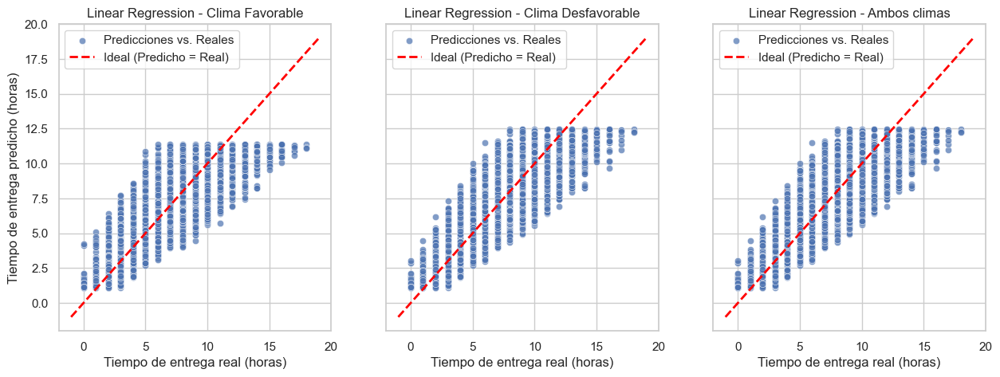

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [49]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharex=True, sharey=True)

plot_real_vs_pred(y_test_real_linfv, y_test_pred_real_linfv,
                  title="Linear Regression - Clima Favorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[0])

plot_real_vs_pred(y_test_real_lindv, y_test_pred_real_lindv,
                  title="Linear Regression - Clima Desfavorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[1])

plot_real_vs_pred(y_test_real_lin, y_test_pred_real_lin,
                  title="Linear Regression - Ambos climas",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[2])

plt.tight_layout()
plt.show()

In [50]:
results_linfv = train_val(y_train_real_linfv, y_train_pred_real_linfv, y_test_real_linfv, y_test_pred_real_linfv , 'Linear Regression - Clima Favorable')
results_lindv = train_val(y_train_real_lindv, y_train_pred_real_lindv, y_test_real_lindv, y_test_pred_real_lindv , 'Linear Regression - Clima Desfavorable')
results_lin = train_val(y_train_real_lin, y_train_pred_real_lin, y_test_real_lin, y_test_pred_real_lin , 'Linear Regression - Ambos Climas')

print("Rendimiento del modelo de Linear Regression - Clima Favorable:")
print(results_linfv, "\n\n")
print("Rendimiento del modelo de Linear Regression - Clima Desfavorable:")
print(results_lindv, "\n\n")
print("Rendimiento del modelo de Linear Regression - Ambos Climas:")
print(results_lin)

Rendimiento del modelo de Linear Regression - Clima Favorable:
      Linear Regression - Clima Favorable_train  \
R2                                     0.688386   
RMSE                                   1.753629   

      Linear Regression - Clima Favorable_test  
R2                                    0.689100  
RMSE                                  1.750534   


Rendimiento del modelo de Linear Regression - Clima Desfavorable:
      Linear Regression - Clima Desfavorable_train  \
R2                                        0.735578   
RMSE                                      1.615394   

      Linear Regression - Clima Desfavorable_test  
R2                                       0.735280  
RMSE                                     1.615303   


Rendimiento del modelo de Linear Regression - Ambos Climas:
      Linear Regression - Ambos Climas_train  \
R2                                  0.735579   
RMSE                                1.615391   

      Linear Regression - Ambos Climas_t

### **IV. 3.2 SVR**

In [51]:
param_grid = {'C': [10,100,1000], 'gamma': ['scale',0.01,0.001], 'kernel': ['rbf']}

grid_fv = GridSearchCV(estimator=SVR(),param_grid= param_grid, refit = True, verbose=2, cv=5 )
grid_fv.fit(X_train_sfv,y_train_sfv)
model_SVRfv = SVR(**grid_fv.best_params_)
model_SVRfv.fit(X_train_sfv, y_train_sfv)
y_train_real_SVRfv, y_train_pred_real_SVRfv, y_test_real_SVRfv, y_test_pred_real_SVRfv, _ = pred_desestandarizada_res(model_SVRfv, X_train_sfv, X_test_sfv, y_train_sfv, y_test_sfv, scaler_y_standard)   


grid_dv = GridSearchCV(estimator=SVR(),param_grid= param_grid, refit = True, verbose=2, cv=5 )
grid_dv.fit(X_train_sdv,y_train_sdv)
model_SVRdv = SVR(**grid_dv.best_params_)
model_SVRdv.fit(X_train_sdv, y_train_sdv)
y_train_real_SVRdv, y_train_pred_real_SVRdv, y_test_real_SVRdv, y_test_pred_real_SVRdv, _ = pred_desestandarizada_res(model_SVRdv, X_train_sdv, X_test_sdv, y_train_sdv, y_test_sdv, scaler_y_standard)


grid_e = GridSearchCV(estimator=SVR(),param_grid= param_grid, refit = True, verbose=2, cv=5 )
grid_e.fit(X_train_s,y_train_s)
model_SVR = SVR(**grid_e.best_params_)
model_SVR.fit(X_train_s, y_train_s)
y_train_real_SVR, y_train_pred_real_SVR, y_test_real_SVR, y_test_pred_real_SVR, _  = pred_desestandarizada_res(model_SVR, X_train_s, X_test_s, y_train_s, y_test_s, scaler_y_standard)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=  14.4s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=  13.9s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=  13.8s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=  14.0s
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time=  13.6s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=  13.3s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=  13.2s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=  13.3s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=  13.5s
[CV] END .......................C=10, gamma=0.01, kernel=rbf; total time=  13.3s
[CV] END ......................C=10, gamma=0.001, kernel=rbf; total time=  12.8s
[CV] END ......................C=10, gamma=0.001,

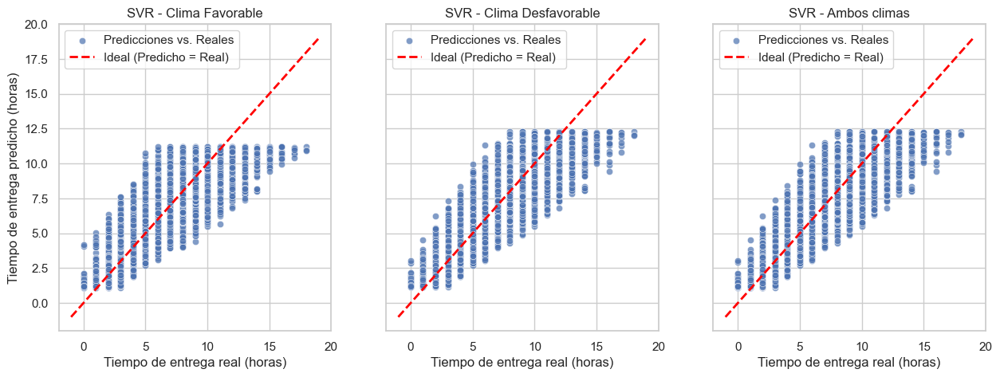

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [52]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharex=True, sharey=True)

plot_real_vs_pred(y_test_real_SVRfv, y_test_pred_real_SVRfv,
                  title="SVR - Clima Favorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[0])

plot_real_vs_pred(y_test_real_SVRdv, y_test_pred_real_SVRdv,
                  title="SVR - Clima Desfavorable",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[1])

plot_real_vs_pred(y_test_real_SVR, y_test_pred_real_SVR,
                  title="SVR - Ambos climas",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)",
                  ax=axes[2])

plt.tight_layout()
plt.show()

In [53]:
results_SVRfv = train_val(y_train_real_SVRfv, y_train_pred_real_SVRfv, y_test_real_SVRfv, y_test_pred_real_SVRfv , 'SVR - Clima Favorable')
results_SVRdv = train_val(y_train_real_SVRdv, y_train_pred_real_SVRdv, y_test_real_SVRdv, y_test_pred_real_SVRdv , 'SVR - Clima Desfavorable')
results_SVR = train_val(y_train_real_SVR, y_train_pred_real_SVR, y_test_real_SVR, y_test_pred_real_SVR , 'SVR - Ambos Climas')

print("Rendimiento del modelo de SVR - Clima Favorable:")
print(results_SVRfv, "\n\n")
print("Rendimiento del modelo de SVR - Clima Desfavorable:")
print(results_SVRdv, "\n\n")
print("Rendimiento del modelo de SVR - Ambos Climas:")
print(results_SVR)

Rendimiento del modelo de SVR - Clima Favorable:
      SVR - Clima Favorable_train  SVR - Clima Favorable_test
R2                       0.687413                    0.687599
RMSE                     1.756367                    1.754757 


Rendimiento del modelo de SVR - Clima Desfavorable:
      SVR - Clima Desfavorable_train  SVR - Clima Desfavorable_test
R2                          0.734651                       0.733651
RMSE                        1.618224                       1.620264 


Rendimiento del modelo de SVR - Ambos Climas:
      SVR - Ambos Climas_train  SVR - Ambos Climas_test
R2                    0.734664                 0.733644
RMSE                  1.618183                 1.620287


### **IV. 3.3 LGBM Regressor**

In [54]:
# Grid de hiperparámetros
param_grid = {'n_estimators': [100, 200, 300], 'max_depth': [-1, 3, 5, 7], 'learning_rate': [0.01, 0.05, 0.1], 'num_leaves': [15, 31], 'min_child_samples': [10, 20]}


grid_LGBM = GridSearchCV(estimator=LGBMRegressor(random_state=42),param_grid= param_grid, refit = True, verbose=2, cv=5 )
grid_LGBM.fit(X_train,y_train)
model_LGBM = LGBMRegressor(**grid_LGBM.best_params_)
model_LGBM.fit(X_train, y_train)
#y_train_real_LGBM, y_train_pred_real_LGBM, y_test_real_LGBM, y_test_pred_real_LGBM, _ = pred_desestandarizada_res(model_LGBM, X_train, X_test, y_train, y_test, scaler_y_standard)   

# Predigo los valores usando el modelo con los datos de prueba y entrenamiento para comparar
y_train_LGBM = model_LGBM.predict(X_train)
y_test_LGBM = model_LGBM.predict(X_test)



Fitting 5 folds for each of 144 candidates, totalling 720 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 588
[LightGBM] [Info] Number of data points in the train set: 14000, number of used features: 41
[LightGBM] [Info] Start training from score 6.225929
[CV] END learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=15; total time=   0.5s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000192 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 

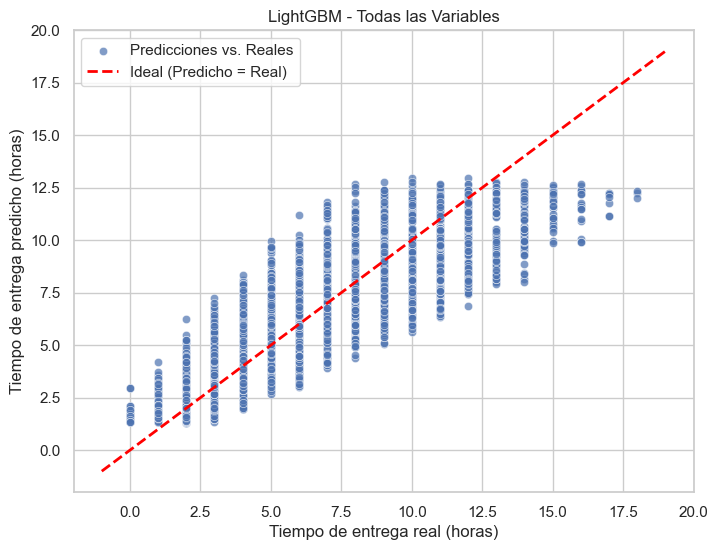

<Figure size 800x600 with 0 Axes>

In [55]:
plot_real_vs_pred(y_test, y_test_LGBM,
                  title="LightGBM - Todas las Variables",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)"
                  )

plt.tight_layout()
plt.show()

In [56]:
results_LGBM = train_val(y_train, y_train_LGBM, y_test, y_test_LGBM , 'LightGBM - Todas las Variables')

print("Rendimiento del modelo de LightGBM - Todas las Variables:")
print(results_LGBM, "\n\n")


Rendimiento del modelo de LightGBM - Todas las Variables:
      LightGBM - Todas las Variables_train  \
R2                                0.742077   
RMSE                              1.595419   

      LightGBM - Todas las Variables_test  
R2                               0.732965  
RMSE                             1.622352   




### **IV. 3.4 Neural Network**

In [57]:
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))

# Definimos la función que construye el modelo
def build_model(hp):
    inputs = keras.Input(shape=(X_train_mm_all.shape[1],))
    prev_units = X_train_mm_all.shape[1]  # límite inicial: número de features
    # Número de capas ocultas: entre 1 y 3
    x = inputs
    for i in range(hp.Int('num_layers', 1, 3)):
        units = hp.Int(
            f'units_{i}',
            min_value=16,
            max_value=prev_units,  # nunca mayor que la capa anterior
            step=16
        )

        x = layers.Dense(units=units, activation='relu')(x)
        x = layers.Dropout(rate=hp.Float(f'dropout_{i}', 0.0, 0.5, step=0.1))(x)
        
        prev_units = units  # actualizar límite para la siguiente capa
    

    outputs = layers.Dense(1, activation='linear')(x)
    model = keras.Model(inputs, outputs)
    
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
        ),
        loss='mse',
        metrics=[rmse]
    )
    return model


In [58]:
# Definimos el tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=50,
    factor=3,
    directory=tempfile.mkdtemp(),
    project_name='regression_tuning'
)

# Early stopping para acelerar (le defino uno distinto al que usé antes para no interferir con los anteriores modelos y viceversa)
stop_early = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

In [59]:
y_train_mm_all = y_train_mm_all.astype('float32')
y_test_mm_all = y_test_mm_all.astype('float32')
# Ejecutamos la búsqueda
tuner.search(X_train_mm_all, y_train_mm_all,
             epochs=600,
             validation_data=(X_test_mm_all, y_test_mm_all),
             callbacks=[stop_early])

# Obtenemos el mejor modelo
best_model = tuner.get_best_models(num_models=1)[0]
# Evaluamos en test
loss, rmse = best_model.evaluate(X_test_mm_all, y_test_mm_all)
print("Mejor modelo - RMSE:", rmse)

Trial 90 Complete [00h 01m 24s]
val_loss: 0.00926803145557642

Best val_loss So Far: 0.007313355337828398
Total elapsed time: 00h 31m 12s
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0073 - rmse: 0.0848
Mejor modelo - RMSE: 0.08477059751749039


In [60]:
best_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 41)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │           672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 689 (2.69 KB)

 Trainable params: 689 (2.69 KB)

 Non-trainable params: 0 (0.00 B)

In [61]:
best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]

# Convertimos a DataFrame
hp_df = pd.DataFrame(list(best_hp.values.items()), columns=["Hiperparámetro", "Valor"])

print(hp_df)


         Hiperparámetro  Valor
0            num_layers      1
1               units_0     16
2             dropout_0    0.3
3         learning_rate  0.001
4               units_1     16
5             dropout_1    0.3
6               units_2     16
7             dropout_2    0.3
8          tuner/epochs     17
9   tuner/initial_epoch      6
10        tuner/bracket      2
11          tuner/round      1
12       tuner/trial_id   0054


In [62]:
history = best_model.fit(
    X_train_mm_all, y_train_mm_all,
    epochs=600,
    validation_data=(X_test_mm_all, y_test_mm_all),
    callbacks=[stop_early]
)

Epoch 1/600


547/547 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0088 - rmse: 0.0931 - val_loss: 0.0074 - val_rmse: 0.0855
Epoch 2/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0087 - rmse: 0.0926 - val_loss: 0.0079 - val_rmse: 0.0880
Epoch 3/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0087 - rmse: 0.0925 - val_loss: 0.0075 - val_rmse: 0.0858
Epoch 4/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0087 - rmse: 0.0926 - val_loss: 0.0074 - val_rmse: 0.0851
Epoch 5/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0086 - rmse: 0.0922 - val_loss: 0.0074 - val_rmse: 0.0851
Epoch 6/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0087 - rmse: 0.0923 - val_loss: 0.0074 - val_rmse: 0.0855
Epoch 7/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0085 - rmse: 0.0915 - val_loss: 0.0074 - val_rmse: 0.0850
Epoch 8/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0087 - rmse: 0.0924 - val_loss: 0.0075 - val_rmse: 0.0857
Epoch 9/600
547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 

In [63]:
loss_df = pd.DataFrame(history.history)
loss_df.tail()

,loss,rmse,val_loss,val_rmse
98,0.008477,0.091298,0.007472,0.085635
99,0.008551,0.091594,0.007498,0.085784
100,0.008475,0.091209,0.007350,0.084948
101,0.008438,0.090972,0.007448,0.085539
102,0.008461,0.091231,0.007500,0.085784


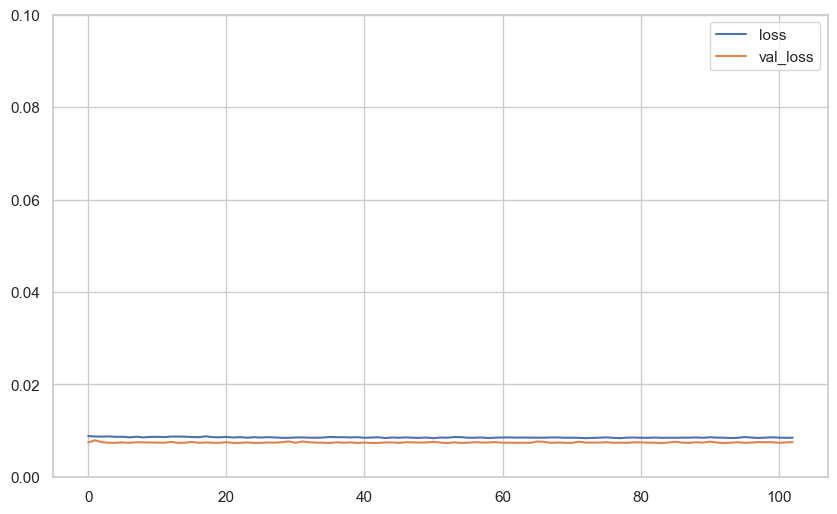

In [64]:
loss_df[['loss', 'val_loss']].plot(legend=True)
plt.ylim(0, 0.1)   # ajustá el límite superior según tus valores
plt.show()

In [65]:
y_train_real_DNN, y_train_pred_real_DNN, y_test_real_DNN, y_test_pred_real_DNN, _ = pred_desestandarizada_res(best_model, X_train_mm_all, X_test_mm_all, y_train_mm_all, y_test_mm_all, scaler_y_minmax_all)   


547/547 ━━━━━━━━━━━━━━━━━━━━ 1s 952us/step
235/235 ━━━━━━━━━━━━━━━━━━━━ 0s 886us/step


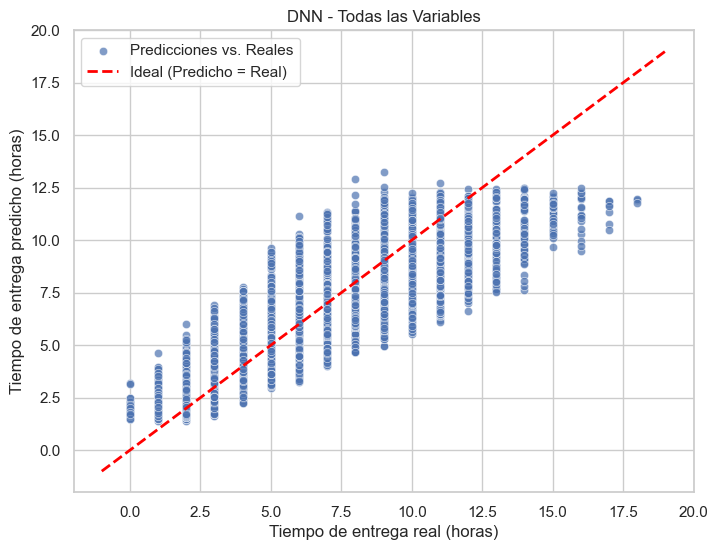

<Figure size 800x600 with 0 Axes>

In [66]:
plot_real_vs_pred(y_test_real_DNN, y_test_pred_real_DNN,
                  title="DNN - Todas las Variables",
                  xlabel="Tiempo de entrega real (horas)",
                  ylabel="Tiempo de entrega predicho (horas)"
                  )

In [67]:
results_DNN = train_val(y_train_real_DNN, y_train_pred_real_DNN, y_test_real_DNN, y_test_pred_real_DNN, 'DNN - Todas las Variables')

print("Rendimiento del modelo de DNN - Todas las Variables:")
print(results_DNN, "\n\n")

Rendimiento del modelo de DNN - Todas las Variables:
      DNN - Todas las Variables_train  DNN - Todas las Variables_test
R2                           0.731997                        0.725318
RMSE                         1.626295                        1.645417 




### **IV. 3.5 Resumen**

Se presentan los resultados de todos los modelos para su mejor comparación y toma de decisión acerca de la selección del mejor modelo para nuestra problemática. 

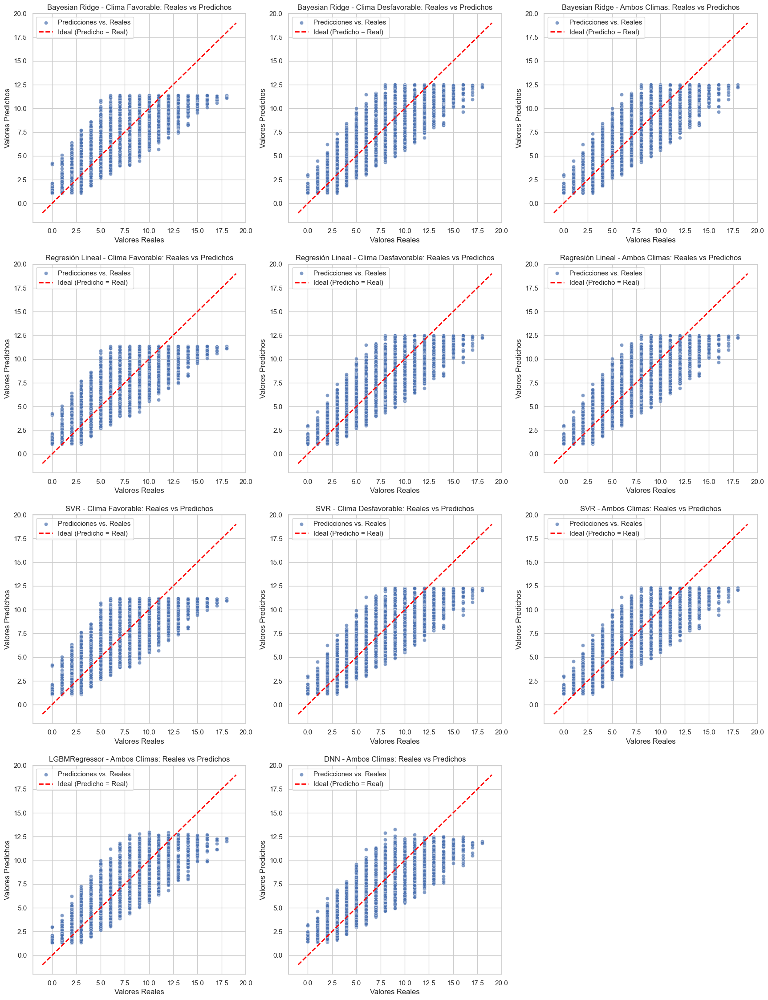

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [68]:
# Cada elemento corresponde a un modelo distinto
y_tests = [y_test_realbyfv, y_test_realbydv, y_test_realby, y_test_real_linfv, y_test_real_lindv, y_test_real_lin, y_test_real_SVRfv, y_test_real_SVRdv,y_test_real_SVR, y_test, y_test_real_DNN]
y_preds = [y_test_pred_realbyfv, y_test_pred_realbydv, y_test_pred_realby, y_test_pred_real_linfv, y_test_pred_real_lindv, y_test_pred_real_lin, y_test_pred_real_SVRfv, y_test_pred_real_SVRdv, y_test_pred_real_SVR, y_test_LGBM, y_test_pred_real_DNN]

model_names = ["Bayesian Ridge - Clima Favorable", "Bayesian Ridge - Clima Desfavorable", "Bayesian Ridge - Ambos Climas", "Regresión Lineal - Clima Favorable", "Regresión Lineal - Clima Desfavorable", "Regresión Lineal - Ambos Climas", "SVR - Clima Favorable", "SVR - Clima Desfavorable", "SVR - Ambos Climas", "LGBMRegressor - Ambos Climas", "DNN - Ambos Climas"]

import math

n_models = len(y_tests)
n_cols = 3
n_rows = math.ceil(n_models / n_cols)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(7*n_cols, 7*n_rows))

axes = axes.flatten()  # convertir a lista plana

for i in range(n_models):
    plot_real_vs_pred(y_tests[i], y_preds[i], ax=axes[i],
                      title=f"{model_names[i]}: Reales vs Predichos")

# Ocultar ejes sobrantes si hay menos modelos que subplots
for j in range(n_models, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


In [69]:
results_byfv.columns = ['RMSE_Train', 'RMSE_Test']
results_bydv.columns = ['RMSE_Train', 'RMSE_Test']
results_by.columns = ['RMSE_Train', 'RMSE_Test']

results_linfv.columns = ['RMSE_Train', 'RMSE_Test']
results_lindv.columns = ['RMSE_Train', 'RMSE_Test']
results_lin.columns = ['RMSE_Train', 'RMSE_Test']

results_SVRfv.columns = ['RMSE_Train', 'RMSE_Test']
results_SVRdv.columns = ['RMSE_Train', 'RMSE_Test']
results_SVR.columns = ['RMSE_Train', 'RMSE_Test']

results_LGBM.columns = ['RMSE_Train', 'RMSE_Test']

results_DNN.columns = ['RMSE_Train', 'RMSE_Test']

resumen = pd.concat([results_byfv.tail(1), results_bydv.tail(1), results_by.tail(1),results_linfv.tail(1), results_lindv.tail(1), results_lin.tail(1), results_SVRfv.tail(1), results_SVRdv.tail(1), results_SVR.tail(1), results_LGBM.tail(1), results_DNN.tail(1)], ignore_index=True)
resumen.index = ["Bayesian Ridge - Clima Favorable", "Bayesian Ridge - Clima Desfavorable", "Bayesian Ridge - Ambos Climas", "Linear Regression - Clima Favorable", "Linear Regression - Clima Desfavorable", "Linear Regression - Ambos Climas", "SVR - Clima Favorable", "SVR - Clima Desfavorable", "SVR - Ambos Climas  ", "LightGBM - Todas las Variables", "DNN - Todas las Variables"]
resumen.sort_values(by='RMSE_Test', inplace=True)
resumen ['Incremento (%) RMSE_Train/Test'] = ((resumen['RMSE_Test']-resumen['RMSE_Train']) / resumen['RMSE_Train'] * 100)
resumen ['Error Relativo (%) RMSE_Test/Media(CO2_emissions)'] = (resumen['RMSE_Test'] / df_1['delivery_time_hours'].mean() * 100)
resumen

,RMSE_Train,RMSE_Test,Incremento (%) RMSE_Train/Test,Error Relativo (%) RMSE_Test/Media(CO2_emissions)
Bayesian Ridge - Clima Desfavorable,1.615394,1.615300,-0.005799,25.852906
Linear Regression - Clima Desfavorable,1.615394,1.615303,-0.005584,25.852961
Bayesian Ridge - Ambos Climas,1.615391,1.615304,-0.005388,25.852964
Linear Regression - Ambos Climas,1.615391,1.615308,-0.005094,25.853039
SVR - Clima Desfavorable,1.618224,1.620264,0.126094,25.932363
SVR - Ambos Climas,1.618183,1.620287,0.130062,25.932728
LightGBM - Todas las Variables,1.595419,1.622352,1.688126,25.965770
DNN - Todas las Variables,1.626295,1.645417,1.175772,26.334924
Bayesian Ridge - Clima Favorable,1.753629,1.750530,-0.176741,28.017264
Linear Regression - Clima Favorable,1.753629,1.750534,-0.176477,28.017337


Todo los modelos tienen un desempeño similar en cuanto a la métrica RMSE evaluda en el conjunto Test. Se toma el modelo de Regresión lineal (de entrenamiento rápido y desempeño igual o mejor que el resto de los modelos en este caso particular) y se evalua cuánto bajó el porcentaje de **delayed**. 

In [70]:
df_standard_desempeño = df_standard.copy()

# Predigo los valores usando el modelo con los datos de prueba y entrenamiento para comparar
y_pred_std = model_lin.predict(df_standard_desempeño.drop(columns=['delivery_time_hours']))
y_pred = scaler_y_standard.inverse_transform(np.asarray(y_pred_std).reshape(-1, 1))
y_pred = y_pred.flatten()  # convertir a 1D

df_standard_desempeño ['horas_predichas_modelo_nuevo'] = y_pred
df_standard_desempeño ['horas_retraso'] = y_pred- scaler_y_standard.inverse_transform(np.asarray(df_standard_desempeño ['delivery_time_hours']).reshape(-1, 1)).flatten()
horas_de_retraso_modelo_nuevo = df_standard_desempeño ['horas_retraso'].sum()
horas_excedentes_modelo_nuevo = df_standard_desempeño[df_standard_desempeño ['horas_retraso'] > 0]['horas_retraso'].sum()
df_standard_desempeño ['delayed'] = df_standard_desempeño ['horas_retraso'].apply(lambda x: 0 if x >= 0 else 1)

df_exitos = df_1.copy()
df_exitos = df_exitos[df_exitos['delivery_status'] != 'failed']
horas_de_retraso_modelo_viejo_df = df_exitos['expected_time_hours'] - df_exitos['delivery_time_hours']
horas_de_retraso_modelo_viejo = horas_de_retraso_modelo_viejo_df.sum()
horas_excedentes_modelo_viejo = horas_de_retraso_modelo_viejo_df[horas_de_retraso_modelo_viejo_df > 0].sum()

print(df_standard_desempeño['delayed'].map({0: "no", 1: "yes"}).value_counts(normalize=True), "\n")
print(f'Horas excedentes predichas del modelo nuevo: {horas_excedentes_modelo_nuevo:.0f}\n\n')
print(df_exitos['delayed'].value_counts(normalize=True), "\n")
print(f'Horas excedentes predichas del modelo viejo: {horas_excedentes_modelo_viejo:.0f}')

delayed
no     0.51212
yes    0.48788
Name: proportion, dtype: float64 

Horas excedentes predichas del modelo nuevo: 15861


delayed
no     0.774375
yes    0.225625
Name: proportion, dtype: float64 

Horas excedentes predichas del modelo viejo: 187545


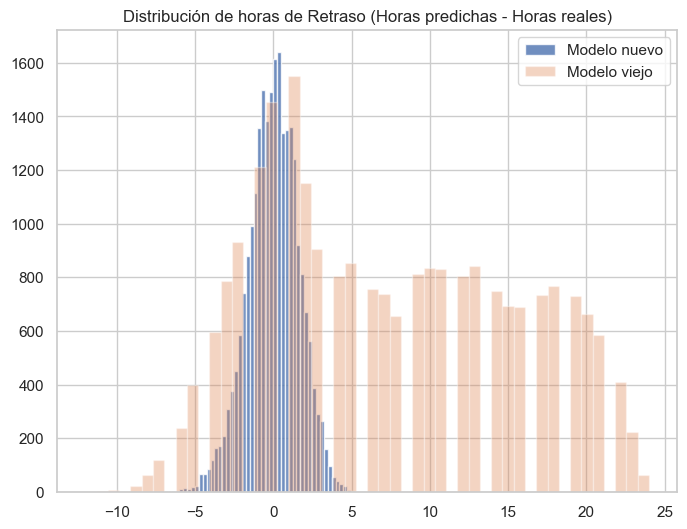

In [71]:
plt.figure(figsize=(8,6))

# Histograma del modelo nuevo
df_standard_desempeño['horas_retraso'].hist(bins=50, label="Modelo nuevo", alpha=0.8)

# Histograma del modelo viejo con transparencia
horas_de_retraso_modelo_viejo_df.hist(bins=50, label="Modelo viejo", alpha=0.35)

# Título y leyenda
plt.title("Distribución de horas de Retraso (Horas predichas - Horas reales)")
plt.legend()

plt.show()


### **IV. 3.6 Iteración #1**

Si bien el modelo logró una predicción mejor en cuanto a las horas de demora de los deliveries, empeoró la tasa de deliveries retrasados siendo nuestro objetivo reducir dicho valor. Se procedé a mejorar el modelo mediante el uso de complementario de otro modelo que agrega un excedente en función de las horas predichas. 

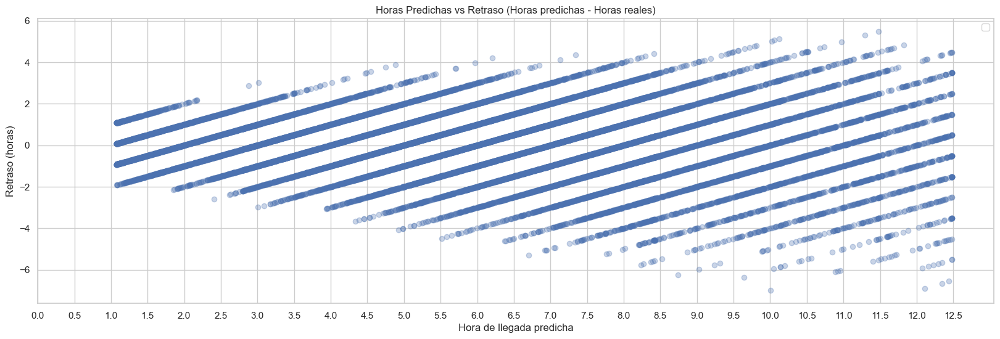

In [72]:
# Supongamos que tienes estas columnas en tu DataFrame
# 'hora_predicha' = horas de llegada predichas
# 'retraso' = retraso obtenido (puede ser negativo o positivo)

# Scatterplot de todos los puntos
plt.figure(figsize=(20,6))
plt.scatter(df_standard_desempeño ['horas_predichas_modelo_nuevo'], df_standard_desempeño ['horas_retraso'] , alpha=0.3)



#minimo_hora_predicha = pd.DataFrame(min_retraso, columns=['horas_predichas_modelo_nuevo', 'horas_retraso']).reset_index()
#plt.scatter(min_retraso ['horas_predichas_modelo_nuevo'], min_retraso ['horas_retraso'] , alpha=0.3)

# Etiquetas y leyenda
plt.xticks(np.arange(0, 13, 0.5))
plt.xlabel("Hora de llegada predicha")
plt.ylabel("Retraso (horas)")
plt.title("Horas Predichas vs Retraso (Horas predichas - Horas reales)")
plt.legend()
plt.show()

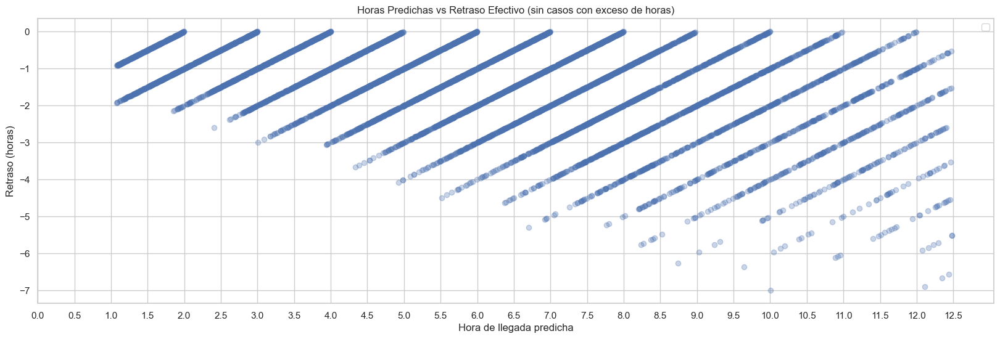

In [73]:
min_retraso = (
    df_standard_desempeño
    .groupby('horas_predichas_modelo_nuevo')['horas_retraso']
    .min()
)

# Filtrar negativos
min_retraso_filtrado = min_retraso[min_retraso < 0]

# Convertir a DataFrame y resetear índice
minimo_hora_predicha = min_retraso_filtrado.reset_index()

# Scatterplot de todos los puntos
plt.figure(figsize=(20,6))
plt.scatter(minimo_hora_predicha ['horas_predichas_modelo_nuevo'], minimo_hora_predicha ['horas_retraso'] , alpha=0.3)


#minimo_hora_predicha = pd.DataFrame(min_retraso, columns=['horas_predichas_modelo_nuevo', 'horas_retraso']).reset_index()
#plt.scatter(min_retraso ['horas_predichas_modelo_nuevo'], min_retraso ['horas_retraso'] , alpha=0.3)

# Etiquetas y leyenda
plt.xticks(np.arange(0, 13, 0.5))
plt.xlabel("Hora de llegada predicha")
plt.ylabel("Retraso (horas)")
plt.title("Horas Predichas vs Retraso Efectivo (sin casos con exceso de horas)")
plt.legend()
plt.show()

1.077635    -1.922365
1.083895    -1.916105
1.088424    -1.911576
1.117635    -1.882365
1.130134    -1.869866
               ...   
9.645942    -6.354058
10.000935   -6.999065
12.110135   -6.889865
12.345130   -6.654870
12.442628   -6.557372
Length: 558, dtype: float64


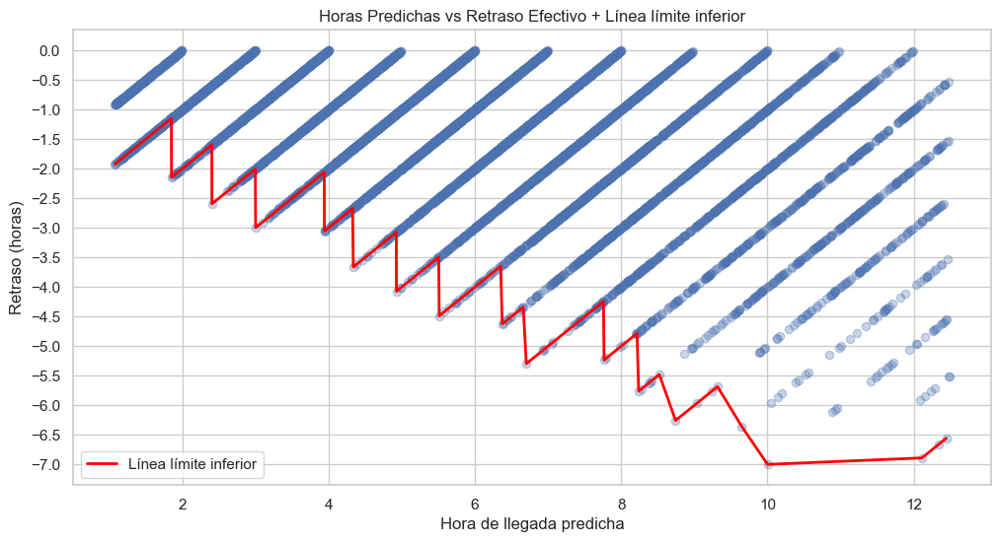

In [74]:
valores_suaves = []
ultimo_valido = None
limite_subida = 0.6  # cuánto puede subir como máximo

for idx, val in min_retraso.items():
    if ultimo_valido is None:
        # Primer valor siempre se toma
        valores_suaves.append((idx, val))
        ultimo_valido = val
    else:
        # Si baja (más negativo), siempre se acepta
        if val < ultimo_valido:
            valores_suaves.append((idx, val))
            ultimo_valido = val
        # Si sube, solo se acepta si la subida es menor o igual al límite
        elif val - ultimo_valido <= limite_subida:
            valores_suaves.append((idx, val))
            ultimo_valido = val
        # Si sube más que el límite, se descarta

# Convertir a Serie para graficar
suave_series = pd.Series(
    [v for _, v in valores_suaves],
    index=[i for i, _ in valores_suaves]
)

print(suave_series)

# Graficar
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.scatter(minimo_hora_predicha ['horas_predichas_modelo_nuevo'], minimo_hora_predicha ['horas_retraso'] , alpha=0.3)
plt.plot(suave_series.index, suave_series.values, color='red', linewidth=2, label="Línea límite inferior")
plt.yticks(np.arange(-7, 0.5, 0.5))
plt.title("Horas Predichas vs Retraso Efectivo + Línea límite inferior")
plt.xlabel("Hora de llegada predicha")
plt.ylabel("Retraso (horas)")
plt.legend()
plt.show()


In [75]:
suave_df = suave_series.reset_index()
suave_df.columns = ['horas_predichas_modelo_nuevo', 'horas_retraso']

print(suave_df)
print(suave_df.describe())

     horas_predichas_modelo_nuevo  horas_retraso
0                        1.077635      -1.922365
1                        1.083895      -1.916105
2                        1.088424      -1.911576
3                        1.117635      -1.882365
4                        1.130134      -1.869866
..                            ...            ...
553                      9.645942      -6.354058
554                     10.000935      -6.999065
555                     12.110135      -6.889865
556                     12.345130      -6.654870
557                     12.442628      -6.557372

[558 rows x 2 columns]
       horas_predichas_modelo_nuevo  horas_retraso
count                    558.000000     558.000000
mean                       3.452709      -2.484567
std                        2.156743       1.209195
min                        1.077635      -6.999065
25%                        1.681694      -3.083678
50%                        2.893715      -2.105044
75%                        4.43

**Modelo corrector/sobreestimador de horas**

In [76]:
from scipy.interpolate import interp1d

def limite_inferior_func(suave_df, kind='linear', fill_value='extrapolate'):
    """
    Devuelve una función que interpola/extrapola el límite inferior.
    
    suave_df: DataFrame con columnas ['horas_predichas_modelo_nuevo', 'horas_retraso']
    kind: tipo de interpolación ('linear', 'cubic', etc.)
    fill_value: cómo extrapolar fuera del rango ('extrapolate' o un valor fijo)
    """
    f_interp = interp1d(
        suave_df['horas_predichas_modelo_nuevo'],
        suave_df['horas_retraso'],
        kind=kind,
        fill_value=fill_value
    )
    return f_interp

# Crear la función a partir de tu recta
f_limite = limite_inferior_func(suave_df, kind='linear')

In [77]:
df_standard_desempeño_ajustada = df_standard.copy()

# Predigo los valores usando el modelo con los datos de prueba y entrenamiento para comparar
y_pred_std = model_lin.predict(df_standard_desempeño_ajustada.drop(columns=['delivery_time_hours']))
y_pred = scaler_y_standard.inverse_transform(np.asarray(y_pred_std).reshape(-1, 1))
y_pred = y_pred.flatten()  # convertir a 1D

df_standard_desempeño_ajustada ['horas_predichas_modelo_nuevo'] = y_pred- f_limite(y_pred)
df_standard_desempeño_ajustada ['horas_retraso'] = df_standard_desempeño_ajustada ['horas_predichas_modelo_nuevo']- scaler_y_standard.inverse_transform(np.asarray(df_standard_desempeño_ajustada ['delivery_time_hours']).reshape(-1, 1)).flatten()
horas_de_retraso_modelo_nuevo = df_standard_desempeño_ajustada ['horas_retraso'].sum()
horas_excedentes_modelo_nuevo = df_standard_desempeño_ajustada[df_standard_desempeño_ajustada ['horas_retraso'] > 0]['horas_retraso'].sum()
df_standard_desempeño_ajustada ['delayed'] = df_standard_desempeño_ajustada ['horas_retraso'].apply(lambda x: 0 if x >= 0 else 1)


print(df_standard_desempeño_ajustada['delayed'].map({0: "no", 1: "yes"}).value_counts(normalize=True), "\n")
print(f'Horas excedentes predichas del modelo nuevo: {horas_excedentes_modelo_nuevo:.0f}\n\n')
print(df_exitos['delayed'].value_counts(normalize=True), "\n")
print(f'Horas excedentes predichas del modelo viejo: {horas_excedentes_modelo_viejo:.0f}\n\n')

print(f"Reducción de horas de retraso: {(horas_excedentes_modelo_viejo - horas_excedentes_modelo_nuevo)/horas_excedentes_modelo_viejo*100:.1f}%")

delayed
no    1.0
Name: proportion, dtype: float64 

Horas excedentes predichas del modelo nuevo: 105614


delayed
no     0.774375
yes    0.225625
Name: proportion, dtype: float64 

Horas excedentes predichas del modelo viejo: 187545


Reducción de horas de retraso: 43.7%


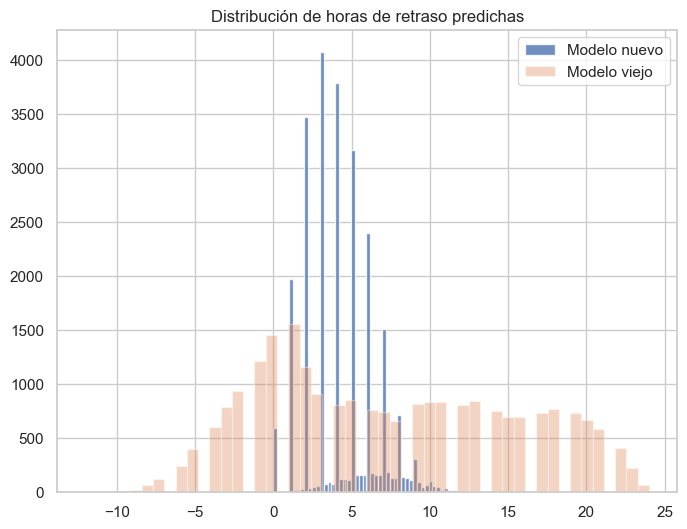

In [78]:
plt.figure(figsize=(8,6))

# Histograma del modelo nuevo
df_standard_desempeño_ajustada['horas_retraso'].hist(bins=50, label="Modelo nuevo", alpha=0.8)

# Histograma del modelo viejo con transparencia
horas_de_retraso_modelo_viejo_df.hist(bins=50, label="Modelo viejo", alpha=0.35)

# Título y leyenda
plt.title("Distribución de horas de retraso predichas")
plt.legend()

plt.show()


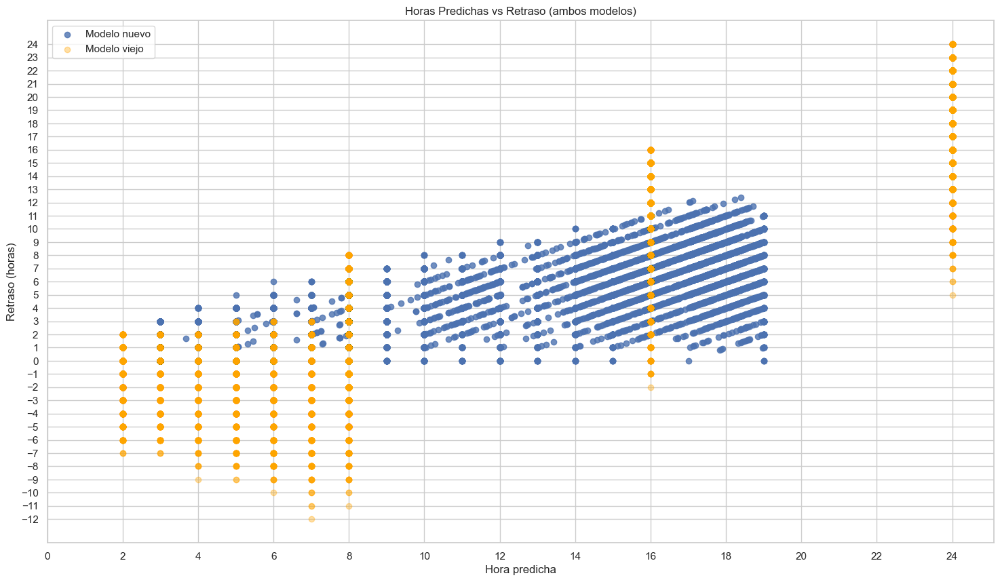

In [79]:
plt.figure(figsize=(18,10))
plt.scatter(df_standard_desempeño_ajustada ['horas_predichas_modelo_nuevo'], df_standard_desempeño_ajustada ['horas_retraso'] , alpha=0.8, label="Modelo nuevo")
plt.scatter(df_exitos['expected_time_hours'], df_exitos['expected_time_hours'] - df_exitos['delivery_time_hours'], color='orange', alpha=0.35, label="Modelo viejo")
plt.yticks(np.arange(-12, 25, 1))
plt.xticks(np.arange(0, 25, 2))
plt.title("Horas Predichas vs Retraso (ambos modelos)")
plt.xlabel("Hora predicha")
plt.ylabel("Retraso (horas)")
plt.legend()
plt.show()

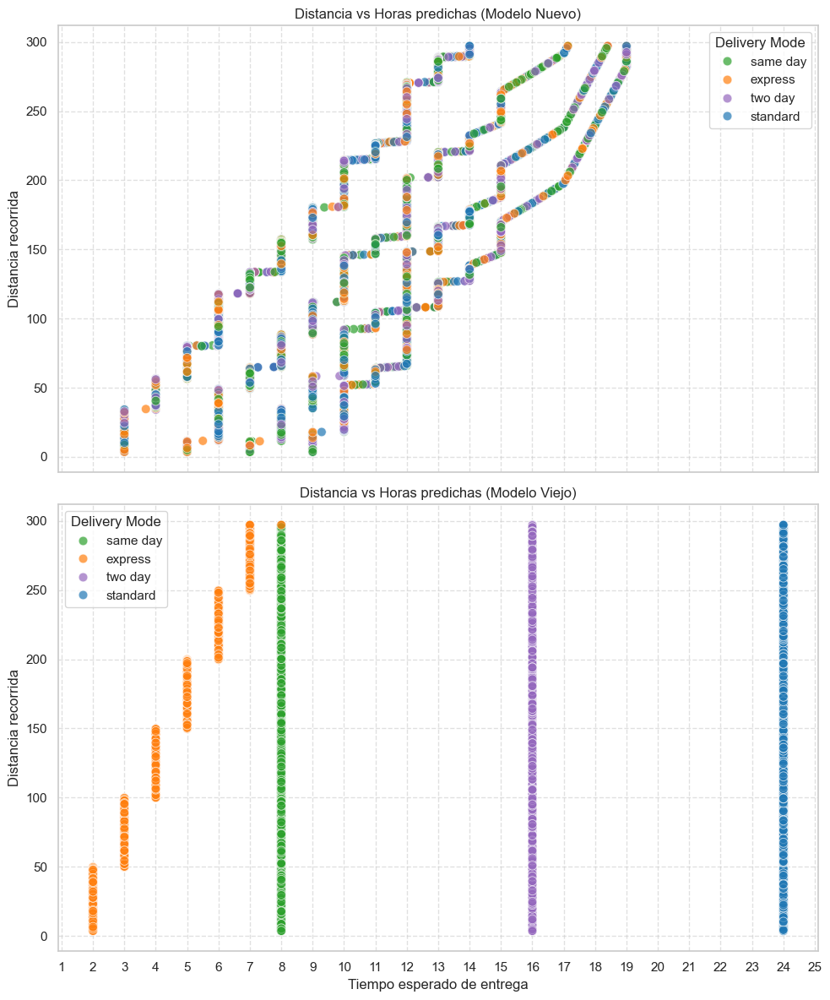

In [80]:
df_3 = df_1.copy()
df_3['expected_time_hours'] = df_standard_desempeño_ajustada ['horas_predichas_modelo_nuevo']

mode_colors = {
    "standard": "#1f77b4",
    "express": "#ff7f0e",
    "same day": "#2ca02c",
    "two day": "#9467bd"
}

fig, axes = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

# Primer gráfico con df_3
sns.scatterplot(
    data=df_3,
    y="distance_km",
    x="expected_time_hours",
    hue="delivery_mode",
    palette=mode_colors,
    alpha=0.7,
    s=60,
    ax=axes[0]
)
axes[0].xaxis.set_major_locator(MultipleLocator(1))
axes[0].set_ylabel("Distancia recorrida")
axes[0].set_xlabel("")
axes[0].set_title("Distancia vs Horas predichas (Modelo Nuevo)")
axes[0].grid(True, linestyle="--", alpha=0.6)
axes[0].legend(title="Delivery Mode")

# Segundo gráfico con df_1
sns.scatterplot(
    data=df_1,
    y="distance_km",
    x="expected_time_hours",
    hue="delivery_mode",
    palette=mode_colors,
    alpha=0.7,
    s=60,
    ax=axes[1]
)
axes[1].xaxis.set_major_locator(MultipleLocator(1))
axes[1].set_ylabel("Distancia recorrida")
axes[1].set_xlabel("Tiempo esperado de entrega")
axes[1].set_title("Distancia vs Horas predichas (Modelo Viejo)")
axes[1].grid(True, linestyle="--", alpha=0.6)
axes[1].legend(title="Delivery Mode")

plt.tight_layout()
plt.show()


# **V. Evaluación de Proyecto**

Se evalua la efectividad del modelo para el negocio.

### **V. 1. Evaluación Resultados**

La amalgama del modelo de regresión lineal junto con el modelo que adiciona el límite inferior cumple con el objetivo de reducir los envíos demorados (en particular anularlos) lo cual se esperaría reduciría las calificaciones negativas asociadas a dichos envíos. En particular reduce de un 21,4% de demorados a un 0% teniendo incluso una reducción del 40% de horas de envío predichas (la estimación es más fina reduciendo el exceso de horas esperadas). Viendo los números obtenidos en el EDA:
* 18331 envíos sin demora (73,3% del dataset) calificados con una media de 4,21 de rating.
* 5341 envíos demorados (21,4% del dataset) calificados con una media de 2,40 de rating.
* 1328 envíos fallidos (5,3% del dataset) calificados con una media de 1,31 de rating.

Esto supone un aumento de la media de rating de la empresa de logistica de un 3,67 a un 4,06 de rating (un aumento relativo del 10,5%).

Cuando se realizan los gráficos de "Distancia recorrida vs Tiempo esperado de entrega" disgregado por el modo de envío, se aprecia que se desvirtúa el sentido que tienen los modos de envío. La causa de esto se debe a que el modo de envío no tenía influencia en el tiempo esperado de entrega y como tal no se utilizó para entrenar el modelo. Según el dataset pareciera que es indistinto el modo de delivery.

### **V. 2. Determinación de próximos pasos**

Con la nueva predicción del tiempo hay que tomar medidas con lo que respecta al modo de delivery. Se sugieren las siguientes opciones:
* Limitar los modos de envío disponibles para el cliente en función de la distancia a la que se encuentra respecto del punto de envío y el clima, es decir, en función del tiempo predicho.
* Brindar un servicio premium real, es decir, que los modos de delivery tengan efectivamente una influencia en cuanto a la celeridad con la que se realizan los deliveries dándole prioridad a los envíos *express* y *same_day*.
* Remover los modos de delivery y limitarse a brindar el mismo servicio a todos los clientes con tiempo exacto o levemente superior.

Función para limitar el modo de envío disponible para el cliente:

In [81]:
def opciones_disponibles_modos (tiempo_predicho):
    if tiempo_predicho > 16:
        orden =3 #orden interno para función de urgencia
        return ("standard"), orden
    elif tiempo_predicho > 8 and tiempo_predicho <= 16:
        orden = 2
        return ("two day", "standard"), orden
    elif tiempo_predicho > 7 and tiempo_predicho <= 8:
        orden = 1
        return ("same day", "two day", "standard"), orden
    else:
        orden = 0
        return ("express", "same day", "two day", "standard"), orden

Además, en caso de no poder modificar la infraestructura para brindar un servicio de delivery premium real, se puede redistribuir el personal en caso recibir envíos catalogados para modalidades que exceden el tiempo requerido por distancia y clima y utilizarlo en envíos de mayor urgencia. La función para indicar una mayor o menor urgencia sería la siguiente:

In [82]:
def medidor_urgencia (tiempo_predicho, modalidad_elegida):
    if modalidad_elegida == "standard":
        tiempo_disponible = 24
        orden = 3
    elif modalidad_elegida == "two day":
        tiempo_disponible = 16
        orden = 2
    elif modalidad_elegida == "same day":
        tiempo_disponible = 8
        orden = 1
    else:  # express
        tiempo_disponible = 7
        orden = 0
    
    tiempo_extra = tiempo_disponible - tiempo_predicho
    _ , orden_limite = opciones_disponibles_modos(tiempo_predicho) # la opción más rápida disponible según el tiempo predicho y, por ende, la que menor tiempo extra tiene
   
    if orden == orden_limite:
        urgencia = 4
        return urgencia, tiempo_extra
    elif orden - orden_limite == 1:
        urgencia = 3
        return urgencia, tiempo_extra
    elif orden - orden_limite == 2:
        urgencia = 2
        return urgencia, tiempo_extra
    else:
        urgencia = 1 #Eligen standard cuando corresponde express
        return urgencia, tiempo_extra


# **VI. Despliegue**

### **VI. 1. Implementación del plan**

1. Se debe integrar el modelo predictor más el modelo sobreestimador de horas a la plataforma de envíos la cual le proveerá de la ubicación del cliente y el pronóstico del día actual.

a) Si se opta por la opción de limitar los módos de envío en función del tiempo predicho:

2. a) Utilizar la función **opciones_disponibles_modos** para limitar los servicios que puede elegir el usuario a los servicios reales en función de su distancia respecto al vendedor y el clima.

3. a) Utilizar la función **medidor_urgencia** para una optimización del uso del personal para realizar los envíos.

b) Si se opta por mejorar el serivicio sin limitar los modos de envío

2. b) Utilizar la función **medidor_urgencia** para una optimización del uso del personal para realizar los envíos.

c) Si se opta por remover los modos de envío solo es necesario el punto 1.

### **VI. 2. Planificar el seguimiento y el mantenimiento**

Es necesario llevar un seguimiento de los resultados de la amalgama del modelo predictor de tiempo y del sobreestimador. En caso de mejorarse los tiempos debido a una mejora del servicio o debido a la correcta selección del modo de envío gracias a la limitación de opciones puede suponer un uso innecesario del modelo sobreestimador así como la necesidad de ajustar el modelo predictor. En caso de empeorarse los tiempos es necesario ajustar tanto el modelo predictor como el modelo sobreestimador.